# Preprocessing the data

*Creators: Lajos Bodo, Szilard Kosa*

Description: The program opens the dataset and preprocesses it.

In [3]:
# This library let's us work with hdf5 format files.
import tables
# Fundamental package for scientific computing with Python.
import numpy as np

# Opening the dataset.
hdf5_path = "dataset.hdf5"
hdf5_file = tables.open_file(hdf5_path, mode='r')
print("Opening %s ."%(hdf5_path))

# Defining the number of pictures loaded for each person.
picture_per_person = 10

# Lists for storing the data from the dataset.
X = []
Y = []

# Defining variables needed for the algorithm.
data_num = hdf5_file.root.images.shape[0]
prev_label = hdf5_file.root.labels[0]
count = 0

# Reads the defined amount of pictures for each person.
for i in range(data_num):
    label = hdf5_file.root.labels[i]
    # print("Loading: %.3d %%"%(float(i)/data_num))
    if label != prev_label:
        count = 0

    if count < picture_per_person:
        X.append(hdf5_file.root.images[i])
        Y.append(label)
        count += 1
     
    prev_label = label

# Closing the file.
hdf5_file.close()
print("HDF5 file closed.")

Opening dataset.hdf5 .
HDF5 file closed.


In [4]:
# Defining the variables to split the dataset.
valid_split = 0.1
test_split = 0.1
# Calculating the splitting indexes.
nb_samples = len(Y)
valid_index = int(nb_samples*(1-valid_split-test_split)//picture_per_person)*picture_per_person
test_index = int(nb_samples*(1-test_split)//picture_per_person)*picture_per_person

# Splitting and standardizing the dataset.
X_train = X[0:valid_index]
Y_train = Y[0:valid_index]
X_valid = X[valid_index:test_index]
Y_valid = Y[valid_index:test_index]
X_test  = X[test_index:]
Y_test  = Y[test_index:]
print("Number of elements in X_train: %i" %(len(X_train)))
print("Number of elements in Y_train: %i" %(len(Y_train)))
print("Number of elements in X_valid: %i" %(len(X_valid)))
print("Number of elements in Y_valid: %i" %(len(Y_valid)))
print("Number of elements in X_test: %i" %(len(X_test)))
print("Number of elements in Y_test: %i" %(len(Y_test)))

Number of elements in X_train: 70510
Number of elements in Y_train: 70510
Number of elements in X_valid: 8810
Number of elements in Y_valid: 8810
Number of elements in X_test: 8820
Number of elements in Y_test: 8820


## Preproccessing training data

For the training here we group the data into batches. A batch contains a defined amount of pictures for the specified number of people.

In [5]:
X_train_batch = []
Y_train_batch = []
# Defining the number of persons included in a batch.
person_per_batch = 10
# Calculating the number of pictures in a batch.
picture_per_batch = picture_per_person*person_per_batch
# Calculating number of batches.
batch_number = int(len(Y_train)//picture_per_batch)
print("The number of batches used in training: {}".format(batch_number))
for i in range(batch_number):
    X_train_batch.append(X_train[i*picture_per_batch:(i+1)*picture_per_batch])
    Y_train_batch.append(Y_train[i*picture_per_batch:(i+1)*picture_per_batch])

=================== Training data ===================
The number of batches used in training: 705


C:\programs\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


0


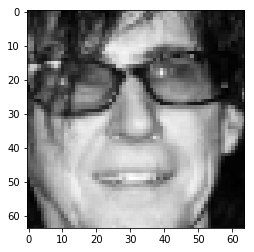

1


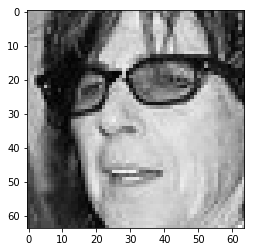

2


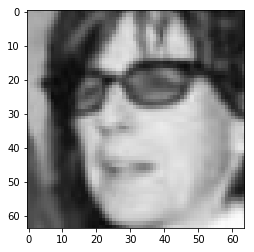

3


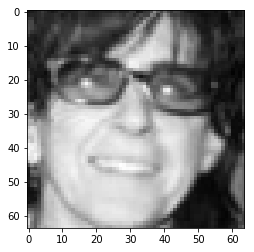

4


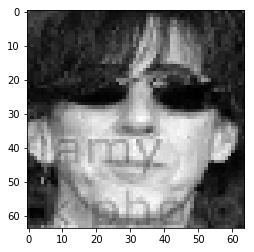

5


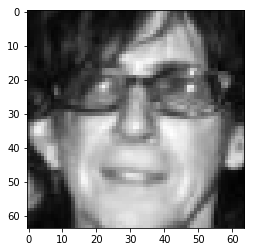

6


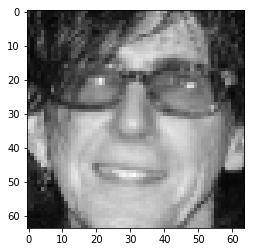

7


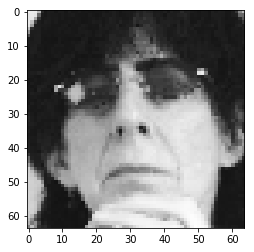

8


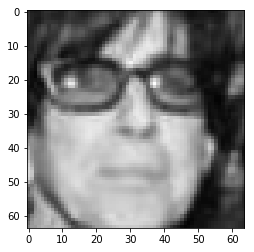

9


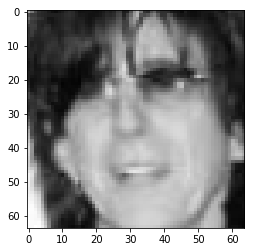

10


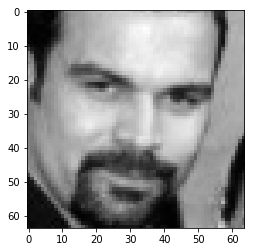

11


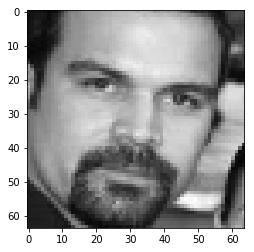

12


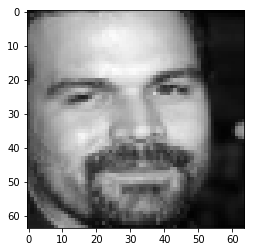

13


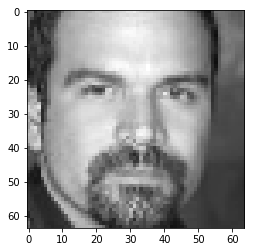

14


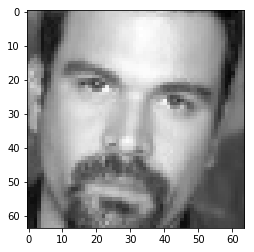

15


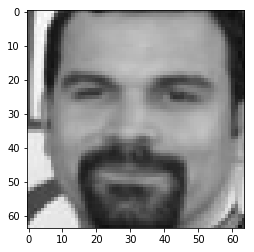

16


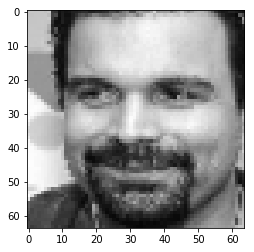

17


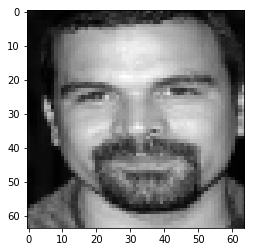

18


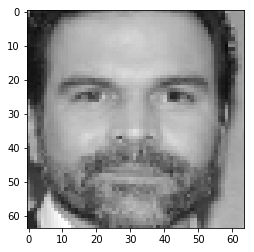

19


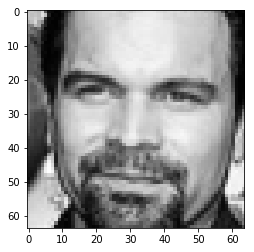

20


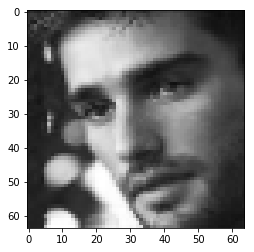

21


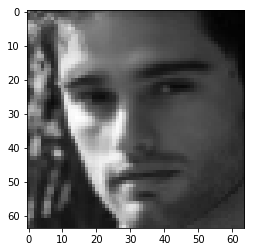

22


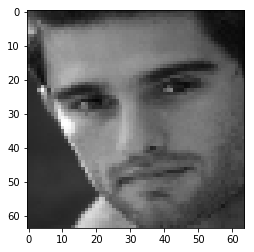

23


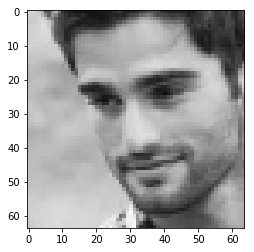

24


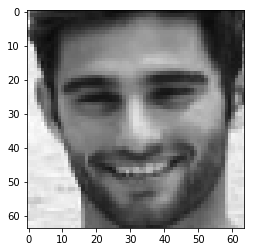

25


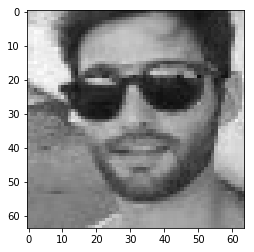

26


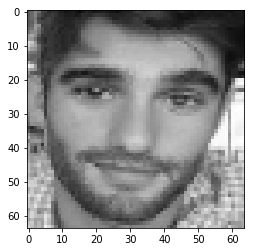

27


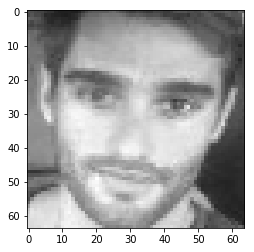

28


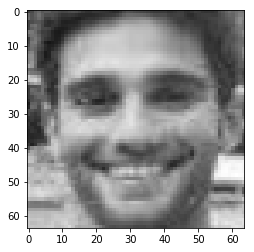

29


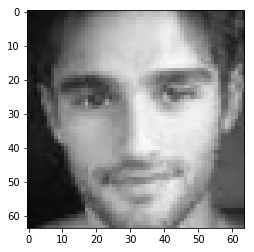

30


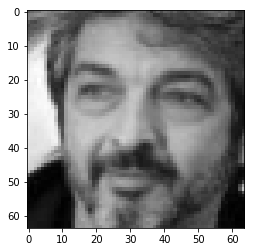

31


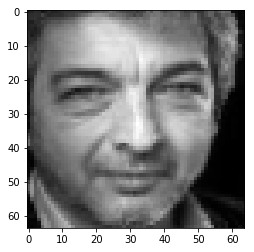

32


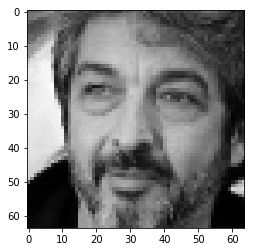

33


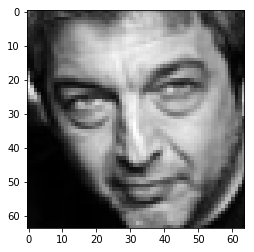

34


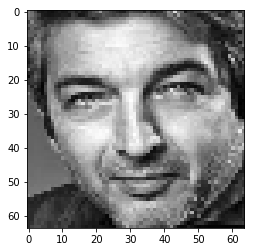

35


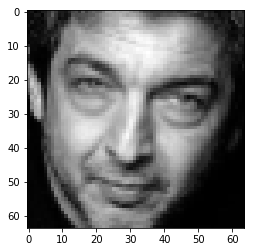

36


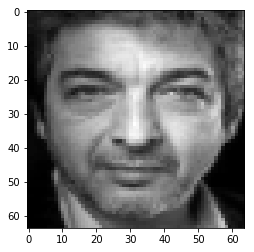

37


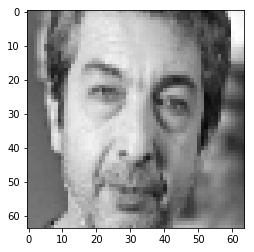

38


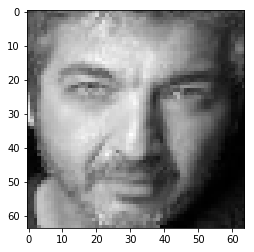

39


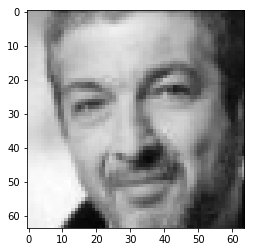

40


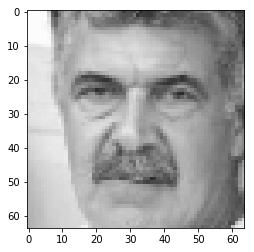

41


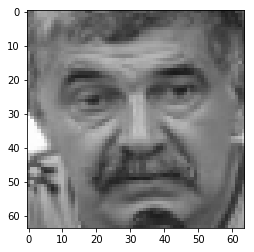

42


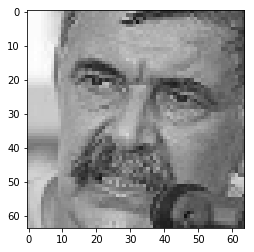

43


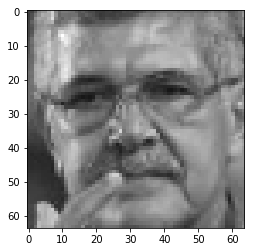

44


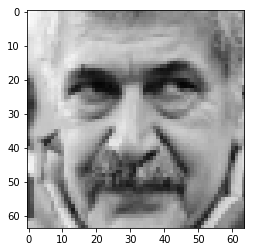

45


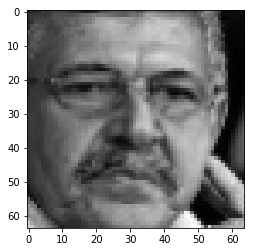

46


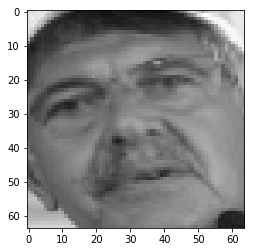

47


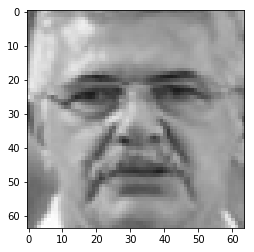

48


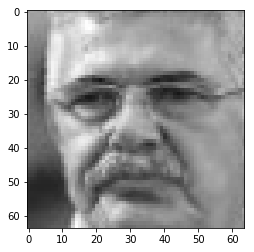

49


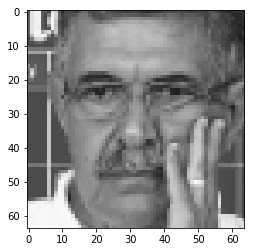

50


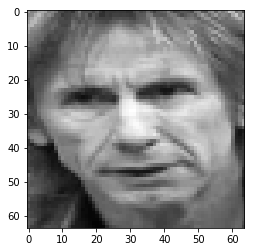

51


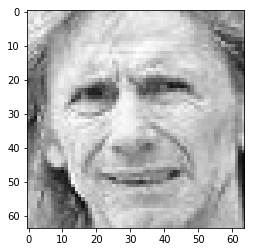

52


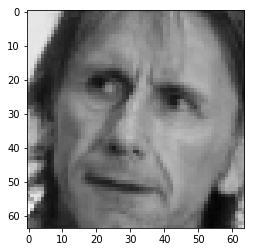

53


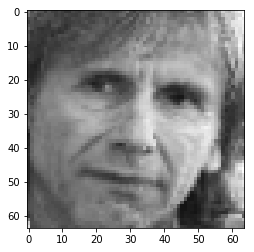

54


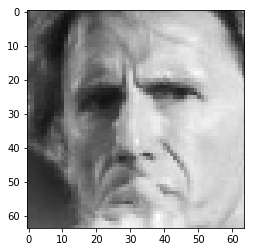

55


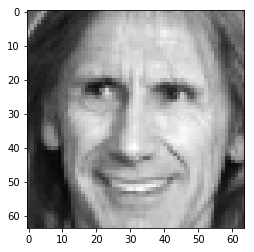

56


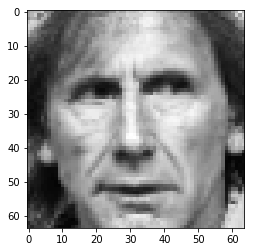

57


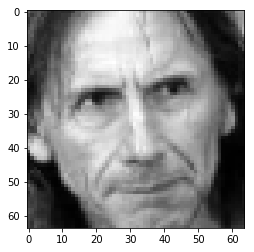

58


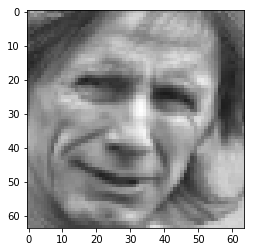

59


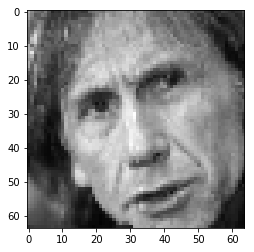

60


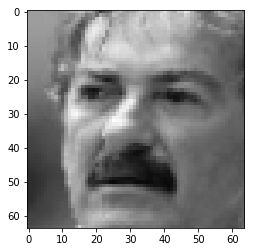

61


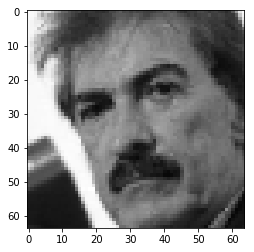

62


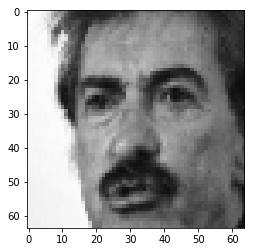

63


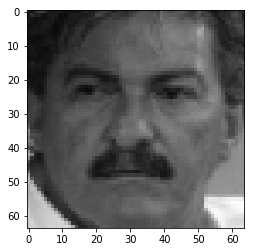

64


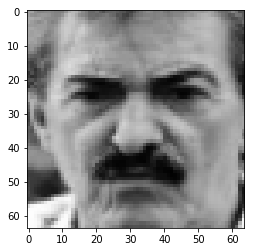

65


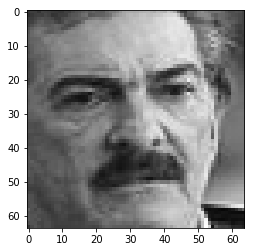

66


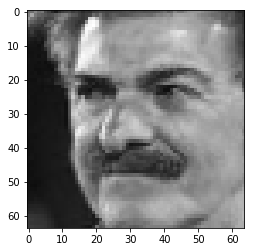

67


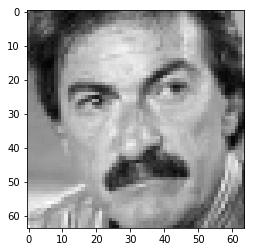

68


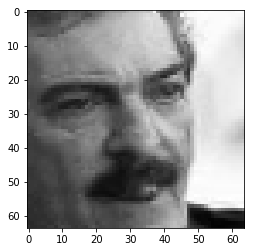

69


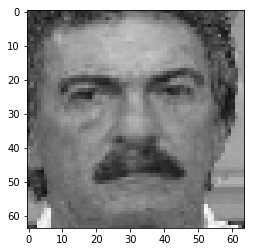

70


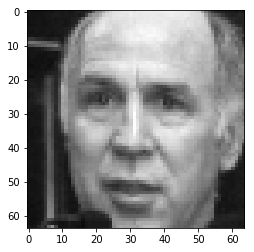

71


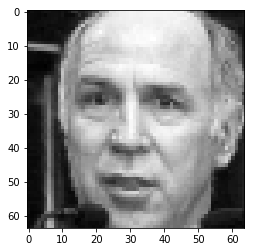

72


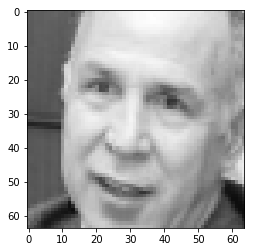

73


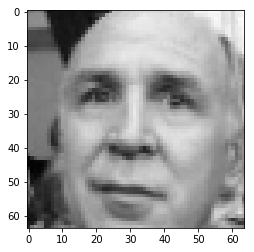

74


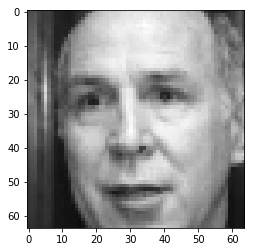

75


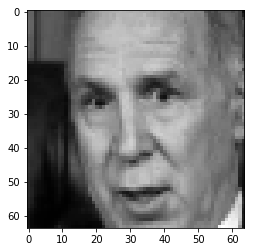

76


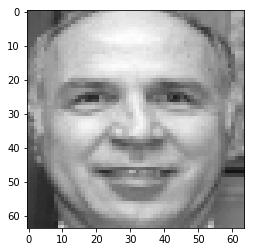

77


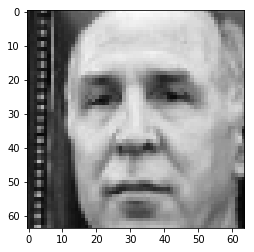

78


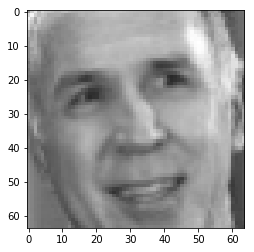

79


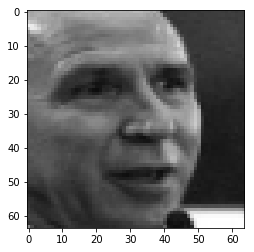

80


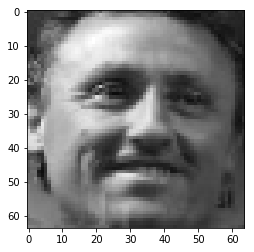

81


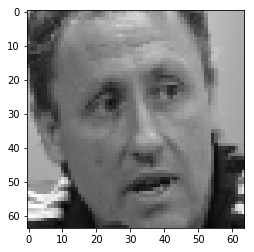

82


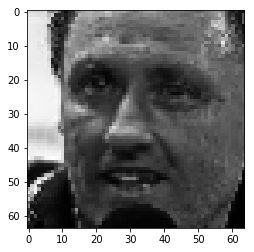

83


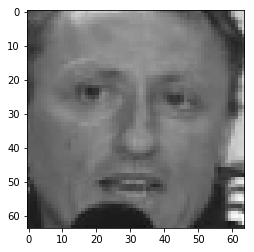

84


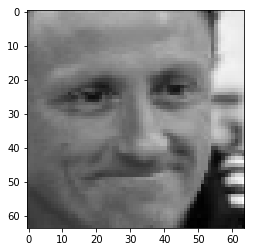

85


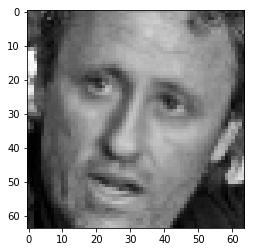

86


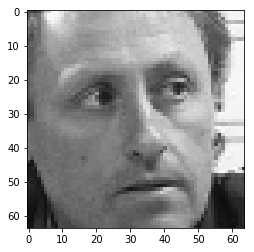

87


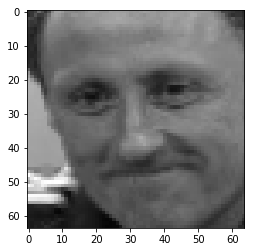

88


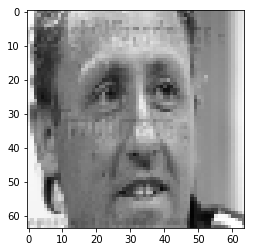

89


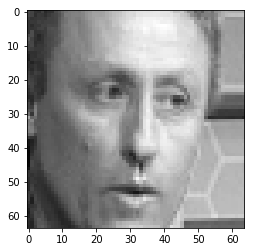

90


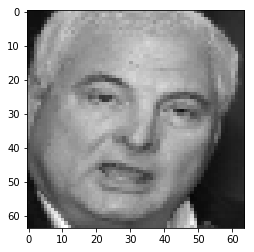

91


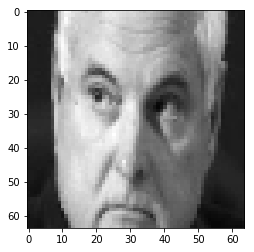

92


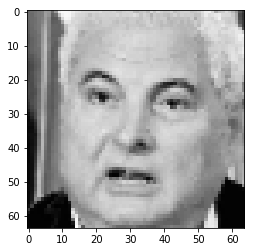

93


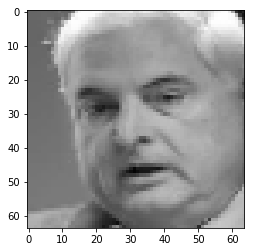

94


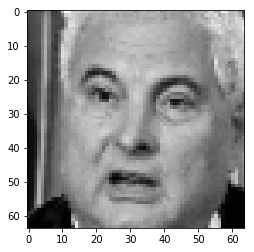

95


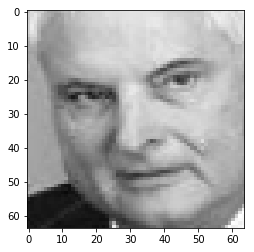

96


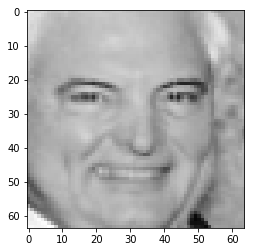

97


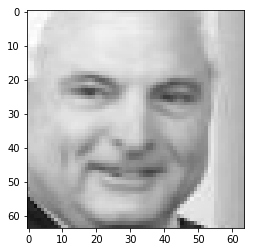

98


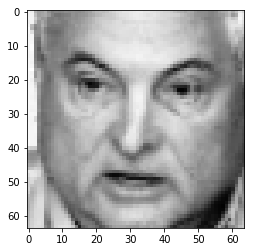

99


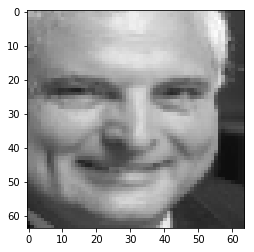

In [6]:
# Activating the notebook style display.
%matplotlib inline
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img

# The index of the displayed batch.
ind = 704
# Displaying the batch.
for i in range(len(X_train_batch[ind])):
    print(i)
    plt.imshow(array_to_img(X_train_batch[ind][i].reshape(X_train_batch[ind][i].shape + (1,))))
    plt.show()

## Preproccessing validation data 

In [7]:
# Creating lists for the validation data.
# The positives will contain pairs from the same person.
# The negatives will contain pairs from two different persons.
X_valid_positives = []
Y_valid_positives = []
X_valid_negatives = []
Y_valid_negatives = []

# The validation data is cut in half annd loaded into the lists defined above.
half_index_valid = int((0.5*len(Y_valid)//picture_per_person)*picture_per_person)
X_valid_positives = X_valid[0:half_index_valid]
Y_valid_positives = Y_valid[0:half_index_valid]
print("Number of elements in X_valid_positives: %i" %(len(X_valid_positives)))
print("Number of elements in Y_valid_positives: %i" %(len(Y_valid_positives)))

# The negatives list is made with the following technique:
# In the first half of the list, to every second place we insert a random element from the second half.
# This way every two following pictures are from different persons.
half_index_valid_negatives = half_index_valid + int((0.5*len(Y_valid[half_index_valid:])//picture_per_person)*picture_per_person)
x_valid_negatives = X_valid[half_index_valid:half_index_valid_negatives]
y_valid_negatives = Y_valid[half_index_valid:half_index_valid_negatives]
randperm = np.random.permutation(len(Y_valid[half_index_valid_negatives:]))
for i in range(int(len(x_valid_negatives)/picture_per_person)):
    for j in range(picture_per_person):
        X_valid_negatives.append(x_valid_negatives[i*picture_per_person+j])
        X_valid_negatives.append(X_valid[randperm[i*picture_per_person+j]+half_index_valid_negatives])
        Y_valid_negatives.append(y_valid_negatives[i*picture_per_person+j])
        Y_valid_negatives.append(Y_valid[randperm[i*picture_per_person+j]+half_index_valid_negatives])
print("Number of elements in X_valid_negatives: %i" %(len(X_valid_negatives)))
print("Number of elements in Y_valid_negatives: %i" %(len(Y_valid_negatives)))

=================== Validation data ===================
Number of elements in X_valid_positives: 4400
Number of elements in Y_valid_positives: 4400
Number of elements in X_valid_negatives: 4400
Number of elements in Y_valid_negatives: 4400


The 0th picture of valid positives


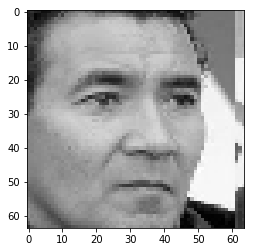

The 1th picture of valid positives


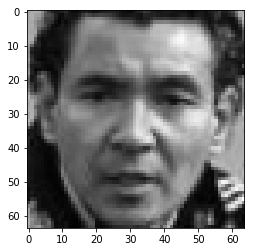

The 2th picture of valid positives


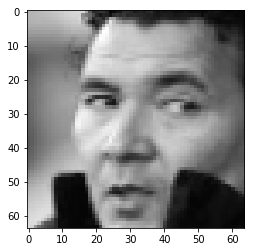

The 3th picture of valid positives


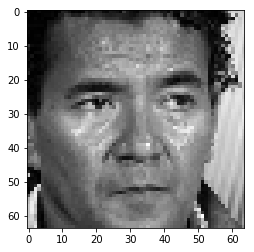

The 4th picture of valid positives


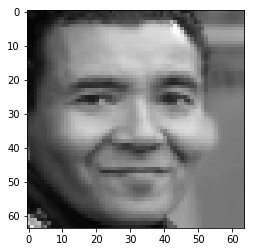

The 5th picture of valid positives


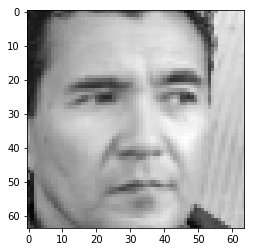

The 6th picture of valid positives


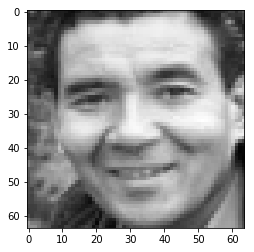

The 7th picture of valid positives


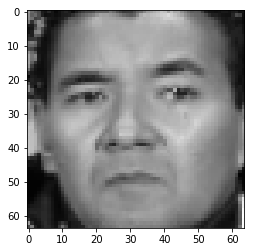

The 8th picture of valid positives


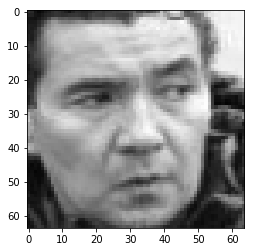

The 9th picture of valid positives


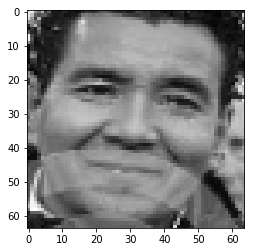

The 10th picture of valid positives


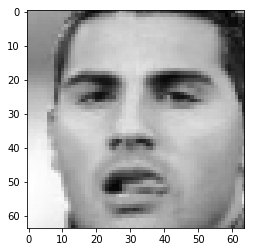

The 11th picture of valid positives


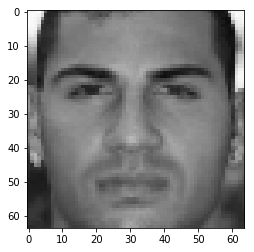

The 12th picture of valid positives


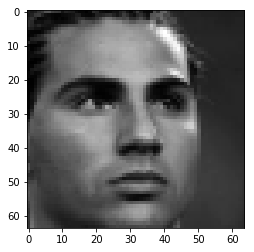

The 13th picture of valid positives


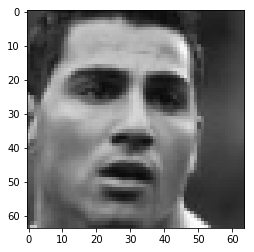

The 14th picture of valid positives


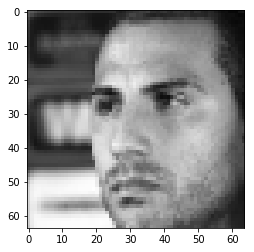

The 15th picture of valid positives


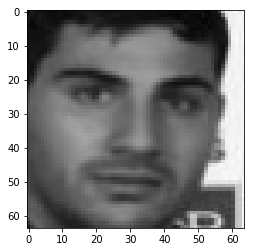

The 16th picture of valid positives


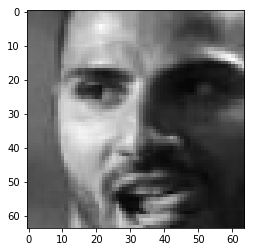

The 17th picture of valid positives


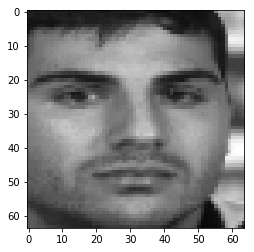

The 18th picture of valid positives


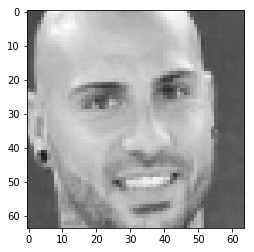

The 19th picture of valid positives


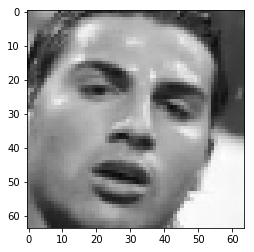

The 20th picture of valid positives


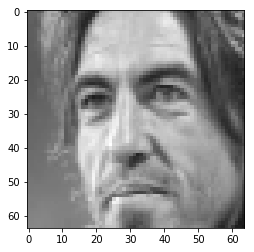

The 21th picture of valid positives


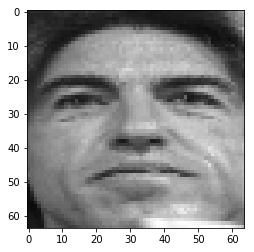

The 22th picture of valid positives


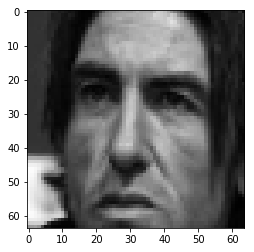

The 23th picture of valid positives


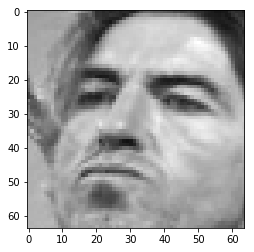

The 24th picture of valid positives


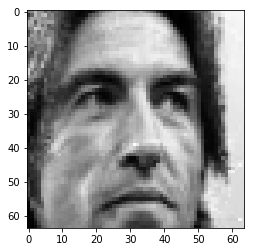

The 25th picture of valid positives


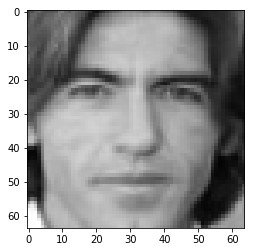

The 26th picture of valid positives


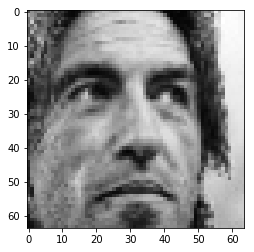

The 27th picture of valid positives


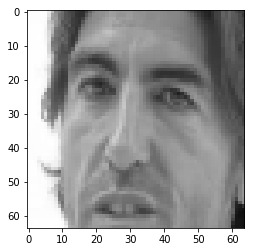

The 28th picture of valid positives


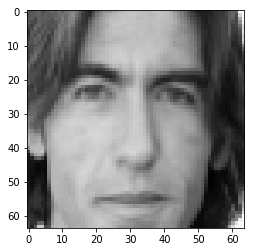

The 29th picture of valid positives


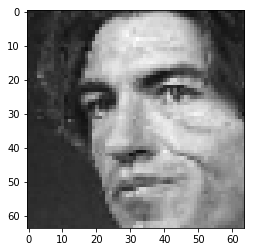

The 30th picture of valid positives


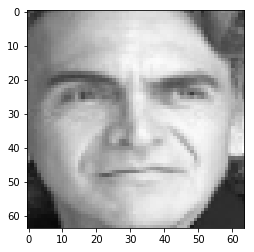

The 31th picture of valid positives


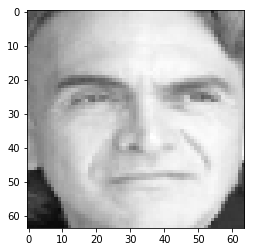

The 32th picture of valid positives


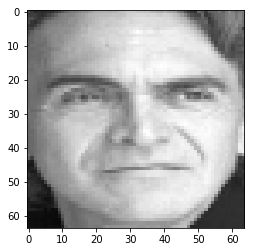

The 33th picture of valid positives


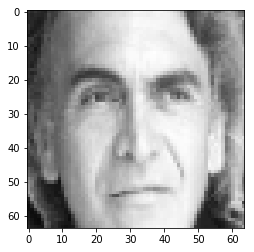

The 34th picture of valid positives


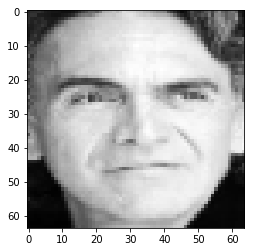

The 35th picture of valid positives


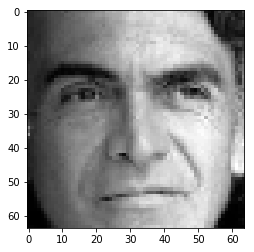

The 36th picture of valid positives


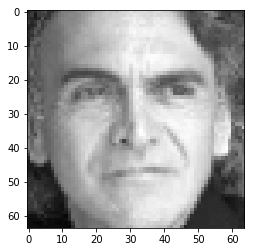

The 37th picture of valid positives


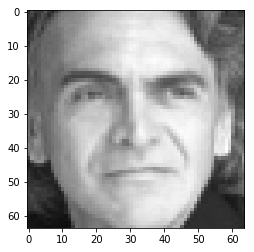

The 38th picture of valid positives


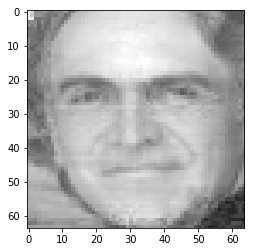

The 39th picture of valid positives


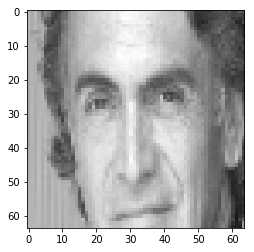

The 40th picture of valid positives


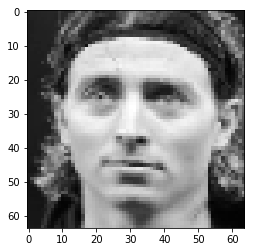

The 41th picture of valid positives


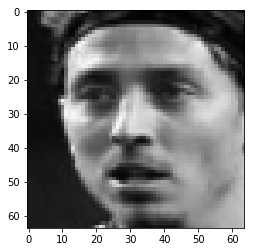

The 42th picture of valid positives


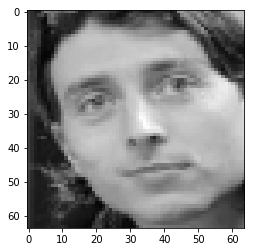

The 43th picture of valid positives


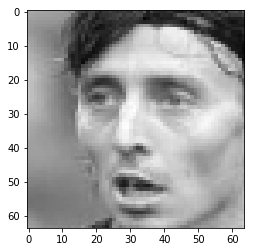

The 44th picture of valid positives


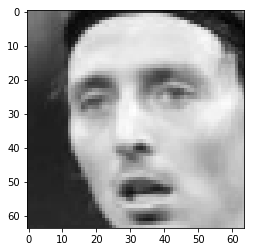

The 45th picture of valid positives


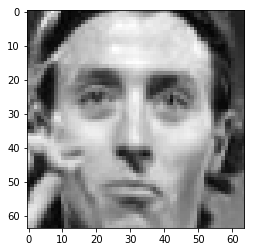

The 46th picture of valid positives


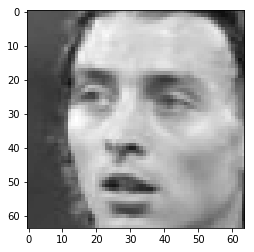

The 47th picture of valid positives


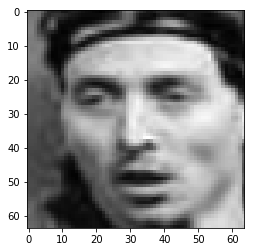

The 48th picture of valid positives


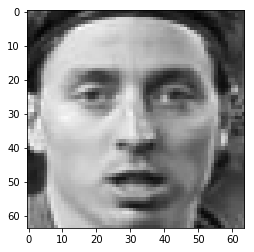

The 49th picture of valid positives


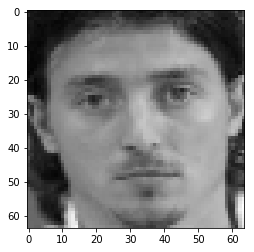

The 50th picture of valid positives


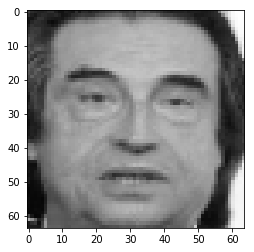

The 51th picture of valid positives


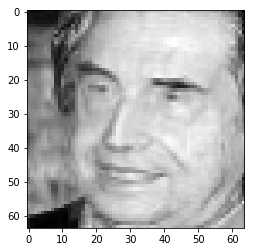

The 52th picture of valid positives


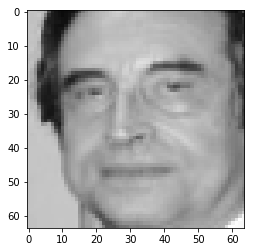

The 53th picture of valid positives


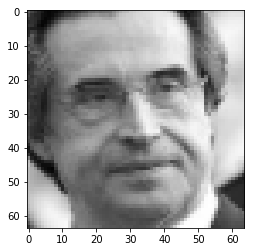

The 54th picture of valid positives


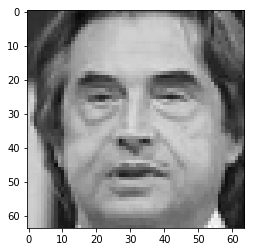

The 55th picture of valid positives


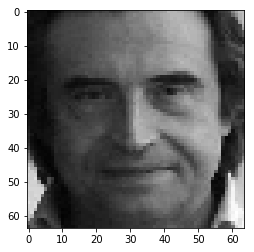

The 56th picture of valid positives


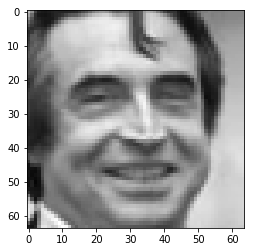

The 57th picture of valid positives


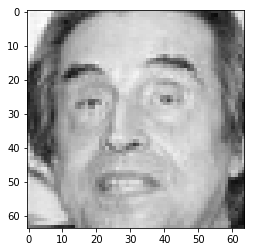

The 58th picture of valid positives


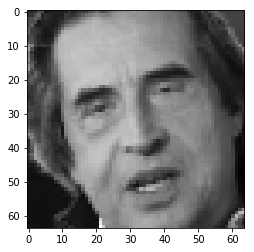

The 59th picture of valid positives


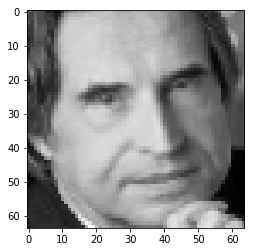

The 60th picture of valid positives


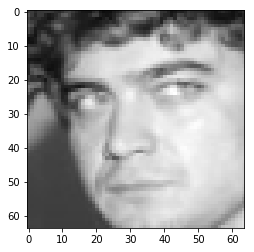

The 61th picture of valid positives


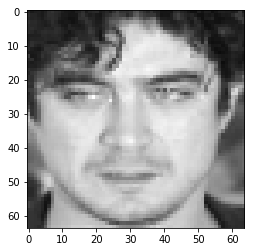

The 62th picture of valid positives


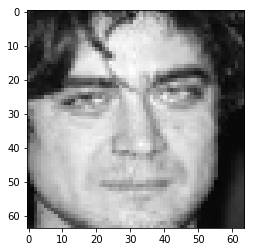

The 63th picture of valid positives


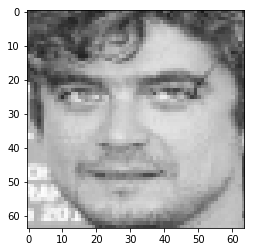

The 64th picture of valid positives


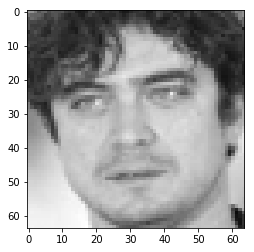

The 65th picture of valid positives


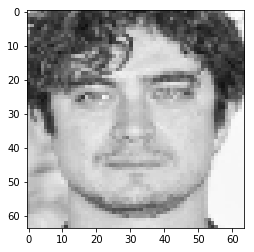

The 66th picture of valid positives


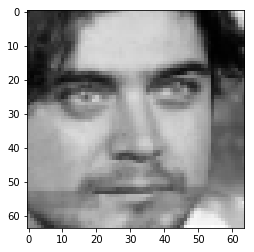

The 67th picture of valid positives


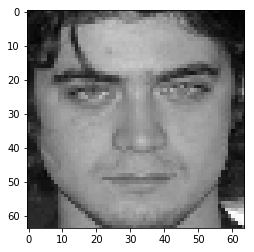

The 68th picture of valid positives


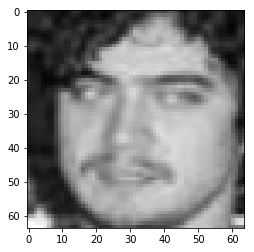

The 69th picture of valid positives


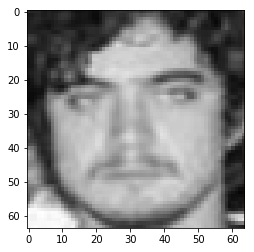

The 70th picture of valid positives


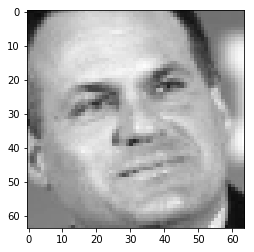

The 71th picture of valid positives


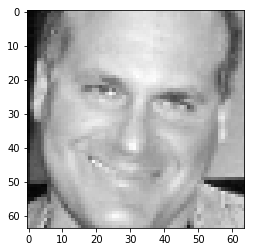

The 72th picture of valid positives


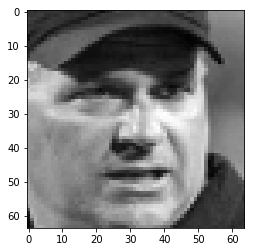

The 73th picture of valid positives


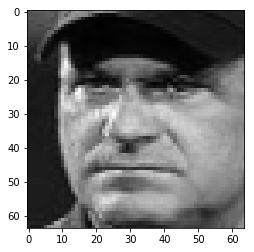

The 74th picture of valid positives


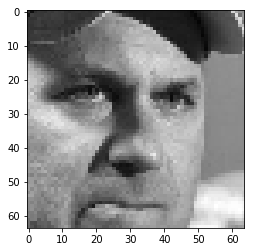

The 75th picture of valid positives


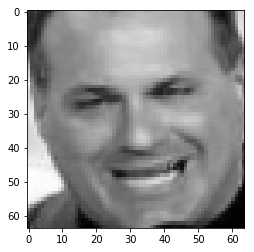

The 76th picture of valid positives


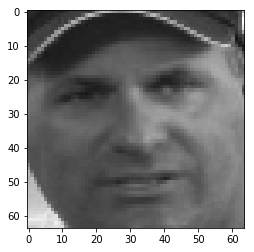

The 77th picture of valid positives


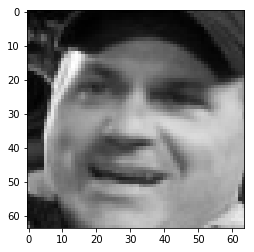

The 78th picture of valid positives


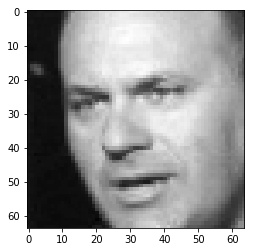

The 79th picture of valid positives


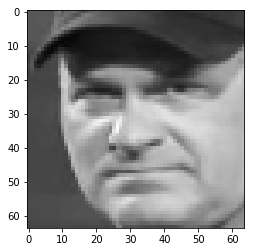

The 80th picture of valid positives


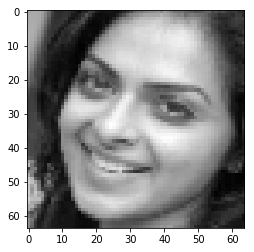

The 81th picture of valid positives


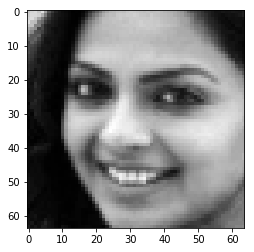

The 82th picture of valid positives


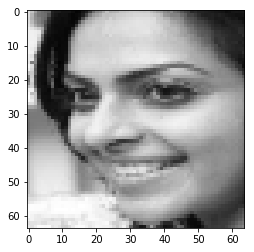

The 83th picture of valid positives


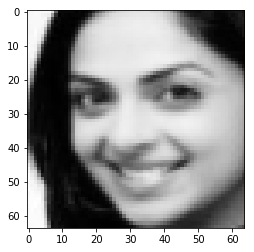

The 84th picture of valid positives


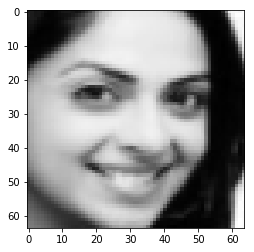

The 85th picture of valid positives


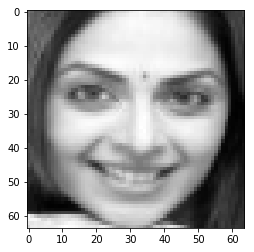

The 86th picture of valid positives


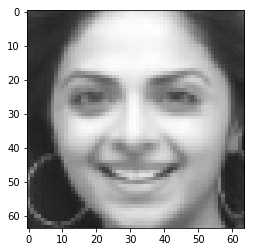

The 87th picture of valid positives


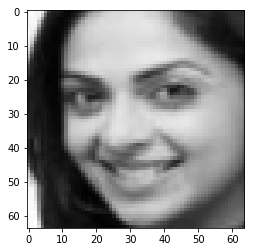

The 88th picture of valid positives


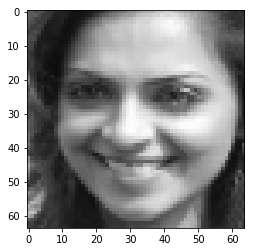

The 89th picture of valid positives


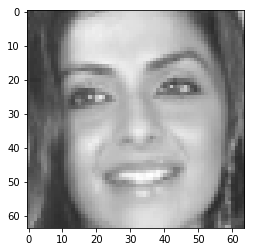

The 90th picture of valid positives


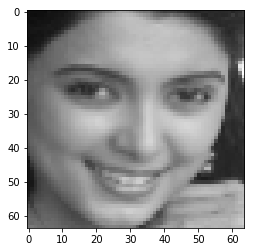

The 91th picture of valid positives


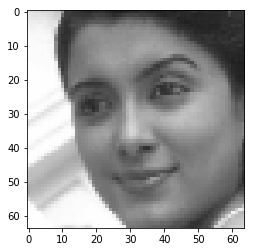

The 92th picture of valid positives


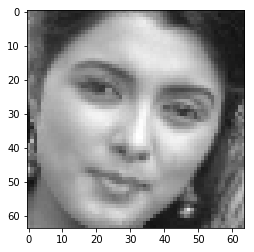

The 93th picture of valid positives


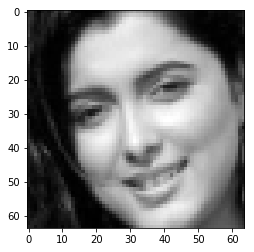

The 94th picture of valid positives


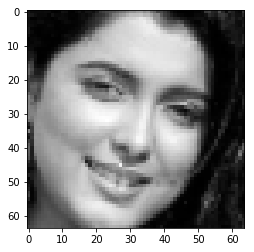

The 95th picture of valid positives


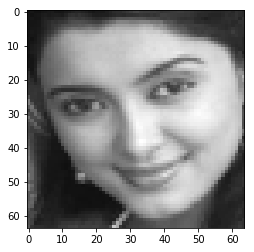

The 96th picture of valid positives


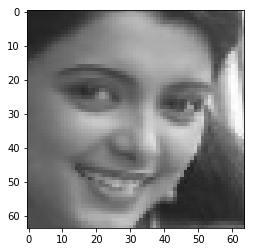

The 97th picture of valid positives


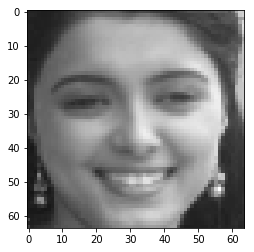

The 98th picture of valid positives


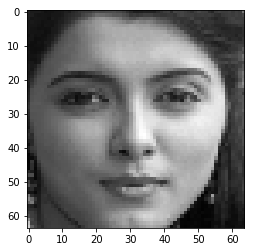

The 99th picture of valid positives


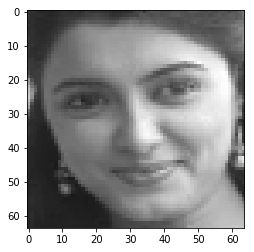

The 100th picture of valid positives


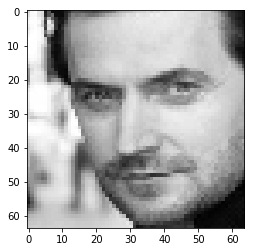

The 101th picture of valid positives


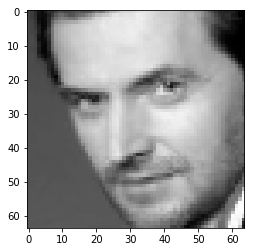

The 102th picture of valid positives


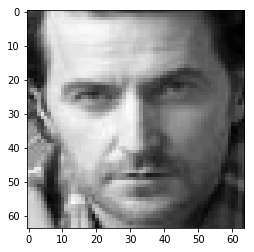

The 103th picture of valid positives


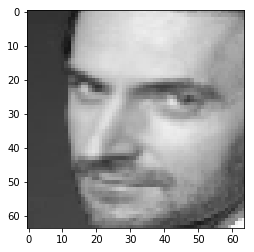

The 104th picture of valid positives


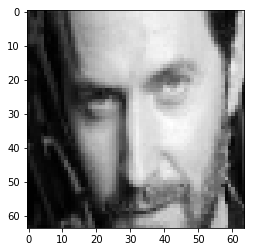

The 105th picture of valid positives


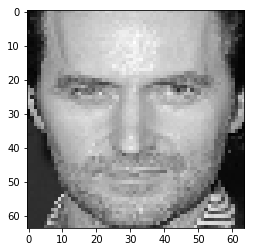

The 106th picture of valid positives


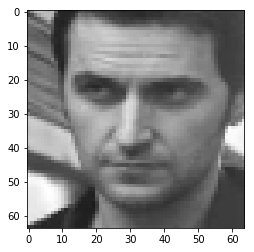

The 107th picture of valid positives


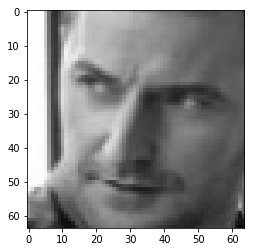

The 108th picture of valid positives


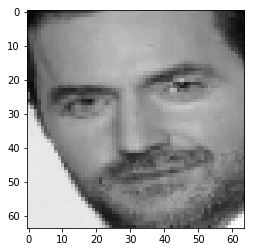

The 109th picture of valid positives


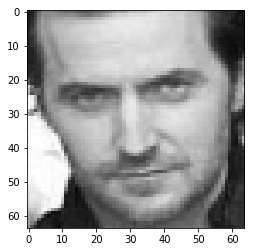

The 110th picture of valid positives


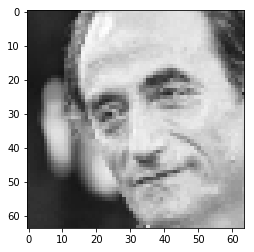

The 111th picture of valid positives


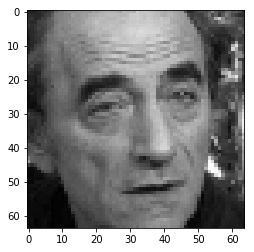

The 112th picture of valid positives


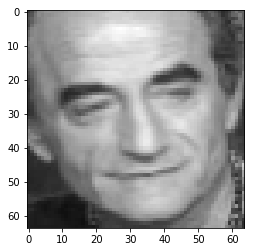

The 113th picture of valid positives


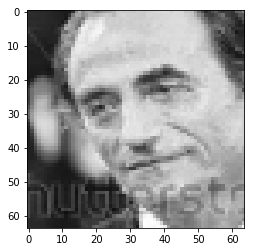

The 114th picture of valid positives


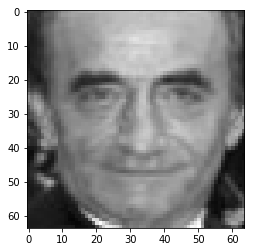

The 115th picture of valid positives


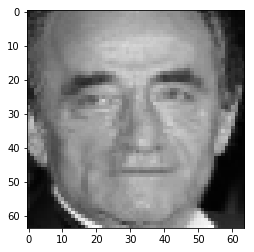

The 116th picture of valid positives


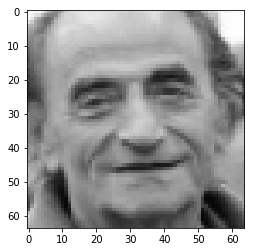

The 117th picture of valid positives


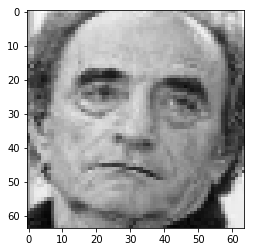

The 118th picture of valid positives


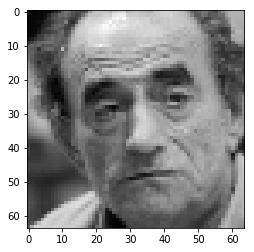

The 119th picture of valid positives


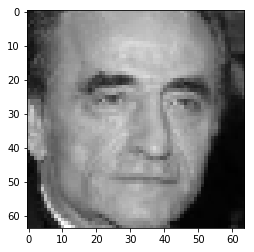

The 120th picture of valid positives


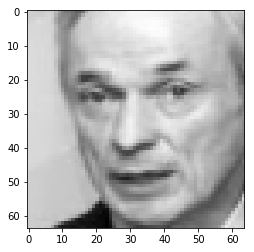

The 121th picture of valid positives


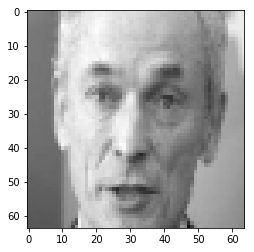

The 122th picture of valid positives


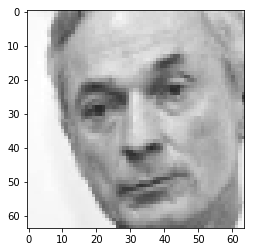

The 123th picture of valid positives


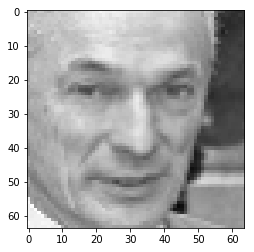

The 124th picture of valid positives


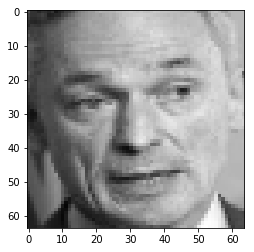

The 125th picture of valid positives


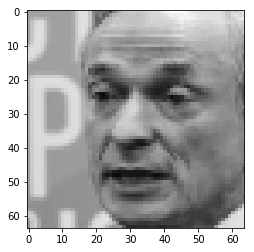

The 126th picture of valid positives


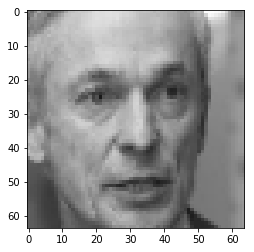

The 127th picture of valid positives


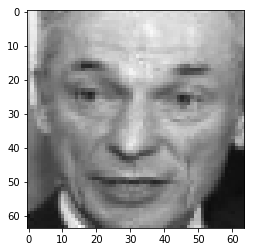

The 128th picture of valid positives


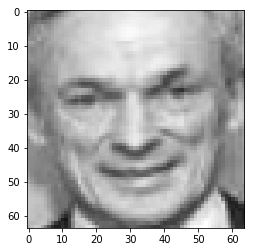

The 129th picture of valid positives


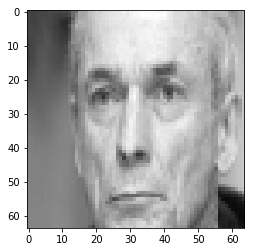

The 130th picture of valid positives


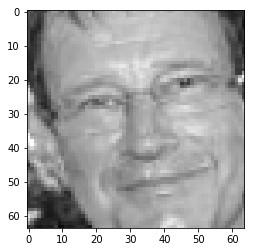

The 131th picture of valid positives


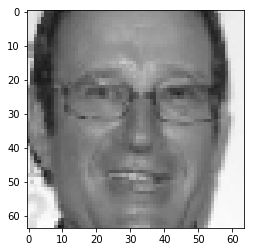

The 132th picture of valid positives


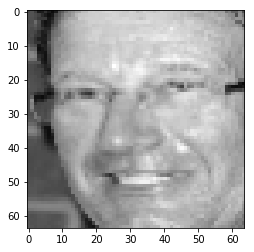

The 133th picture of valid positives


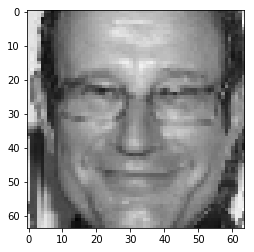

The 134th picture of valid positives


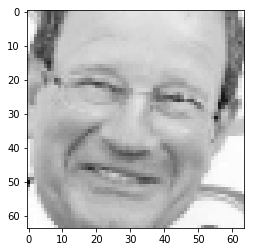

The 135th picture of valid positives


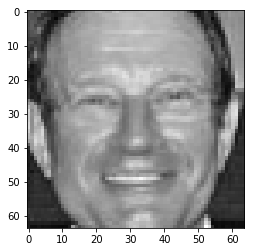

The 136th picture of valid positives


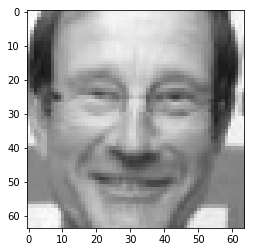

The 137th picture of valid positives


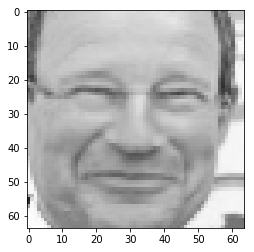

The 138th picture of valid positives


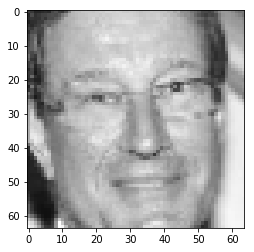

The 139th picture of valid positives


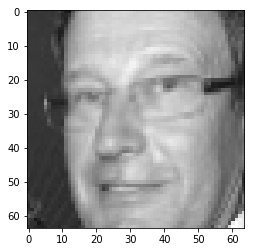

The 140th picture of valid positives


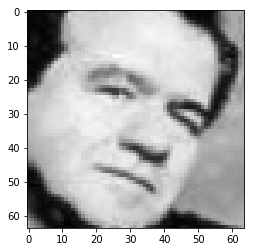

The 141th picture of valid positives


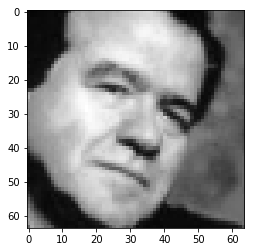

The 142th picture of valid positives


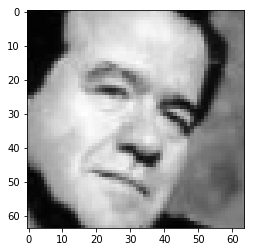

The 143th picture of valid positives


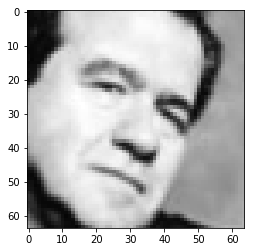

The 144th picture of valid positives


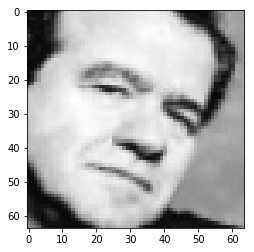

The 145th picture of valid positives


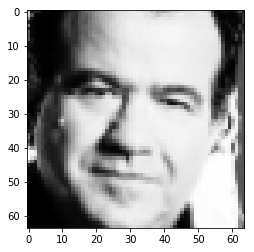

The 146th picture of valid positives


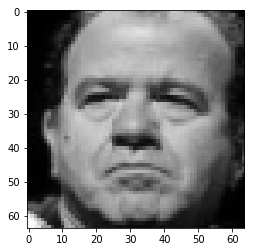

The 147th picture of valid positives


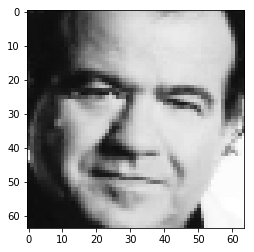

The 148th picture of valid positives


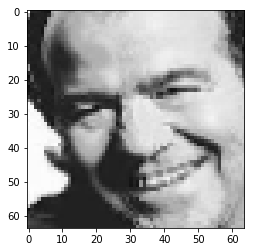

The 149th picture of valid positives


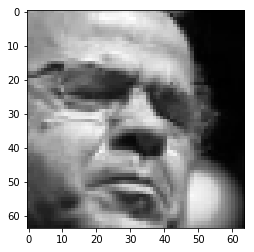

The 150th picture of valid positives


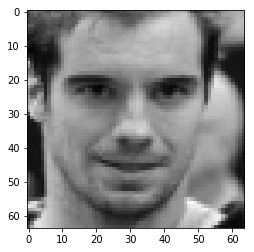

The 151th picture of valid positives


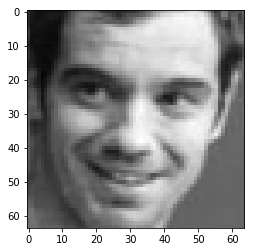

The 152th picture of valid positives


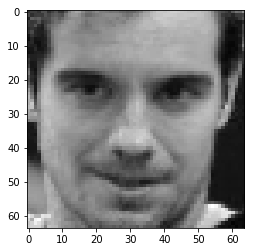

The 153th picture of valid positives


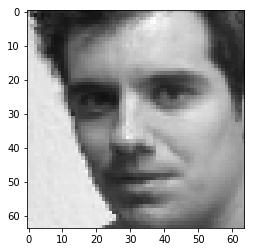

The 154th picture of valid positives


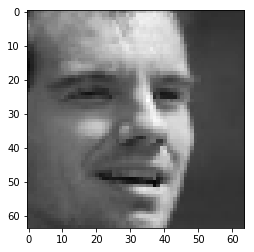

The 155th picture of valid positives


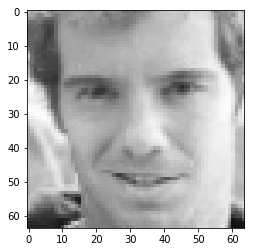

The 156th picture of valid positives


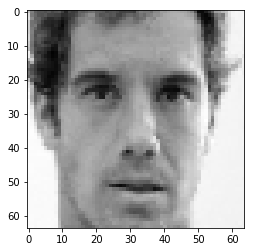

The 157th picture of valid positives


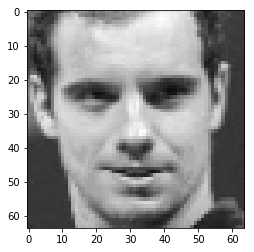

The 158th picture of valid positives


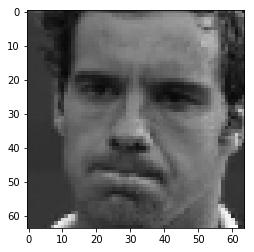

The 159th picture of valid positives


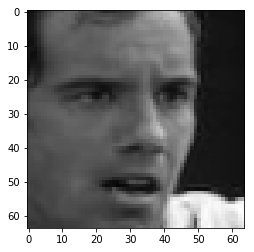

The 160th picture of valid positives


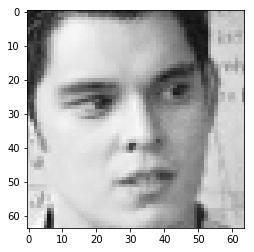

The 161th picture of valid positives


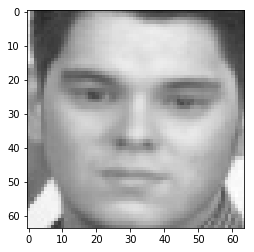

The 162th picture of valid positives


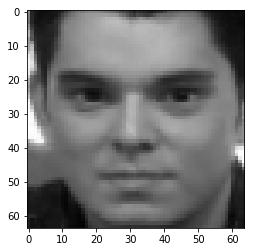

The 163th picture of valid positives


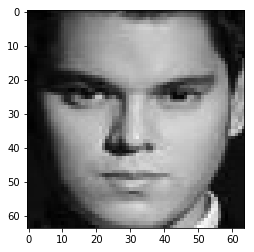

The 164th picture of valid positives


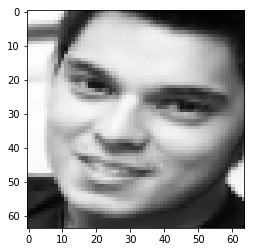

The 165th picture of valid positives


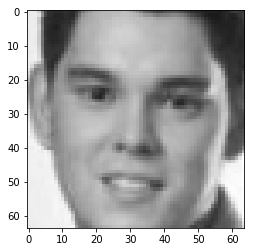

The 166th picture of valid positives


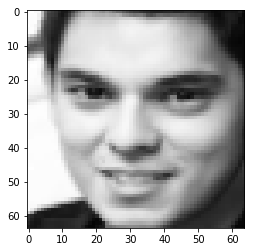

The 167th picture of valid positives


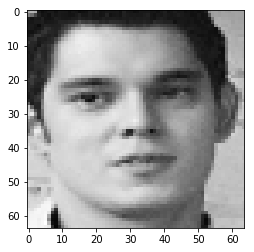

The 168th picture of valid positives


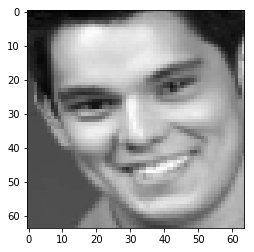

The 169th picture of valid positives


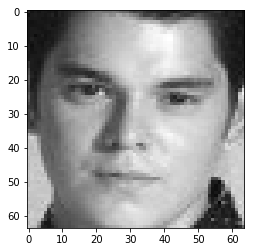

The 170th picture of valid positives


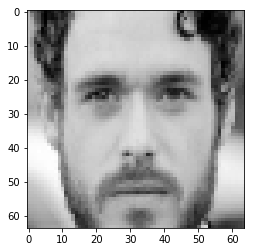

The 171th picture of valid positives


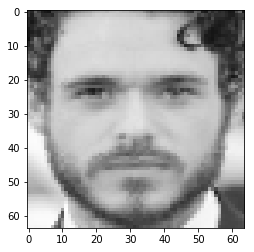

The 172th picture of valid positives


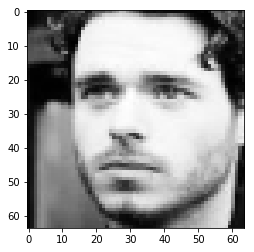

The 173th picture of valid positives


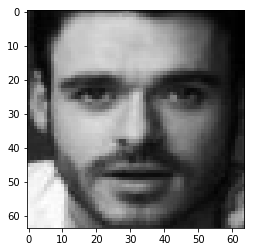

The 174th picture of valid positives


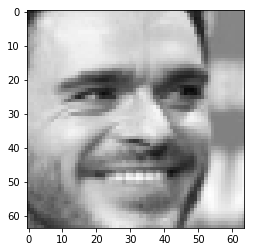

The 175th picture of valid positives


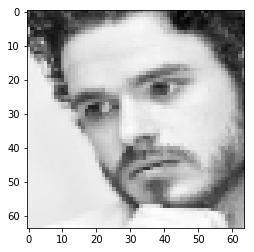

The 176th picture of valid positives


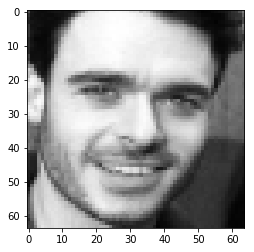

The 177th picture of valid positives


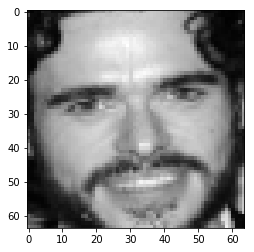

The 178th picture of valid positives


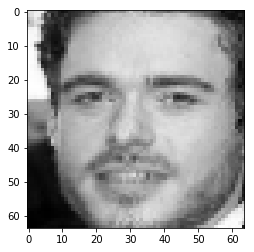

The 179th picture of valid positives


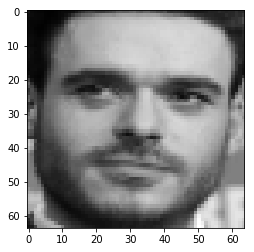

The 180th picture of valid positives


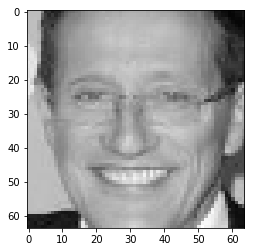

The 181th picture of valid positives


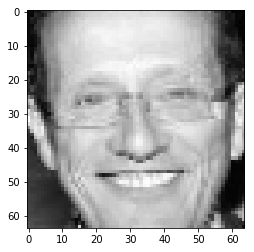

The 182th picture of valid positives


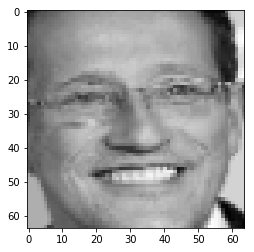

The 183th picture of valid positives


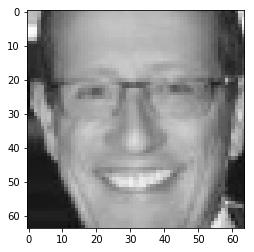

The 184th picture of valid positives


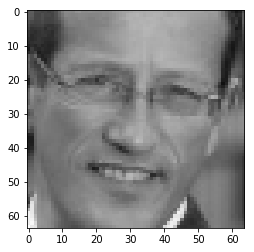

The 185th picture of valid positives


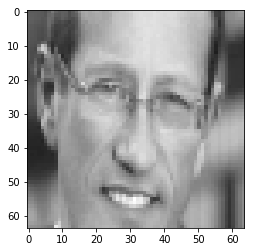

The 186th picture of valid positives


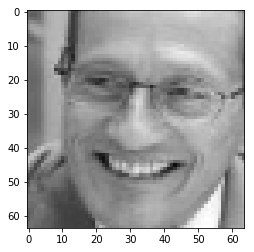

The 187th picture of valid positives


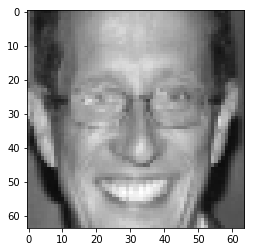

The 188th picture of valid positives


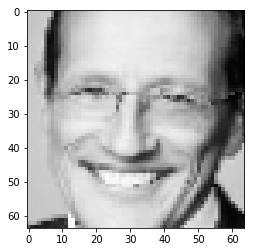

The 189th picture of valid positives


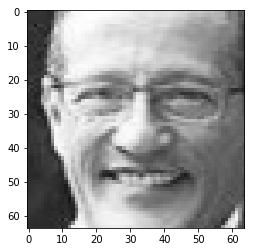

The 190th picture of valid positives


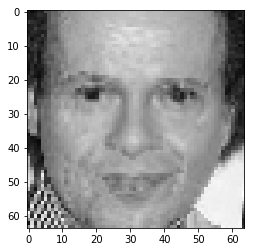

The 191th picture of valid positives


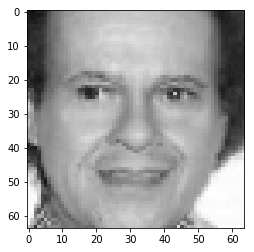

The 192th picture of valid positives


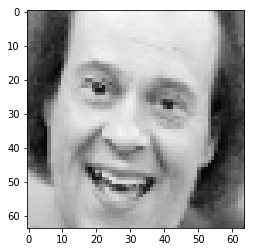

The 193th picture of valid positives


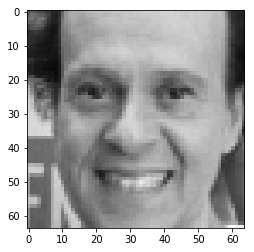

The 194th picture of valid positives


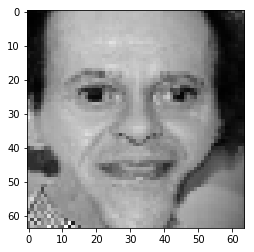

The 195th picture of valid positives


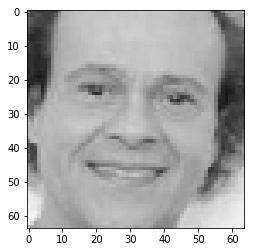

The 196th picture of valid positives


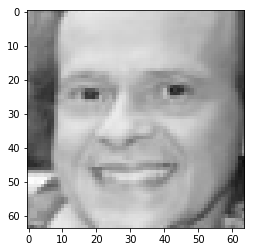

The 197th picture of valid positives


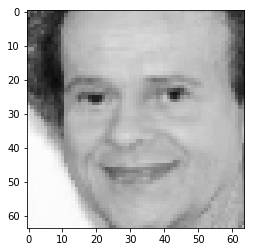

The 198th picture of valid positives


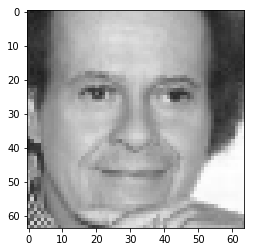

The 199th picture of valid positives


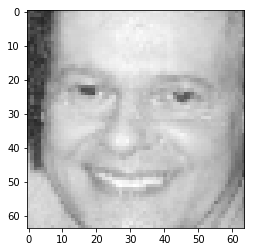

The 200th picture of valid positives


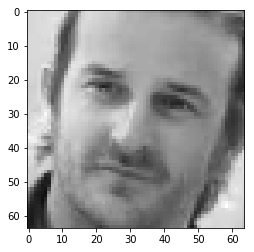

The 201th picture of valid positives


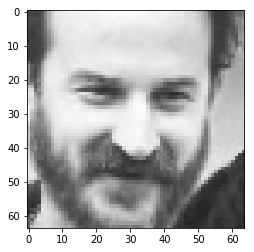

The 202th picture of valid positives


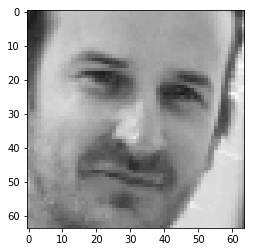

The 203th picture of valid positives


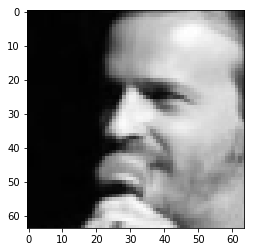

The 204th picture of valid positives


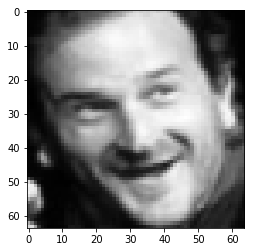

The 205th picture of valid positives


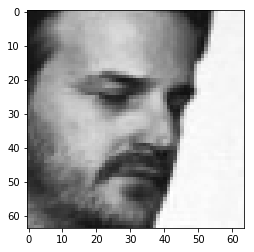

The 206th picture of valid positives


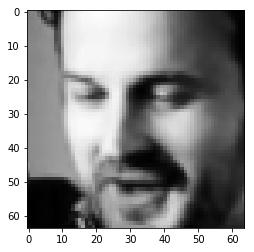

The 207th picture of valid positives


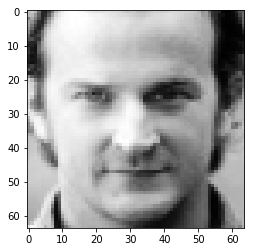

The 208th picture of valid positives


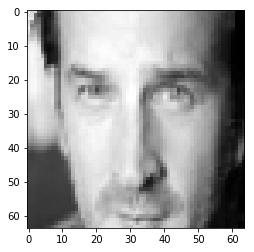

The 209th picture of valid positives


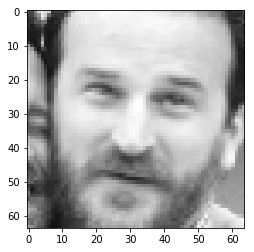

The 210th picture of valid positives


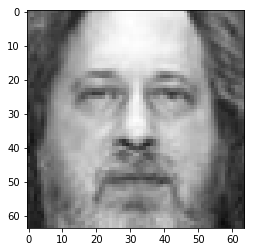

The 211th picture of valid positives


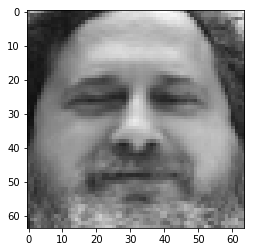

The 212th picture of valid positives


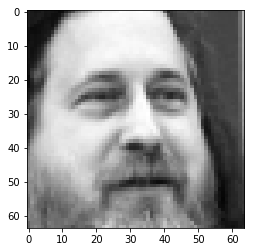

The 213th picture of valid positives


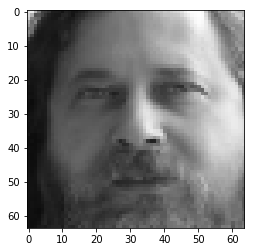

The 214th picture of valid positives


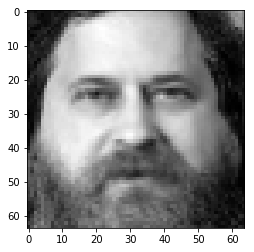

The 215th picture of valid positives


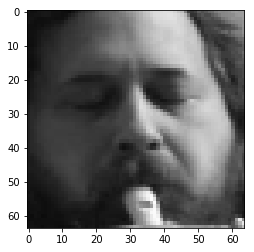

The 216th picture of valid positives


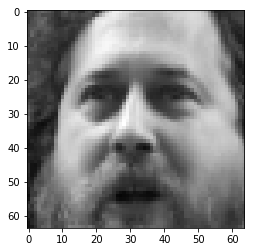

The 217th picture of valid positives


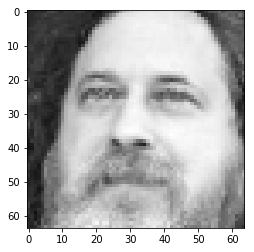

The 218th picture of valid positives


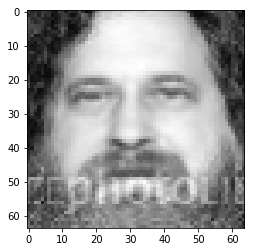

The 219th picture of valid positives


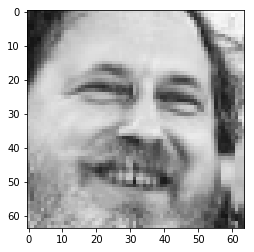

The 220th picture of valid positives


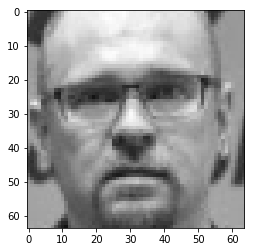

The 221th picture of valid positives


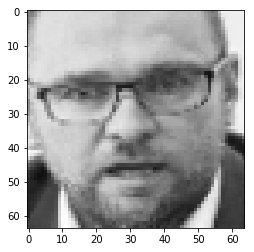

The 222th picture of valid positives


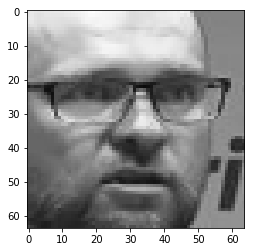

The 223th picture of valid positives


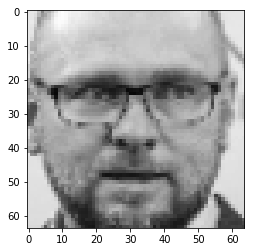

The 224th picture of valid positives


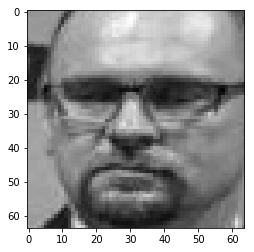

The 225th picture of valid positives


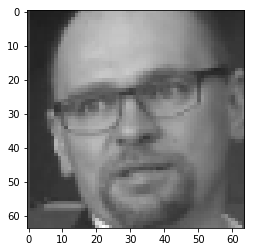

The 226th picture of valid positives


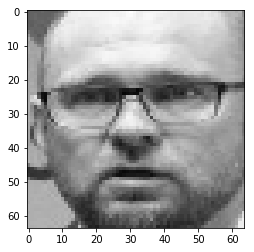

The 227th picture of valid positives


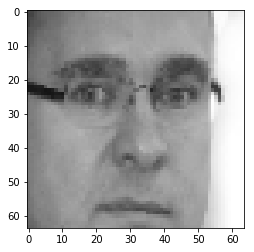

The 228th picture of valid positives


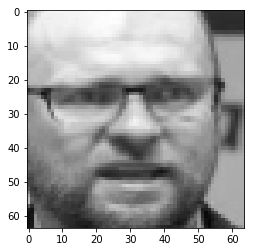

The 229th picture of valid positives


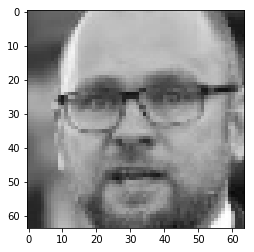

The 230th picture of valid positives


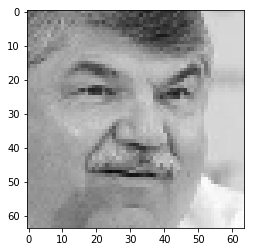

The 231th picture of valid positives


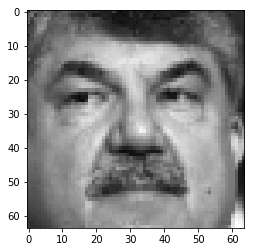

The 232th picture of valid positives


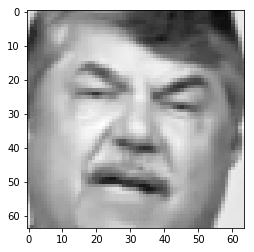

The 233th picture of valid positives


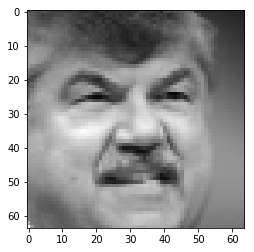

The 234th picture of valid positives


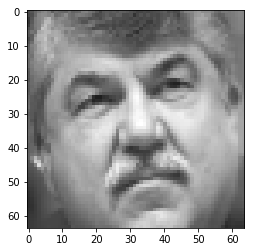

The 235th picture of valid positives


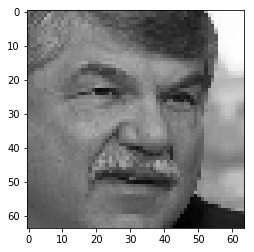

The 236th picture of valid positives


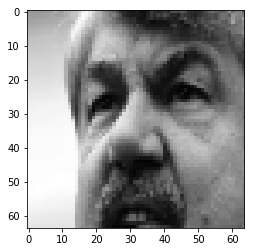

The 237th picture of valid positives


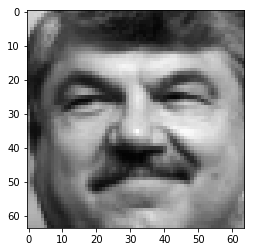

The 238th picture of valid positives


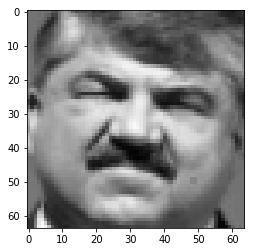

The 239th picture of valid positives


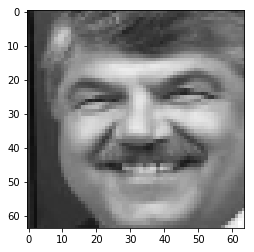

The 240th picture of valid positives


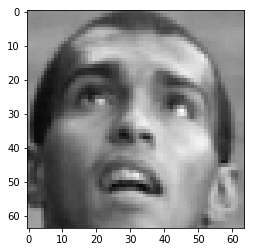

The 241th picture of valid positives


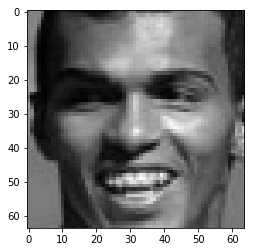

The 242th picture of valid positives


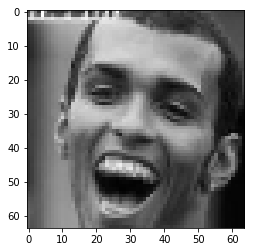

The 243th picture of valid positives


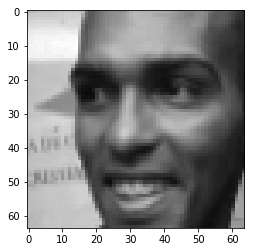

The 244th picture of valid positives


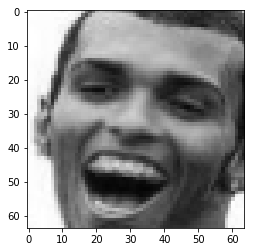

The 245th picture of valid positives


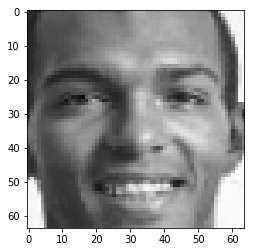

The 246th picture of valid positives


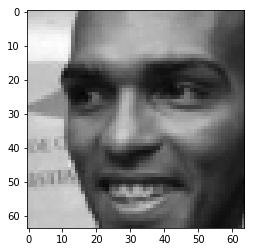

The 247th picture of valid positives


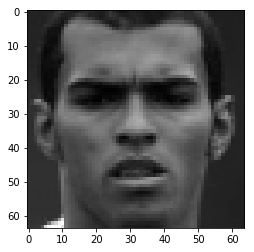

The 248th picture of valid positives


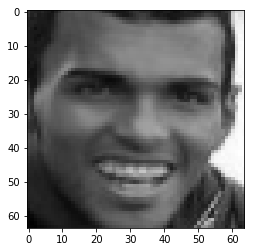

The 249th picture of valid positives


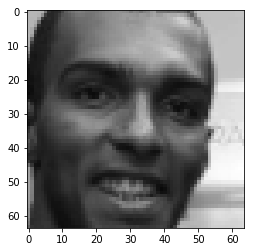

The 250th picture of valid positives


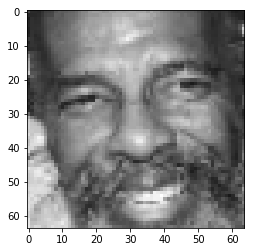

The 251th picture of valid positives


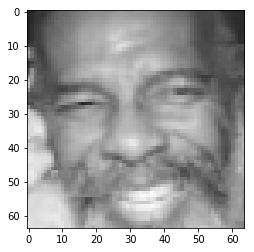

The 252th picture of valid positives


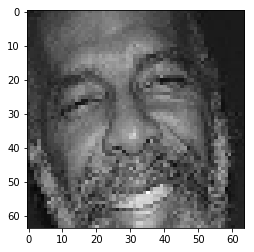

The 253th picture of valid positives


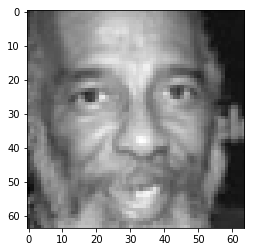

The 254th picture of valid positives


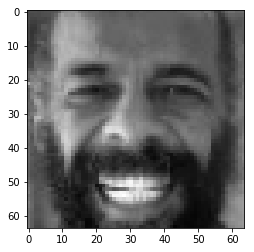

The 255th picture of valid positives


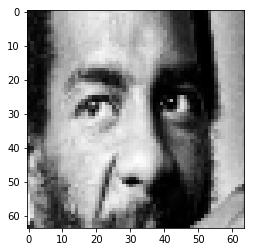

The 256th picture of valid positives


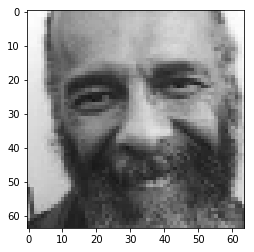

The 257th picture of valid positives


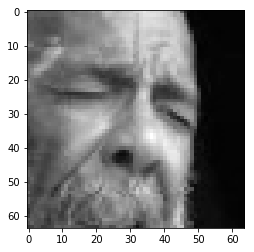

The 258th picture of valid positives


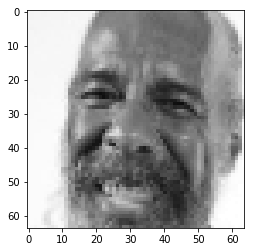

The 259th picture of valid positives


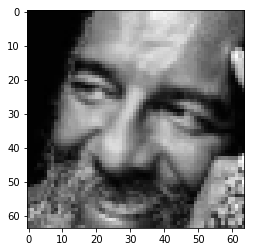

The 260th picture of valid positives


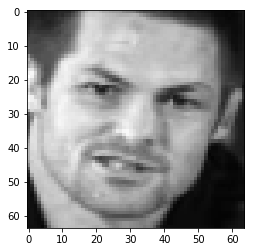

The 261th picture of valid positives


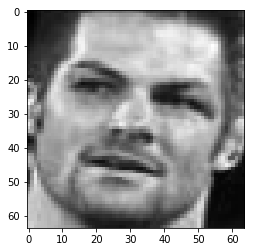

The 262th picture of valid positives


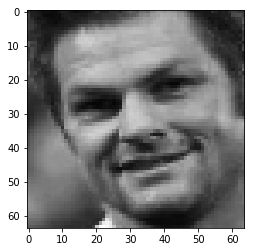

The 263th picture of valid positives


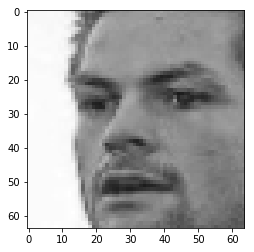

The 264th picture of valid positives


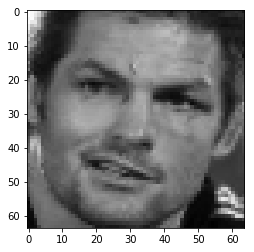

The 265th picture of valid positives


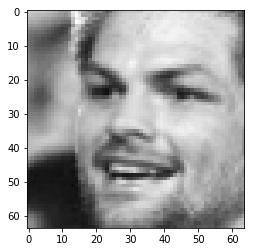

The 266th picture of valid positives


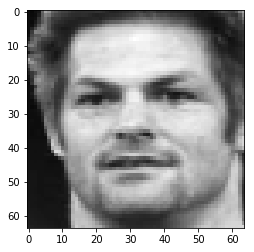

The 267th picture of valid positives


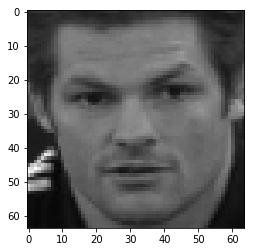

The 268th picture of valid positives


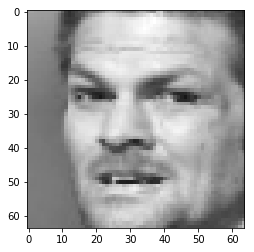

The 269th picture of valid positives


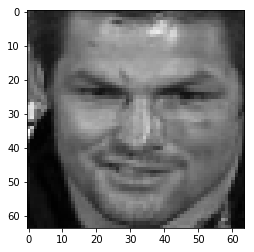

The 270th picture of valid positives


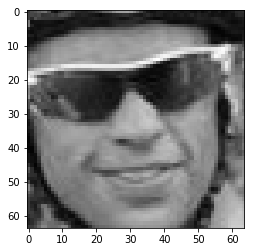

The 271th picture of valid positives


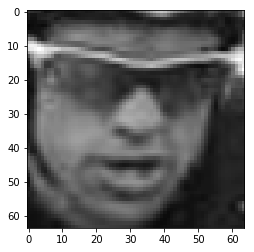

The 272th picture of valid positives


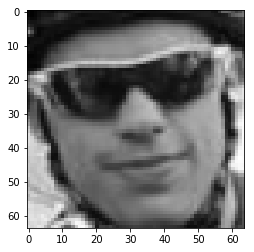

The 273th picture of valid positives


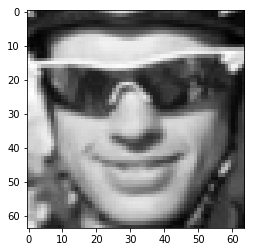

The 274th picture of valid positives


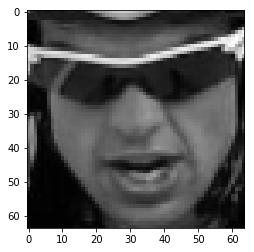

The 275th picture of valid positives


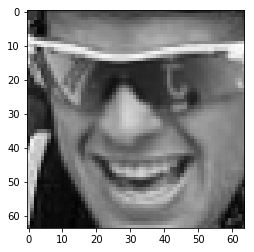

The 276th picture of valid positives


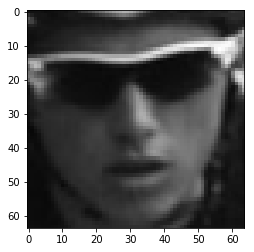

The 277th picture of valid positives


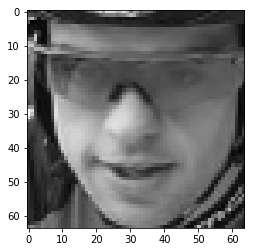

The 278th picture of valid positives


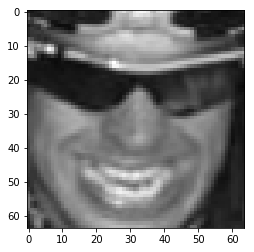

The 279th picture of valid positives


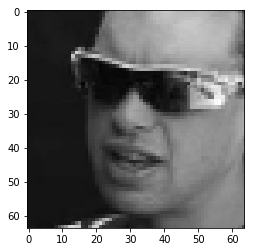

The 280th picture of valid positives


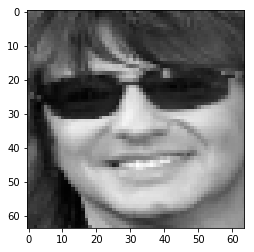

The 281th picture of valid positives


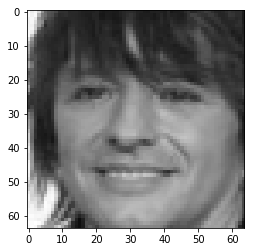

The 282th picture of valid positives


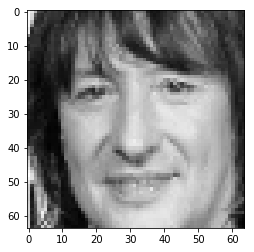

The 283th picture of valid positives


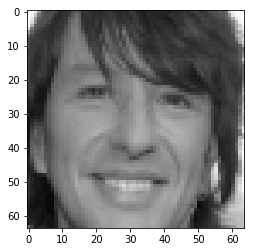

The 284th picture of valid positives


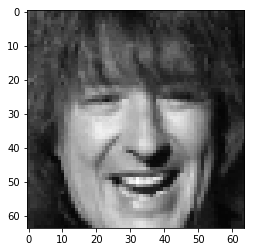

The 285th picture of valid positives


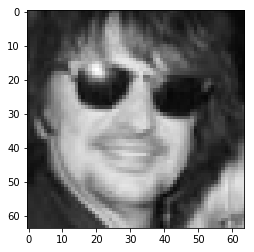

The 286th picture of valid positives


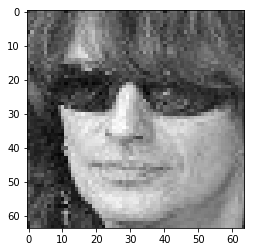

The 287th picture of valid positives


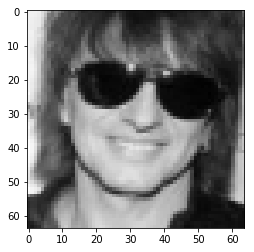

The 288th picture of valid positives


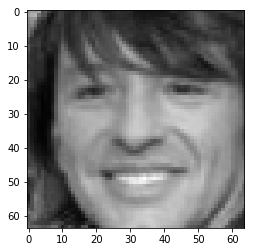

The 289th picture of valid positives


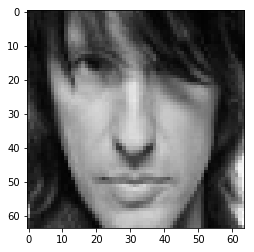

The 290th picture of valid positives


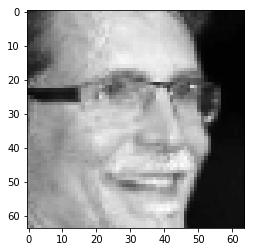

The 291th picture of valid positives


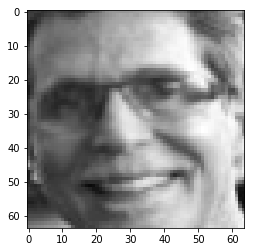

The 292th picture of valid positives


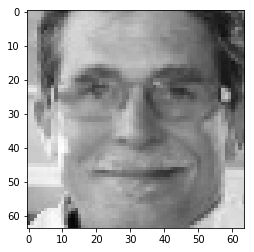

The 293th picture of valid positives


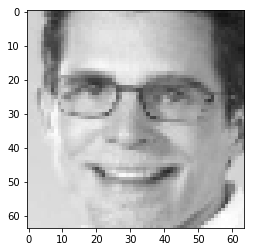

The 294th picture of valid positives


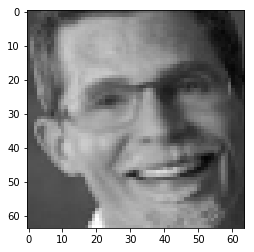

The 295th picture of valid positives


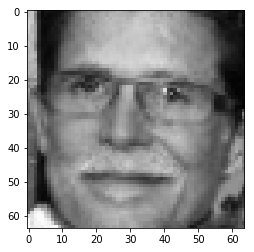

The 296th picture of valid positives


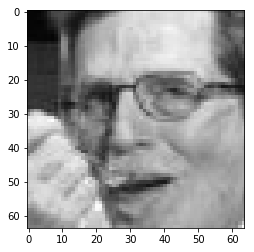

The 297th picture of valid positives


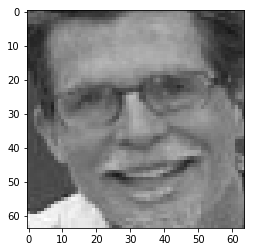

The 298th picture of valid positives


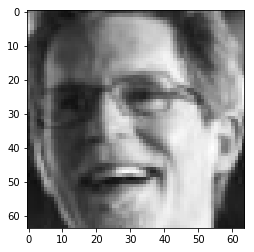

The 299th picture of valid positives


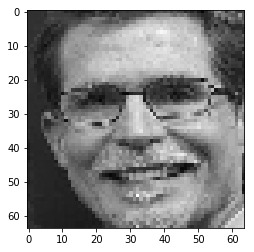

The 300th picture of valid positives


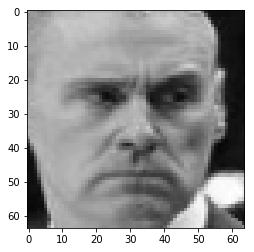

The 301th picture of valid positives


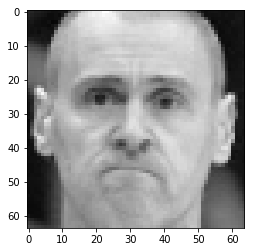

The 302th picture of valid positives


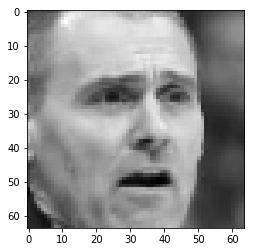

The 303th picture of valid positives


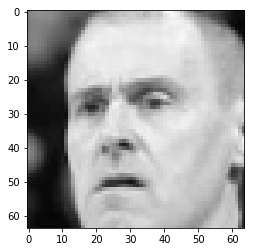

The 304th picture of valid positives


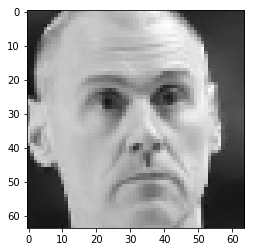

The 305th picture of valid positives


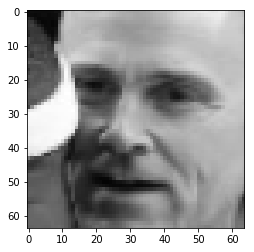

The 306th picture of valid positives


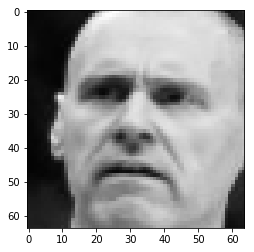

The 307th picture of valid positives


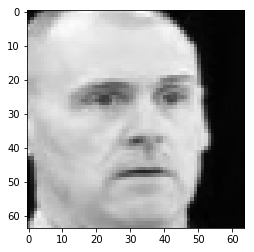

The 308th picture of valid positives


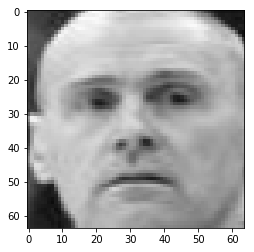

The 309th picture of valid positives


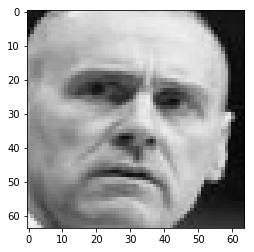

The 310th picture of valid positives


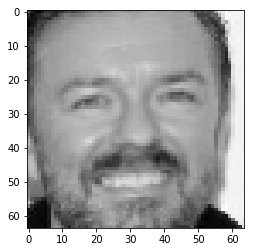

The 311th picture of valid positives


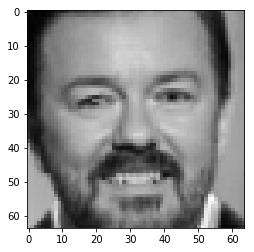

The 312th picture of valid positives


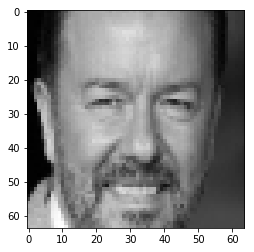

The 313th picture of valid positives


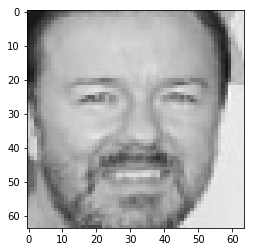

The 314th picture of valid positives


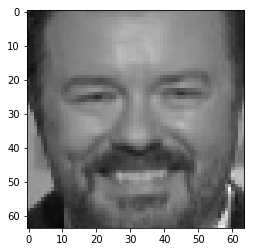

The 315th picture of valid positives


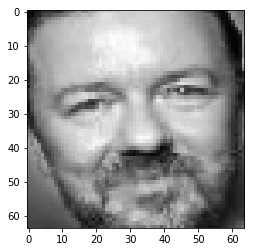

The 316th picture of valid positives


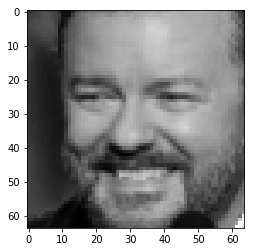

The 317th picture of valid positives


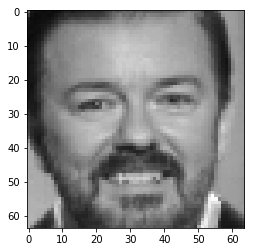

The 318th picture of valid positives


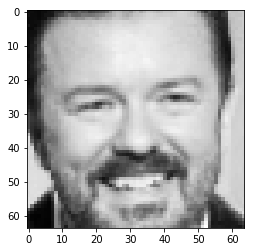

The 319th picture of valid positives


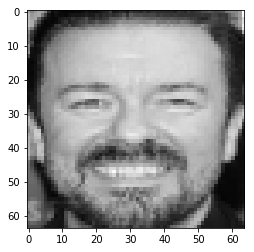

The 320th picture of valid positives


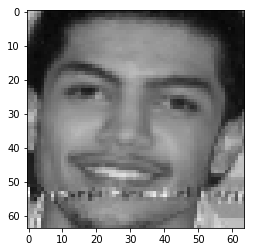

The 321th picture of valid positives


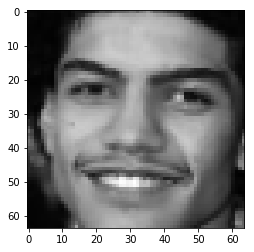

The 322th picture of valid positives


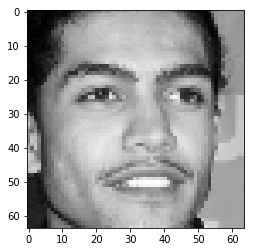

The 323th picture of valid positives


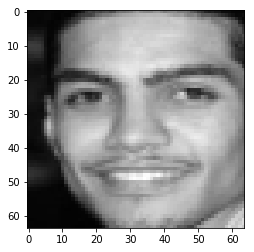

The 324th picture of valid positives


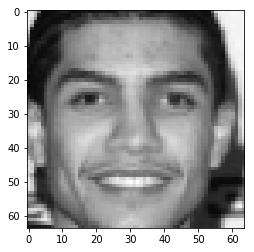

The 325th picture of valid positives


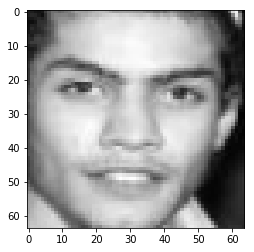

The 326th picture of valid positives


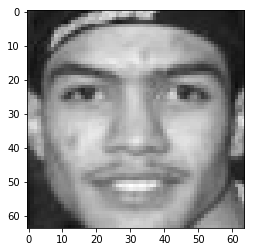

The 327th picture of valid positives


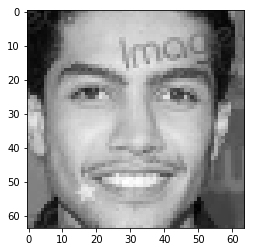

The 328th picture of valid positives


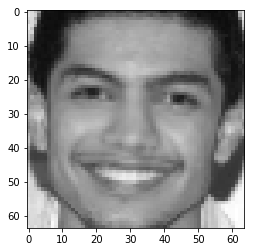

The 329th picture of valid positives


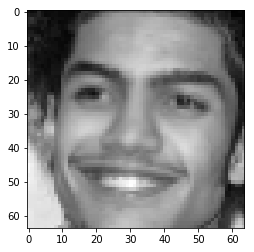

The 330th picture of valid positives


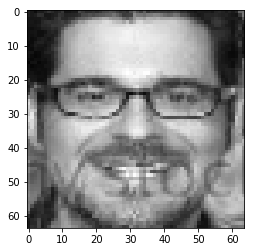

The 331th picture of valid positives


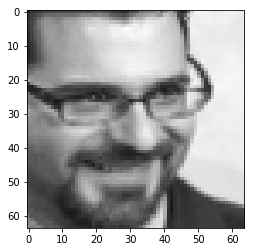

The 332th picture of valid positives


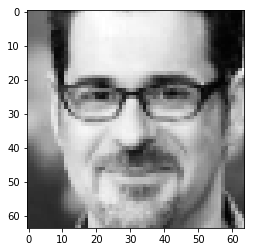

The 333th picture of valid positives


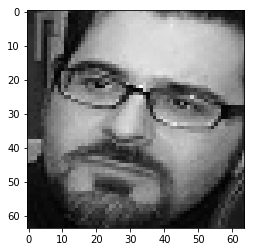

The 334th picture of valid positives


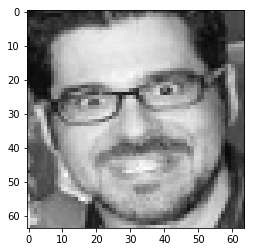

The 335th picture of valid positives


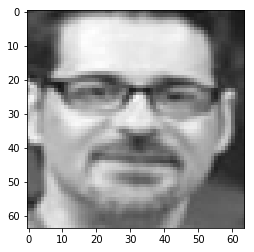

The 336th picture of valid positives


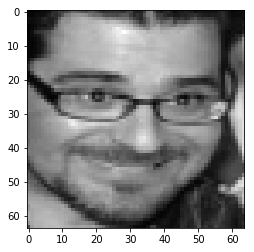

The 337th picture of valid positives


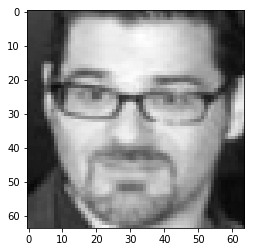

The 338th picture of valid positives


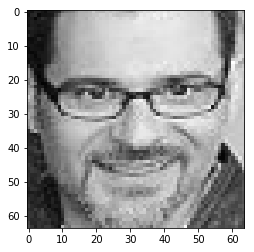

The 339th picture of valid positives


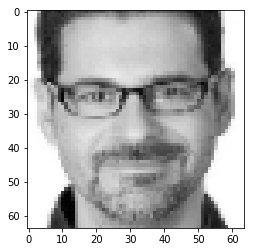

The 340th picture of valid positives


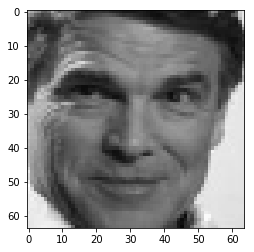

The 341th picture of valid positives


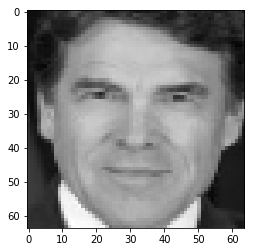

The 342th picture of valid positives


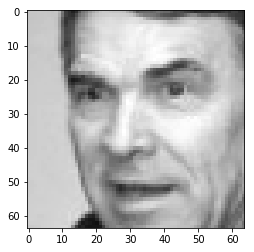

The 343th picture of valid positives


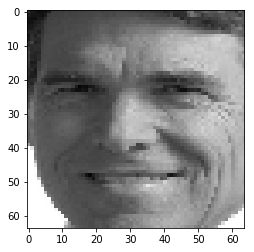

The 344th picture of valid positives


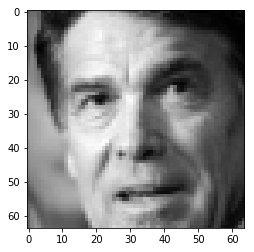

The 345th picture of valid positives


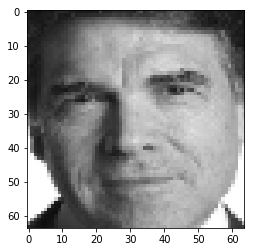

The 346th picture of valid positives


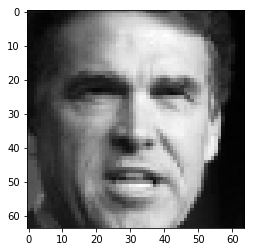

The 347th picture of valid positives


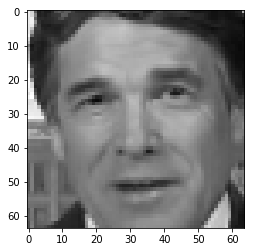

The 348th picture of valid positives


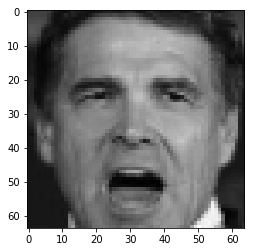

The 349th picture of valid positives


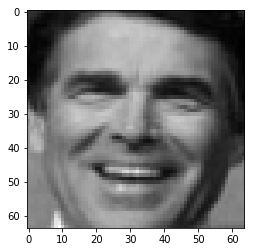

The 350th picture of valid positives


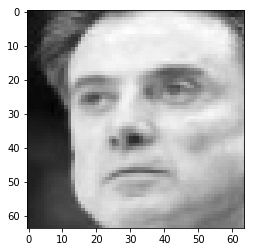

The 351th picture of valid positives


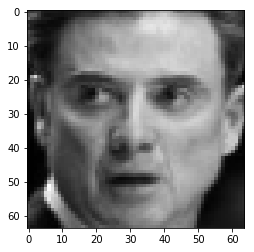

The 352th picture of valid positives


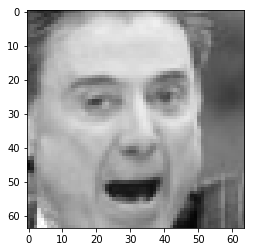

The 353th picture of valid positives


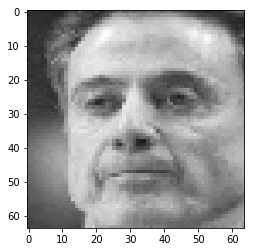

The 354th picture of valid positives


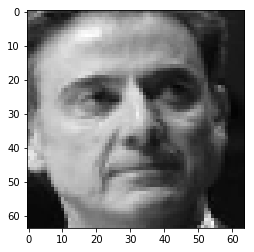

The 355th picture of valid positives


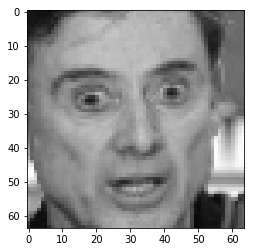

The 356th picture of valid positives


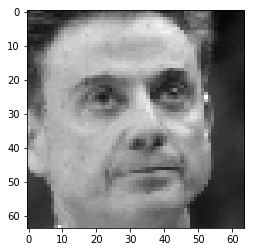

The 357th picture of valid positives


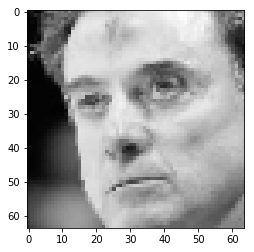

The 358th picture of valid positives


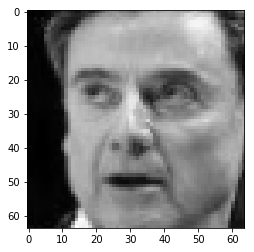

The 359th picture of valid positives


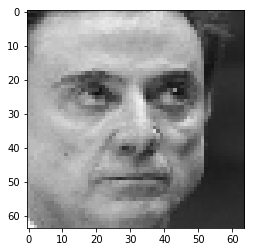

The 360th picture of valid positives


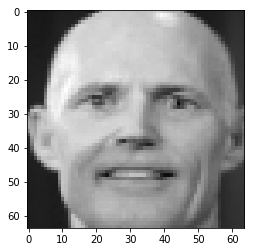

The 361th picture of valid positives


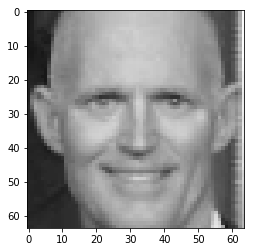

The 362th picture of valid positives


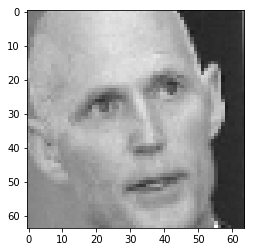

The 363th picture of valid positives


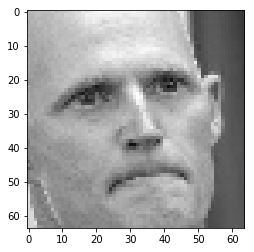

The 364th picture of valid positives


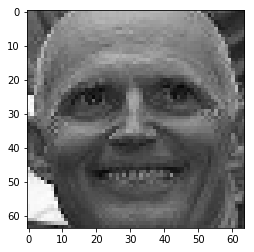

The 365th picture of valid positives


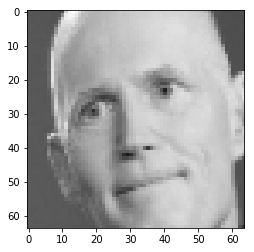

The 366th picture of valid positives


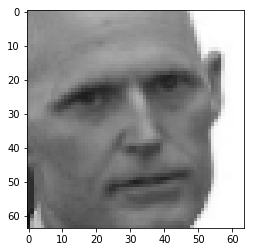

The 367th picture of valid positives


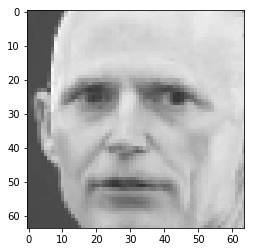

The 368th picture of valid positives


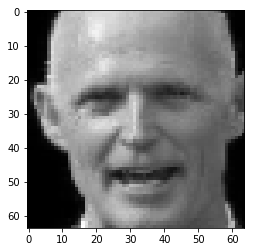

The 369th picture of valid positives


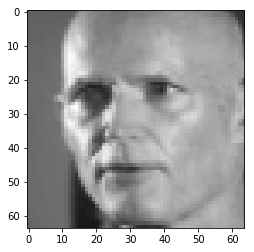

The 370th picture of valid positives


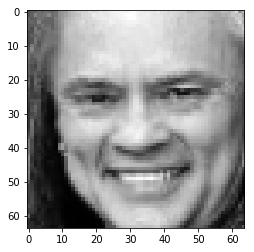

The 371th picture of valid positives


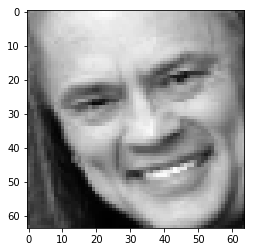

The 372th picture of valid positives


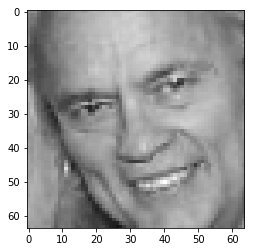

The 373th picture of valid positives


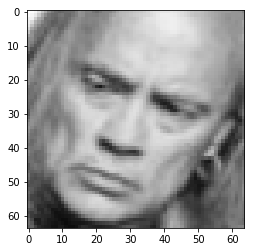

The 374th picture of valid positives


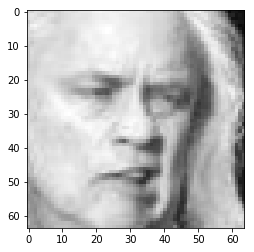

The 375th picture of valid positives


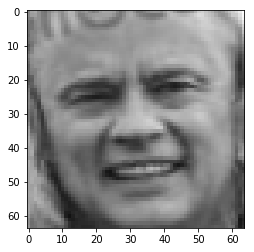

The 376th picture of valid positives


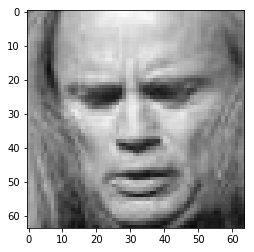

The 377th picture of valid positives


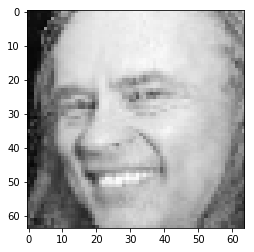

The 378th picture of valid positives


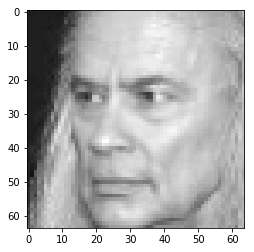

The 379th picture of valid positives


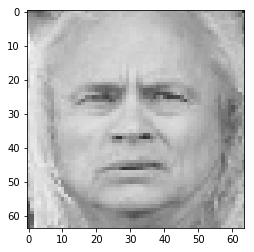

The 380th picture of valid positives


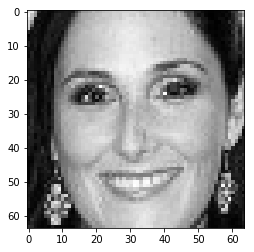

The 381th picture of valid positives


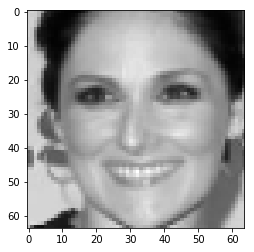

The 382th picture of valid positives


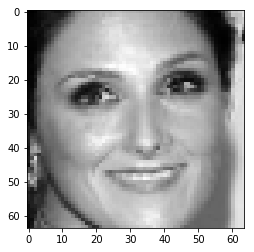

The 383th picture of valid positives


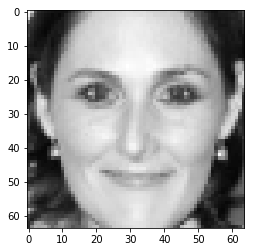

The 384th picture of valid positives


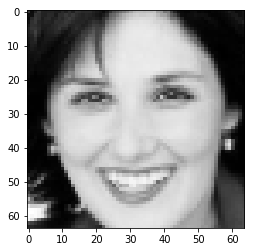

The 385th picture of valid positives


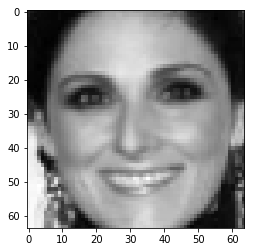

The 386th picture of valid positives


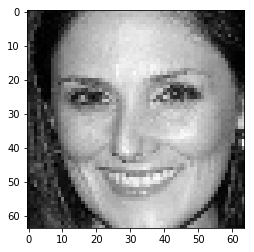

The 387th picture of valid positives


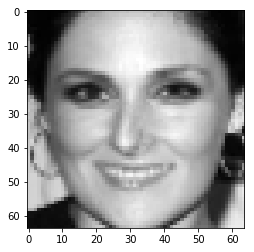

The 388th picture of valid positives


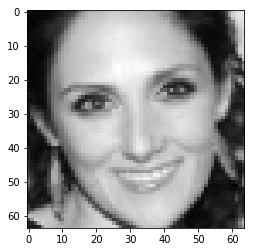

The 389th picture of valid positives


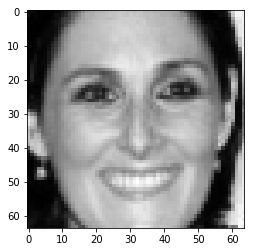

The 390th picture of valid positives


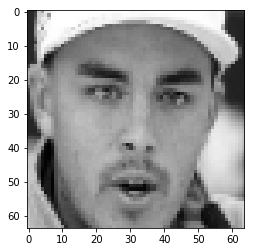

The 391th picture of valid positives


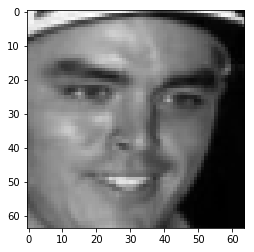

The 392th picture of valid positives


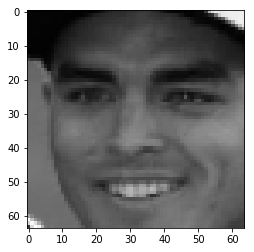

The 393th picture of valid positives


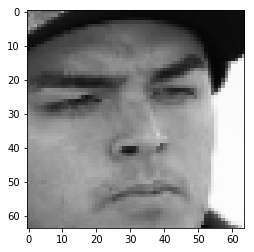

The 394th picture of valid positives


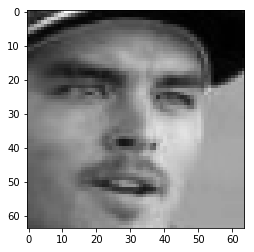

The 395th picture of valid positives


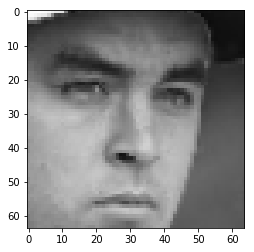

The 396th picture of valid positives


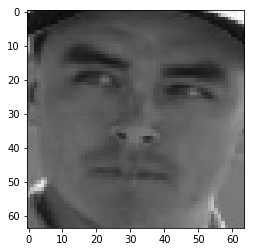

The 397th picture of valid positives


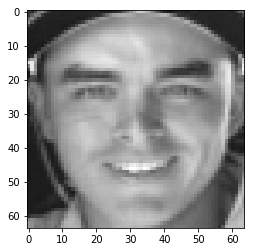

The 398th picture of valid positives


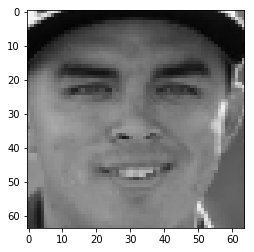

The 399th picture of valid positives


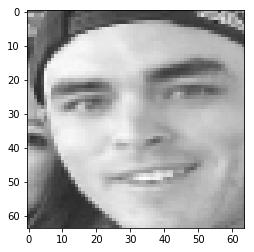

The 400th picture of valid positives


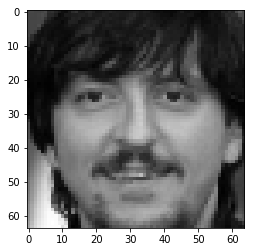

The 401th picture of valid positives


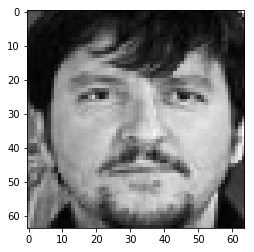

The 402th picture of valid positives


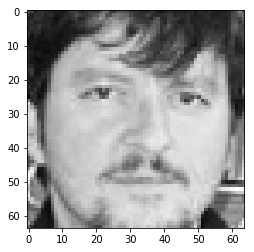

The 403th picture of valid positives


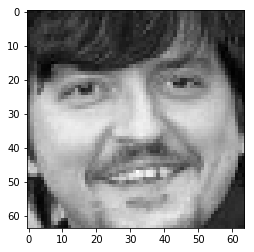

The 404th picture of valid positives


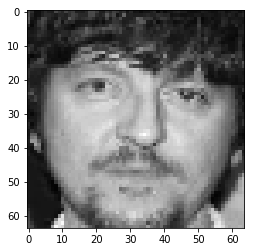

The 405th picture of valid positives


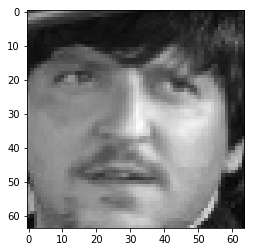

The 406th picture of valid positives


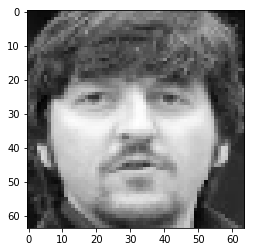

The 407th picture of valid positives


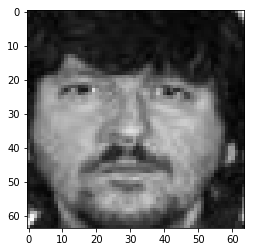

The 408th picture of valid positives


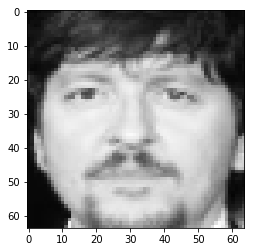

The 409th picture of valid positives


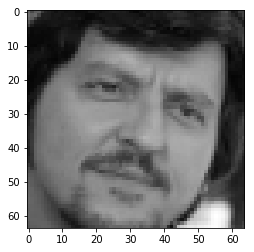

The 410th picture of valid positives


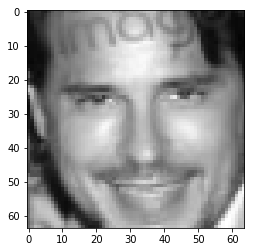

The 411th picture of valid positives


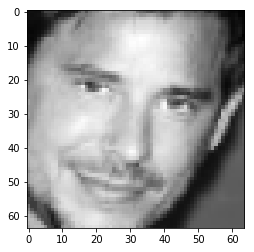

The 412th picture of valid positives


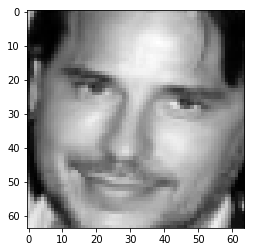

The 413th picture of valid positives


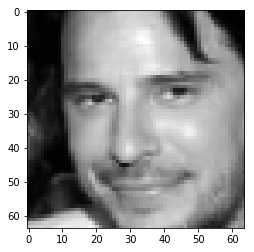

The 414th picture of valid positives


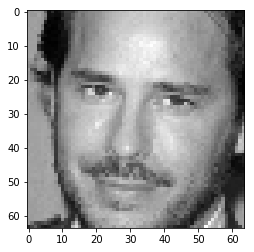

The 415th picture of valid positives


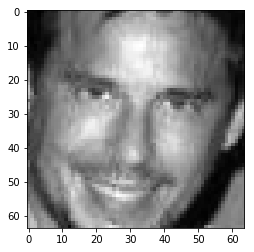

The 416th picture of valid positives


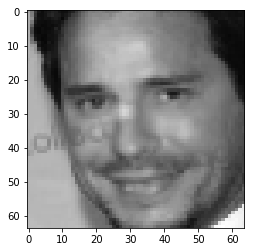

The 417th picture of valid positives


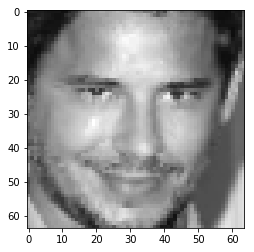

The 418th picture of valid positives


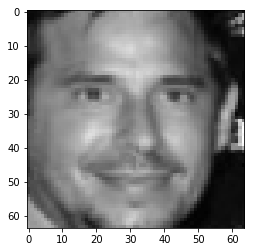

The 419th picture of valid positives


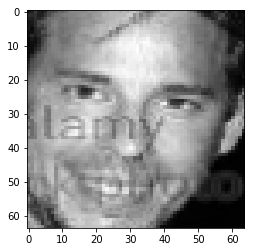

The 420th picture of valid positives


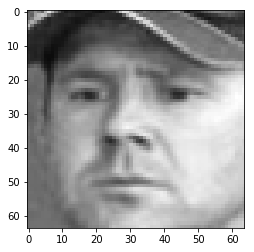

The 421th picture of valid positives


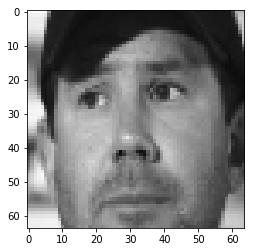

The 422th picture of valid positives


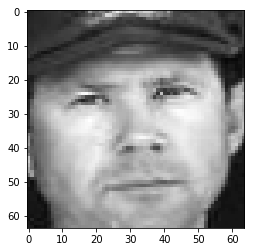

The 423th picture of valid positives


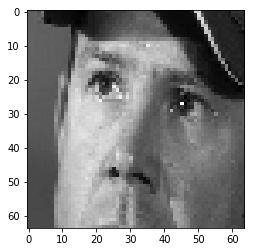

The 424th picture of valid positives


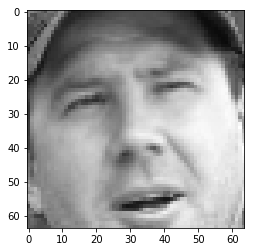

The 425th picture of valid positives


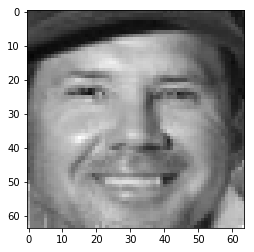

The 426th picture of valid positives


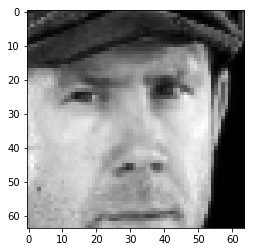

The 427th picture of valid positives


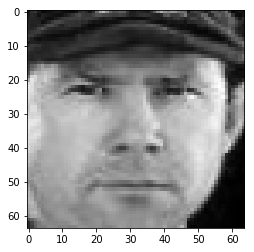

The 428th picture of valid positives


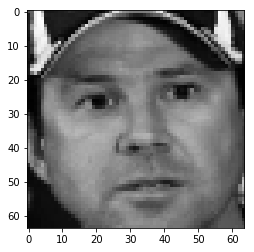

The 429th picture of valid positives


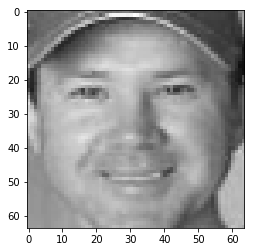

The 430th picture of valid positives


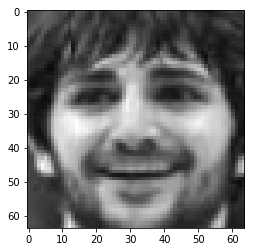

The 431th picture of valid positives


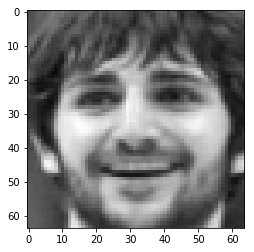

The 432th picture of valid positives


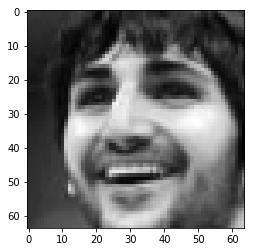

The 433th picture of valid positives


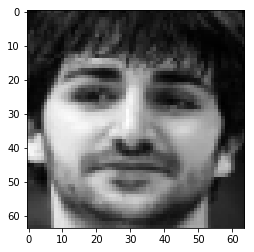

The 434th picture of valid positives


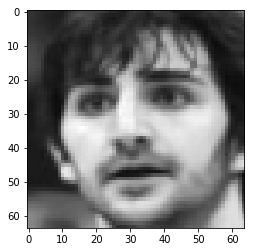

The 435th picture of valid positives


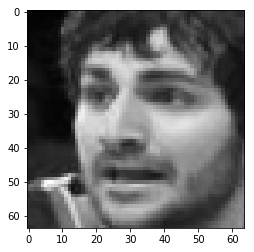

The 436th picture of valid positives


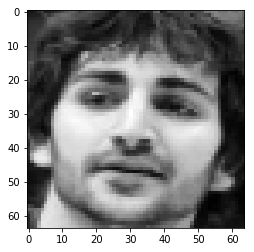

The 437th picture of valid positives


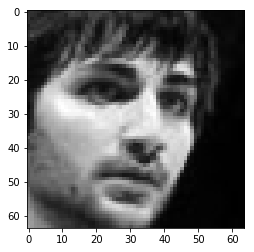

The 438th picture of valid positives


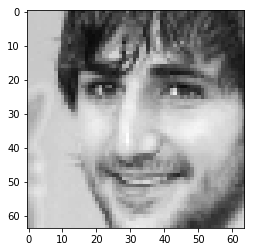

The 439th picture of valid positives


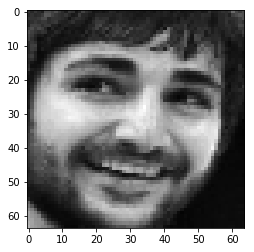

The 440th picture of valid positives


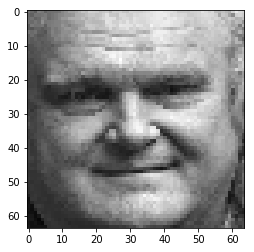

The 441th picture of valid positives


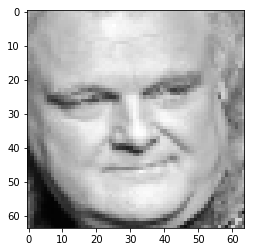

The 442th picture of valid positives


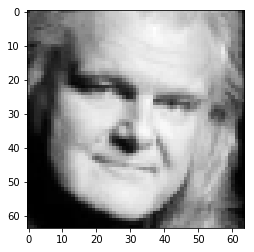

The 443th picture of valid positives


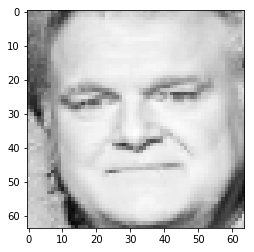

The 444th picture of valid positives


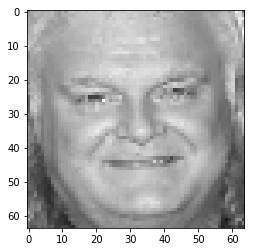

The 445th picture of valid positives


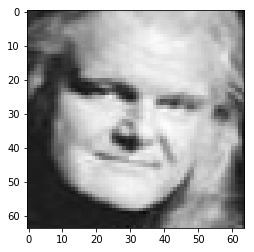

The 446th picture of valid positives


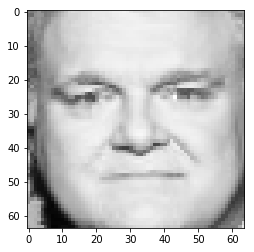

The 447th picture of valid positives


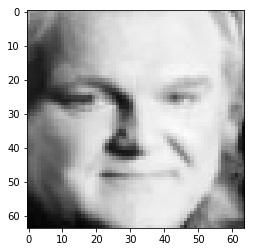

The 448th picture of valid positives


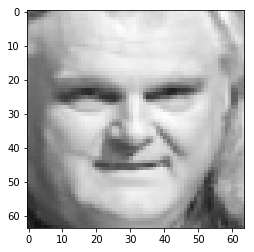

The 449th picture of valid positives


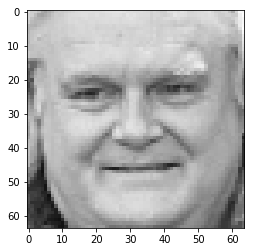

The 450th picture of valid positives


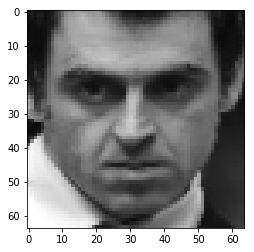

The 451th picture of valid positives


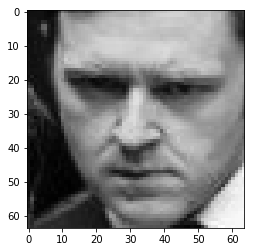

The 452th picture of valid positives


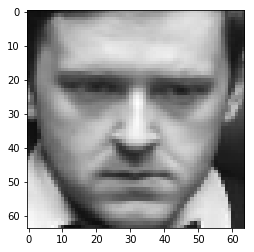

The 453th picture of valid positives


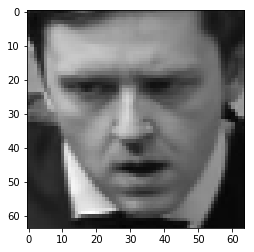

The 454th picture of valid positives


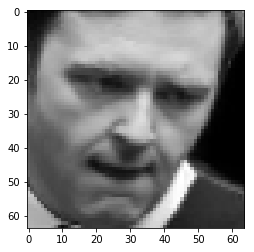

The 455th picture of valid positives


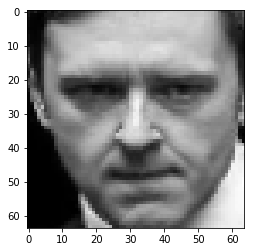

The 456th picture of valid positives


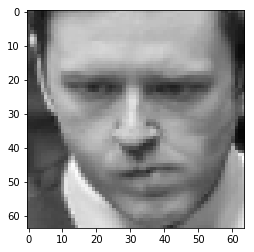

The 457th picture of valid positives


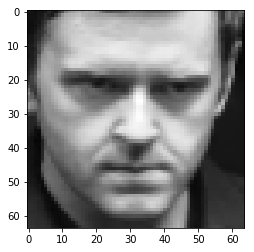

The 458th picture of valid positives


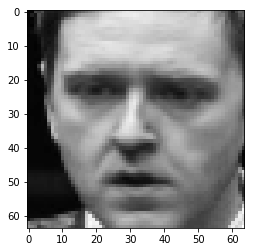

The 459th picture of valid positives


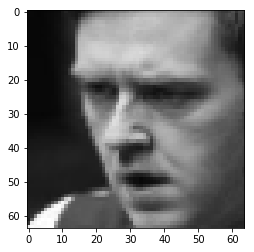

The 460th picture of valid positives


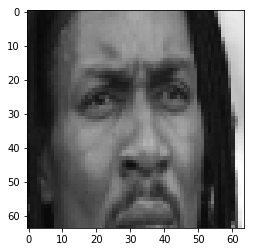

The 461th picture of valid positives


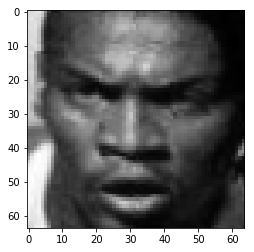

The 462th picture of valid positives


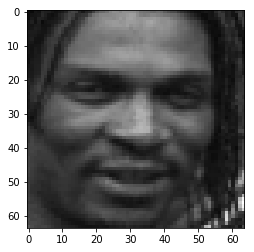

The 463th picture of valid positives


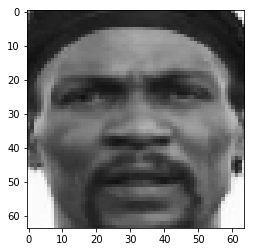

The 464th picture of valid positives


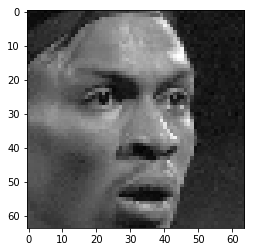

The 465th picture of valid positives


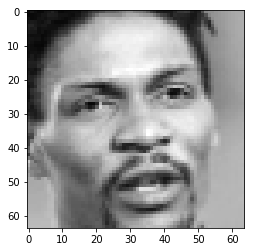

The 466th picture of valid positives


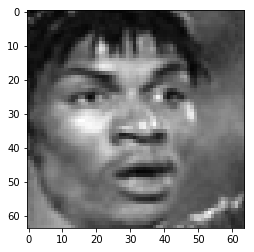

The 467th picture of valid positives


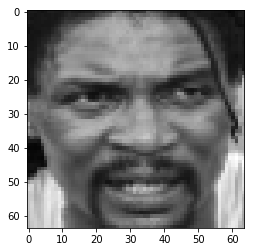

The 468th picture of valid positives


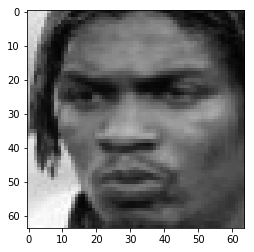

The 469th picture of valid positives


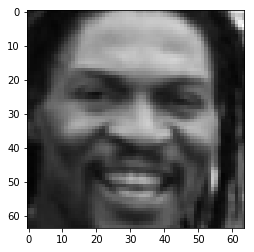

The 470th picture of valid positives


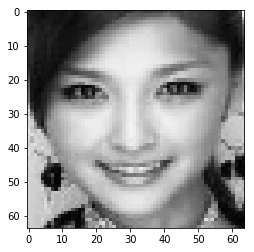

The 471th picture of valid positives


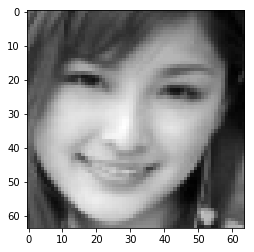

The 472th picture of valid positives


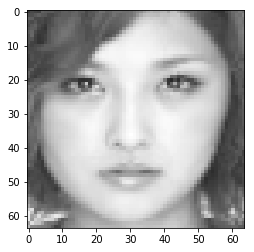

The 473th picture of valid positives


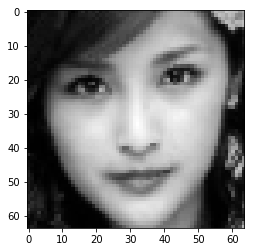

The 474th picture of valid positives


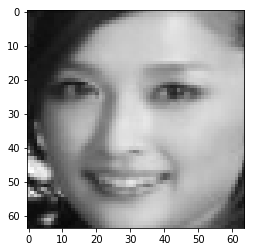

The 475th picture of valid positives


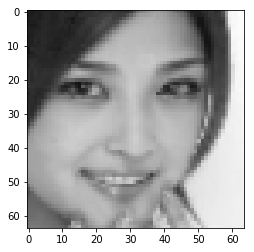

The 476th picture of valid positives


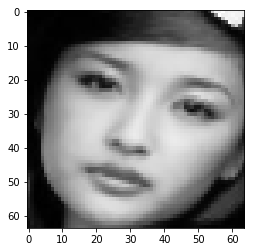

The 477th picture of valid positives


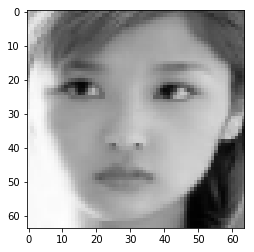

The 478th picture of valid positives


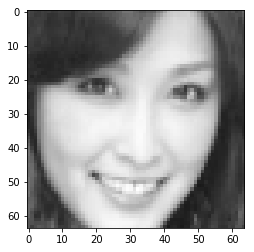

The 479th picture of valid positives


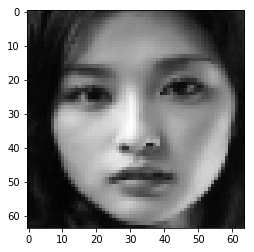

The 480th picture of valid positives


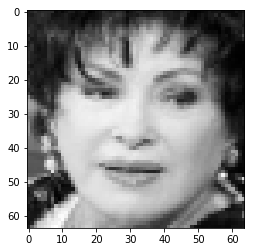

The 481th picture of valid positives


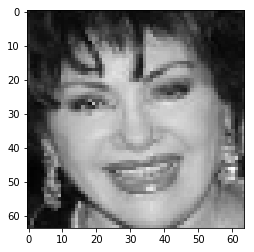

The 482th picture of valid positives


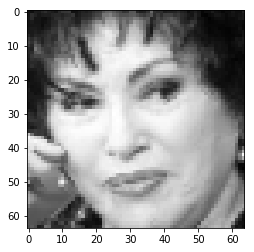

The 483th picture of valid positives


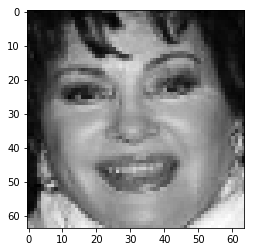

The 484th picture of valid positives


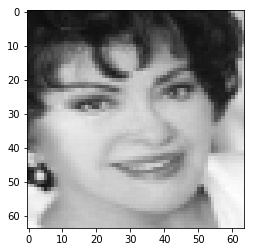

The 485th picture of valid positives


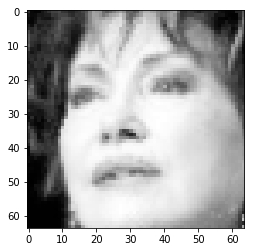

The 486th picture of valid positives


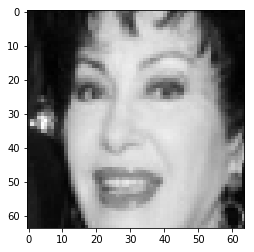

The 487th picture of valid positives


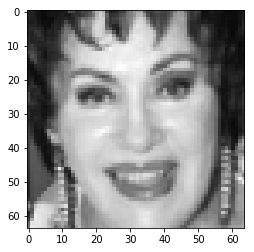

The 488th picture of valid positives


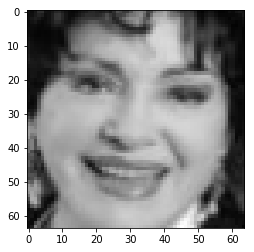

The 489th picture of valid positives


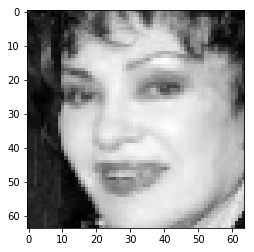

The 490th picture of valid positives


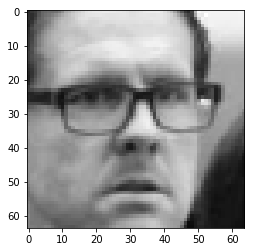

The 491th picture of valid positives


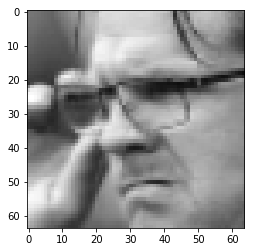

The 492th picture of valid positives


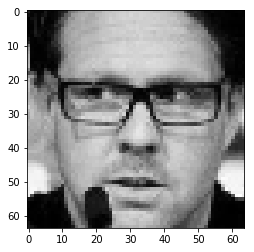

The 493th picture of valid positives


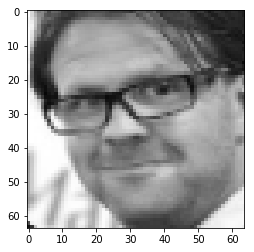

The 494th picture of valid positives


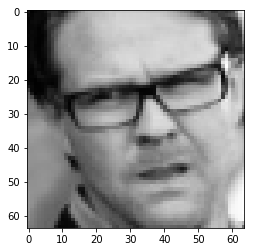

The 495th picture of valid positives


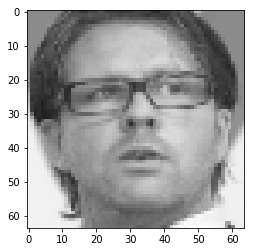

The 496th picture of valid positives


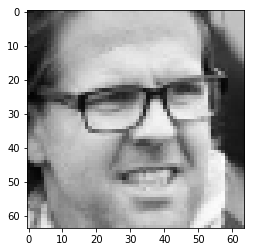

The 497th picture of valid positives


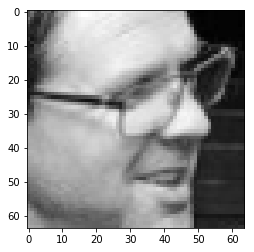

The 498th picture of valid positives


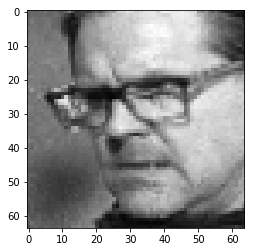

The 499th picture of valid positives


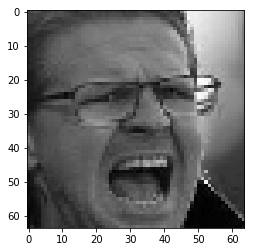

The 500th picture of valid positives


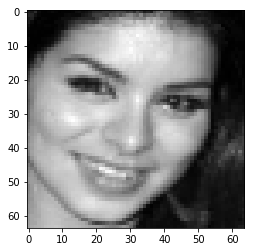

The 501th picture of valid positives


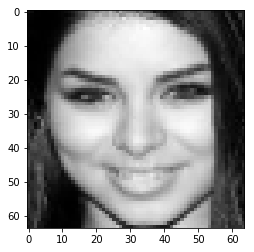

The 502th picture of valid positives


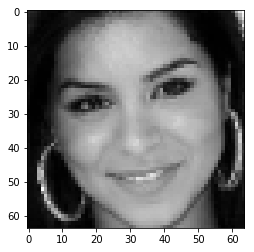

The 503th picture of valid positives


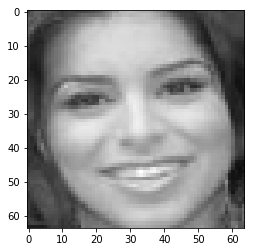

The 504th picture of valid positives


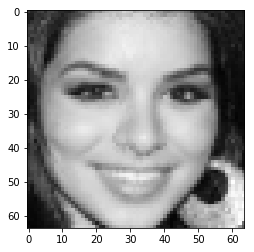

The 505th picture of valid positives


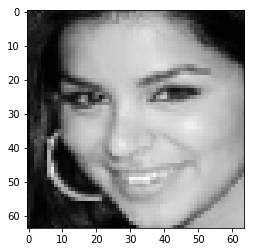

The 506th picture of valid positives


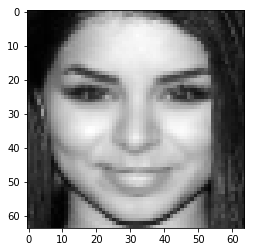

The 507th picture of valid positives


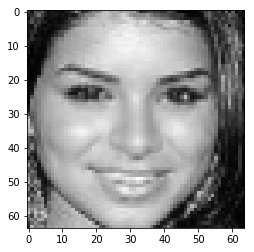

The 508th picture of valid positives


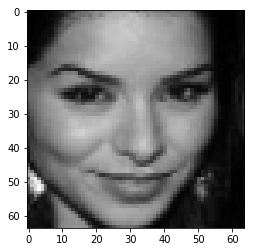

The 509th picture of valid positives


KeyboardInterrupt: 

In [8]:
# Displaying valid positives.
for i in range(len(X_valid_positives)):
    print("The %ith picture of valid positives" %(i+1))
    plt.imshow(array_to_img(X_valid_positives[i].reshape(X_valid_positives[i].shape + (1,))))
    plt.show()

The 0th picture of valid negatives


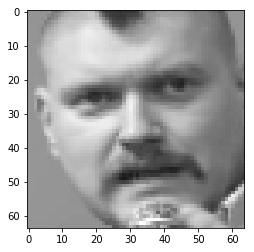

The 1th picture of valid negatives


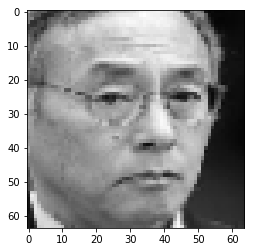

The 2th picture of valid negatives


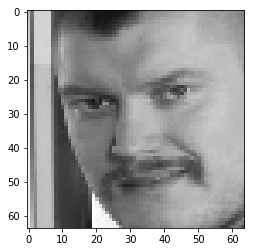

The 3th picture of valid negatives


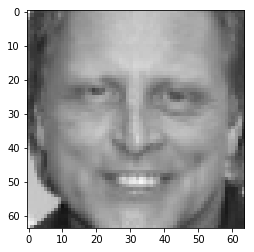

The 4th picture of valid negatives


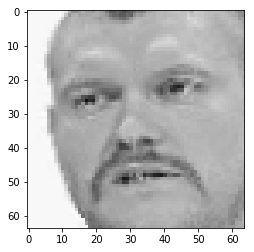

The 5th picture of valid negatives


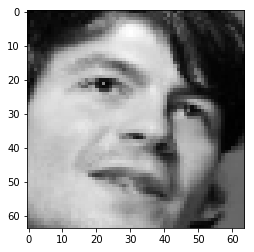

The 6th picture of valid negatives


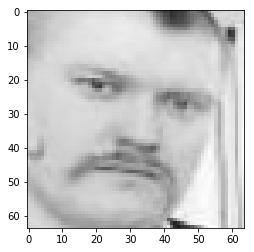

The 7th picture of valid negatives


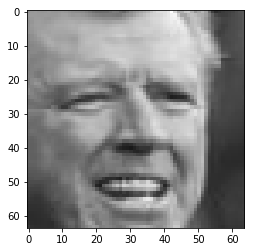

The 8th picture of valid negatives


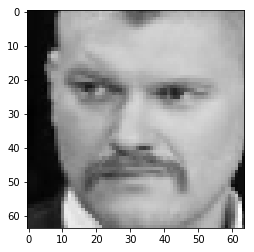

The 9th picture of valid negatives


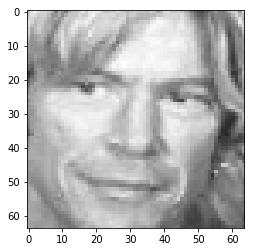

The 10th picture of valid negatives


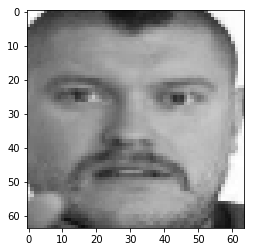

The 11th picture of valid negatives


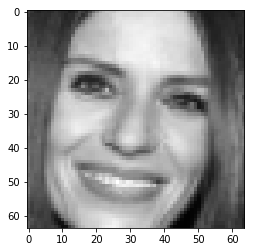

The 12th picture of valid negatives


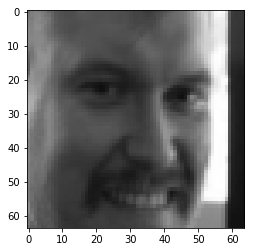

The 13th picture of valid negatives


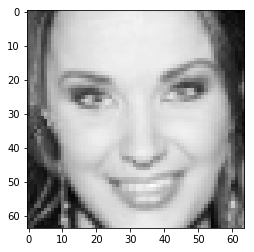

The 14th picture of valid negatives


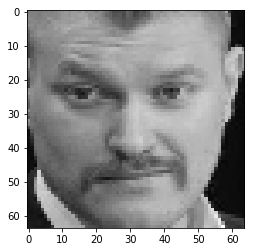

The 15th picture of valid negatives


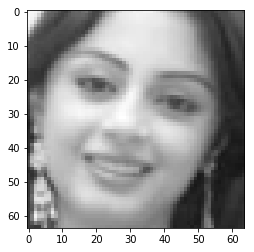

The 16th picture of valid negatives


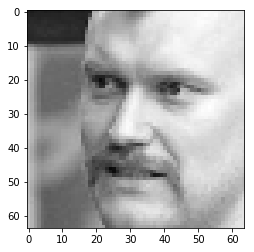

The 17th picture of valid negatives


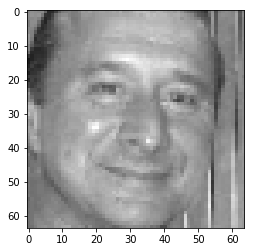

The 18th picture of valid negatives


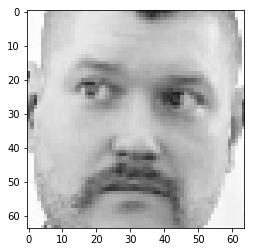

The 19th picture of valid negatives


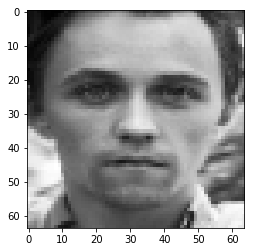

The 20th picture of valid negatives


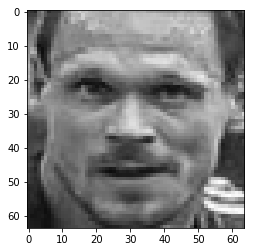

The 21th picture of valid negatives


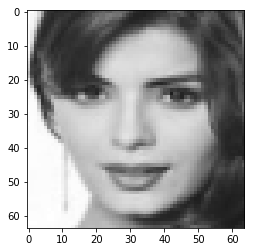

The 22th picture of valid negatives


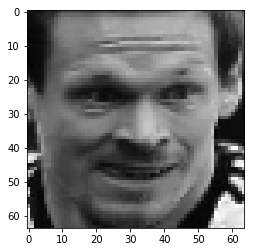

The 23th picture of valid negatives


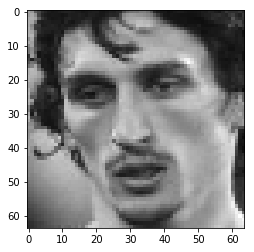

The 24th picture of valid negatives


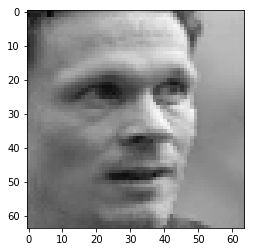

The 25th picture of valid negatives


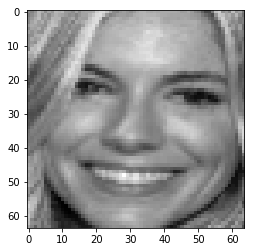

The 26th picture of valid negatives


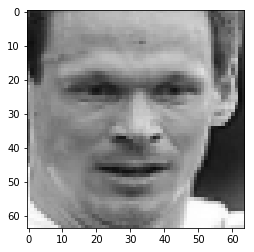

The 27th picture of valid negatives


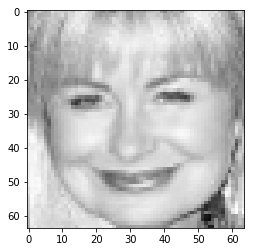

The 28th picture of valid negatives


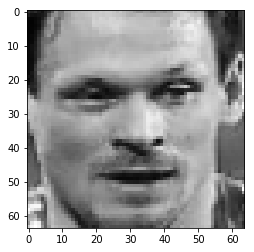

The 29th picture of valid negatives


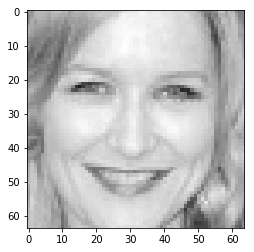

The 30th picture of valid negatives


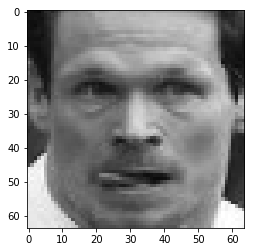

The 31th picture of valid negatives


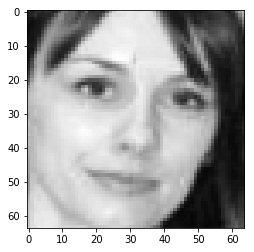

The 32th picture of valid negatives


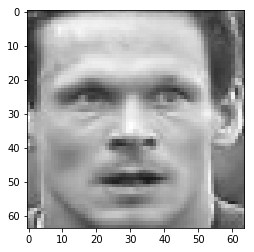

The 33th picture of valid negatives


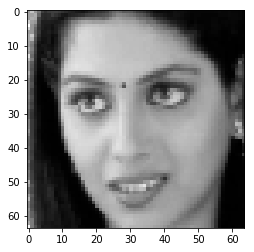

The 34th picture of valid negatives


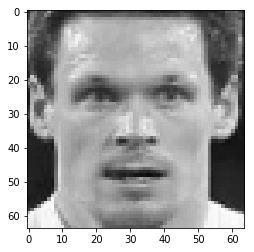

The 35th picture of valid negatives


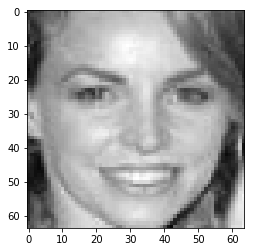

The 36th picture of valid negatives


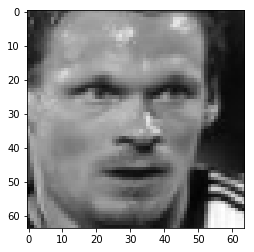

The 37th picture of valid negatives


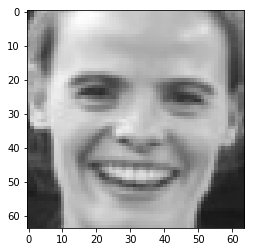

The 38th picture of valid negatives


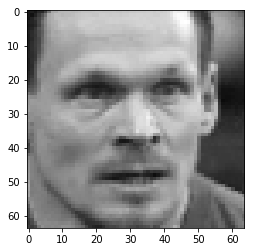

The 39th picture of valid negatives


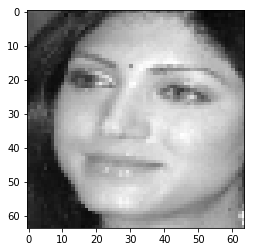

The 40th picture of valid negatives


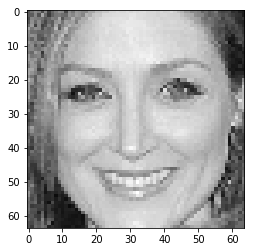

The 41th picture of valid negatives


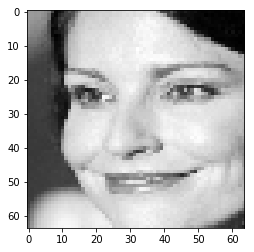

The 42th picture of valid negatives


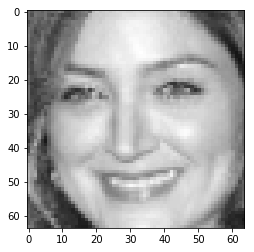

The 43th picture of valid negatives


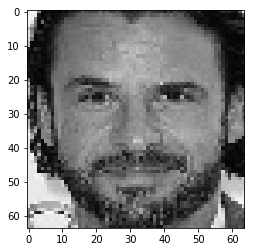

The 44th picture of valid negatives


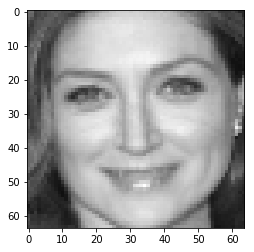

The 45th picture of valid negatives


C:\programs\Anaconda3\lib\site-packages\matplotlib\axis.py:1086: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


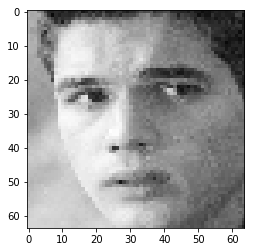

The 46th picture of valid negatives


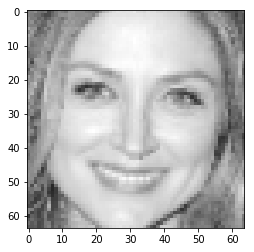

The 47th picture of valid negatives


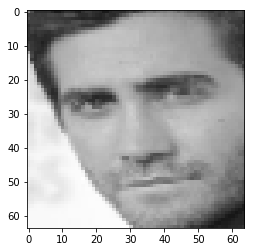

The 48th picture of valid negatives


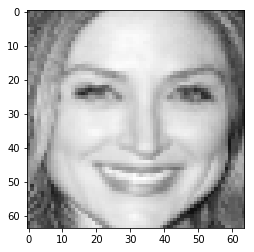

The 49th picture of valid negatives


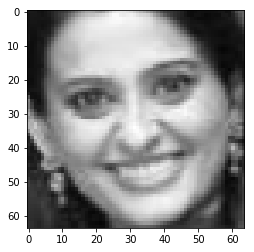

The 50th picture of valid negatives


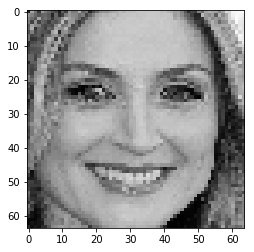

The 51th picture of valid negatives


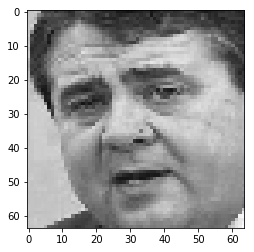

The 52th picture of valid negatives


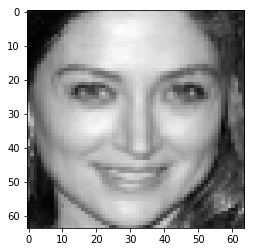

The 53th picture of valid negatives


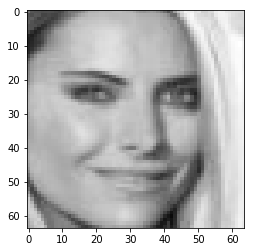

The 54th picture of valid negatives


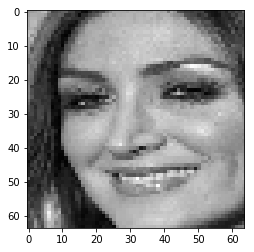

The 55th picture of valid negatives


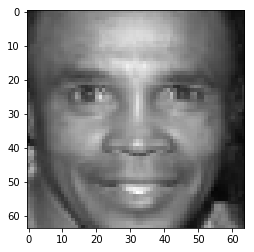

The 56th picture of valid negatives


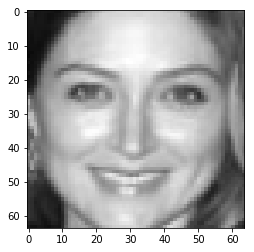

The 57th picture of valid negatives


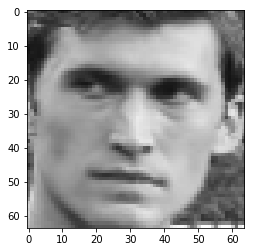

The 58th picture of valid negatives


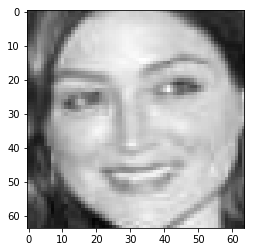

The 59th picture of valid negatives


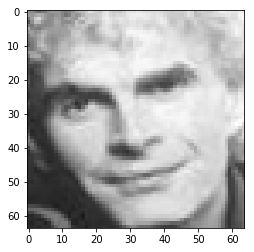

The 60th picture of valid negatives


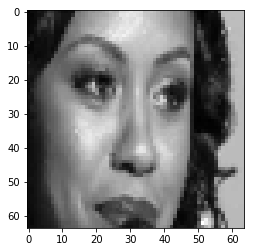

The 61th picture of valid negatives


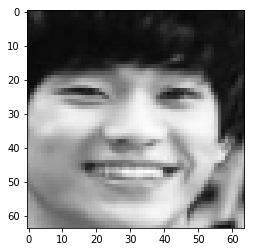

The 62th picture of valid negatives


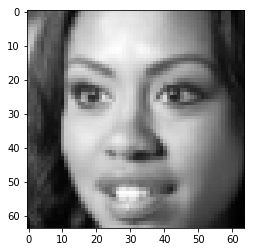

The 63th picture of valid negatives


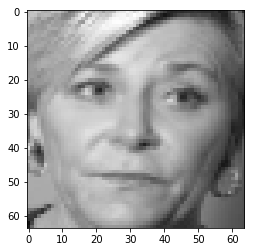

The 64th picture of valid negatives


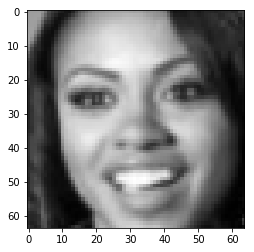

The 65th picture of valid negatives


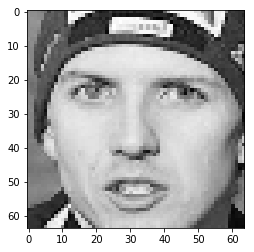

The 66th picture of valid negatives


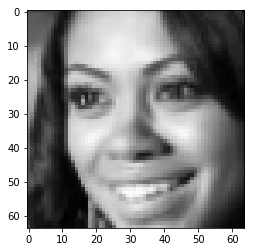

The 67th picture of valid negatives


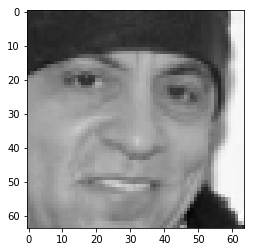

The 68th picture of valid negatives


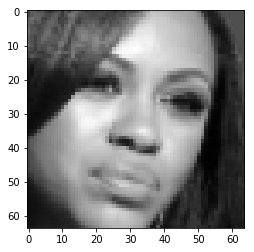

The 69th picture of valid negatives


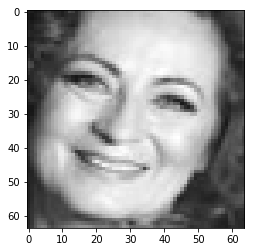

The 70th picture of valid negatives


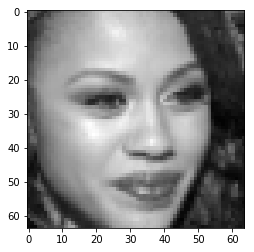

The 71th picture of valid negatives


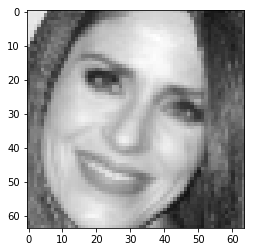

The 72th picture of valid negatives


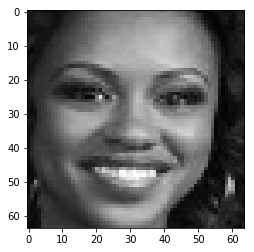

The 73th picture of valid negatives


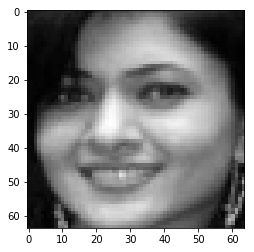

The 74th picture of valid negatives


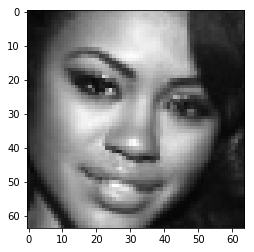

The 75th picture of valid negatives


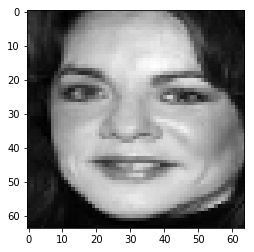

The 76th picture of valid negatives


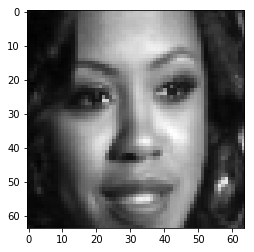

The 77th picture of valid negatives


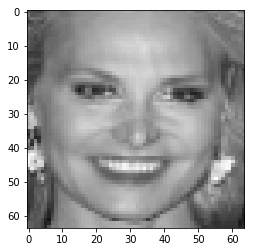

The 78th picture of valid negatives


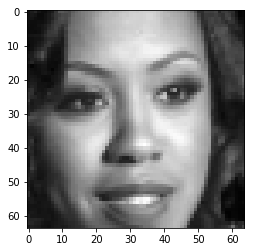

The 79th picture of valid negatives


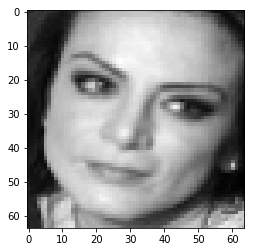

The 80th picture of valid negatives


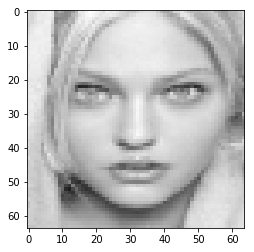

The 81th picture of valid negatives


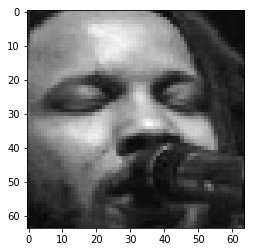

The 82th picture of valid negatives


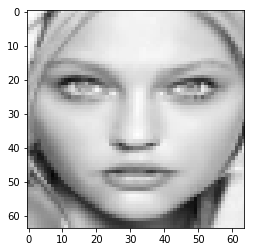

The 83th picture of valid negatives


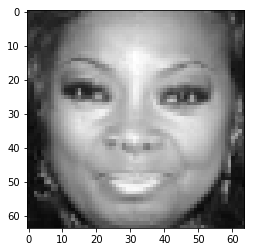

The 84th picture of valid negatives


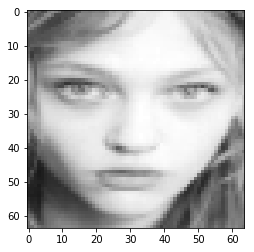

The 85th picture of valid negatives


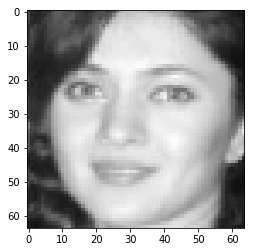

The 86th picture of valid negatives


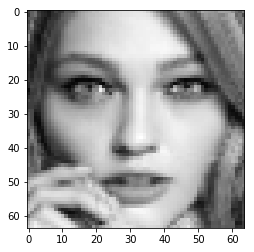

The 87th picture of valid negatives


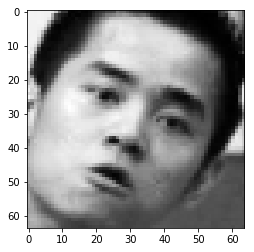

The 88th picture of valid negatives


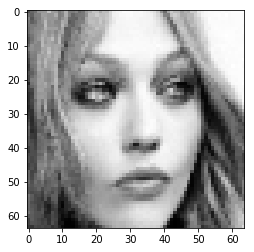

The 89th picture of valid negatives


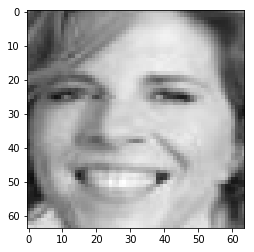

The 90th picture of valid negatives


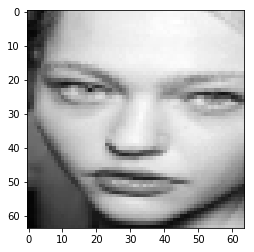

The 91th picture of valid negatives


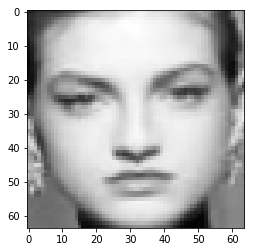

The 92th picture of valid negatives


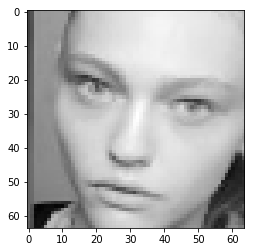

The 93th picture of valid negatives


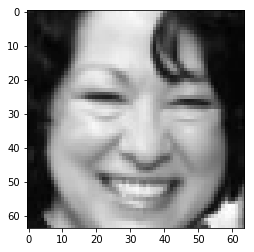

The 94th picture of valid negatives


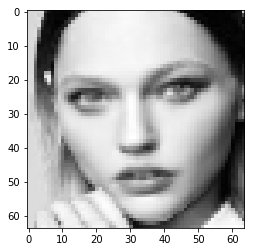

The 95th picture of valid negatives


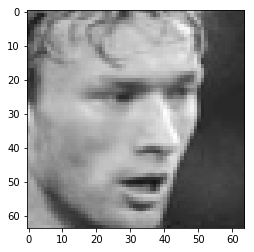

The 96th picture of valid negatives


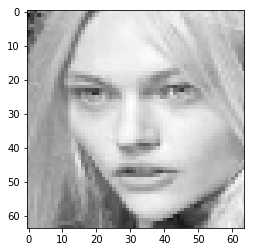

The 97th picture of valid negatives


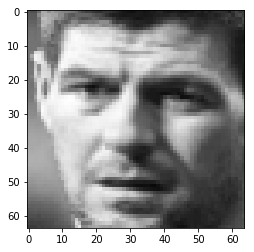

The 98th picture of valid negatives


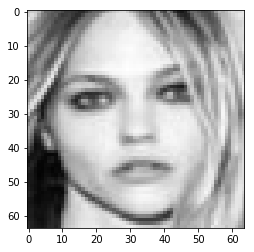

The 99th picture of valid negatives


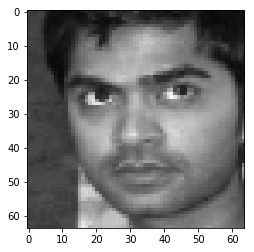

The 100th picture of valid negatives


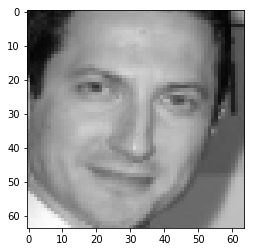

The 101th picture of valid negatives


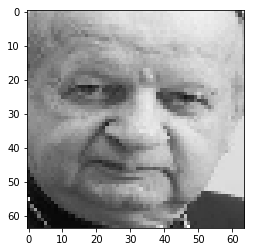

The 102th picture of valid negatives


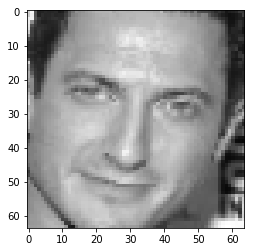

The 103th picture of valid negatives


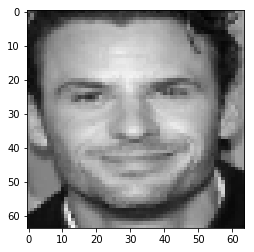

The 104th picture of valid negatives


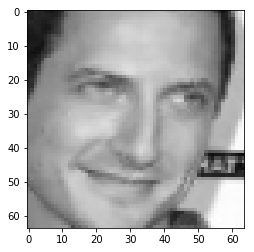

The 105th picture of valid negatives


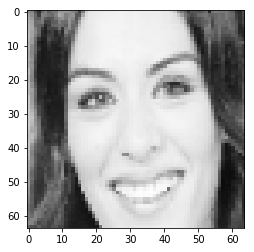

The 106th picture of valid negatives


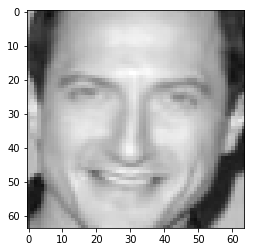

The 107th picture of valid negatives


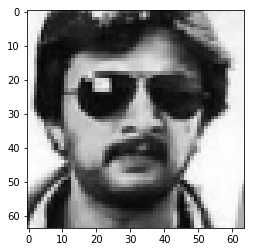

The 108th picture of valid negatives


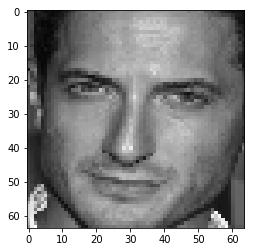

The 109th picture of valid negatives


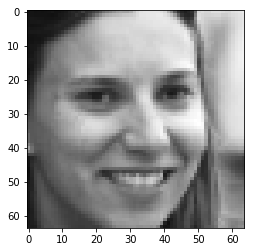

The 110th picture of valid negatives


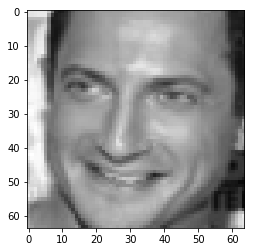

The 111th picture of valid negatives


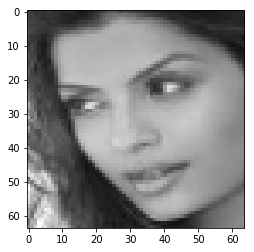

The 112th picture of valid negatives


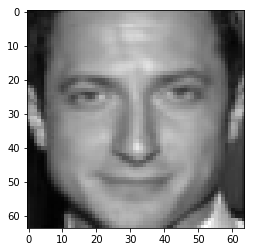

The 113th picture of valid negatives


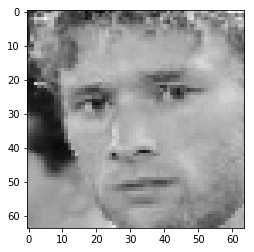

The 114th picture of valid negatives


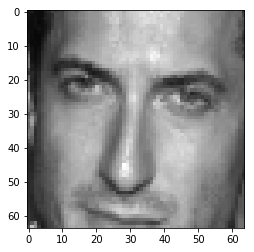

The 115th picture of valid negatives


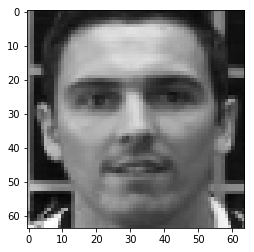

The 116th picture of valid negatives


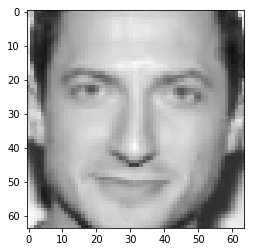

The 117th picture of valid negatives


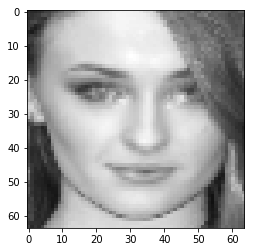

The 118th picture of valid negatives


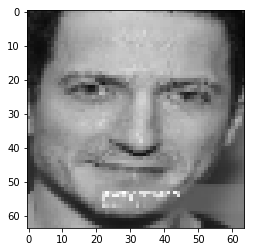

The 119th picture of valid negatives


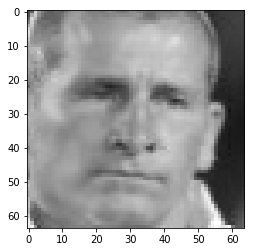

The 120th picture of valid negatives


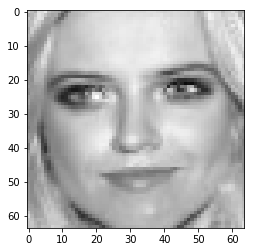

The 121th picture of valid negatives


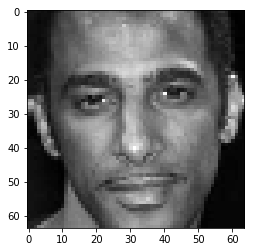

The 122th picture of valid negatives


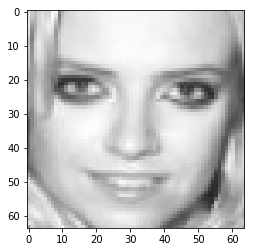

The 123th picture of valid negatives


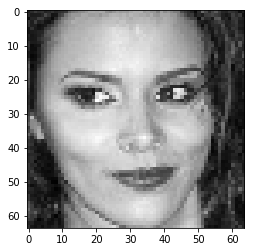

The 124th picture of valid negatives


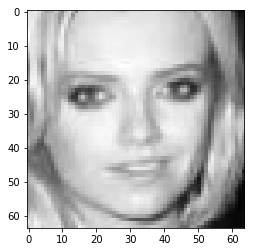

The 125th picture of valid negatives


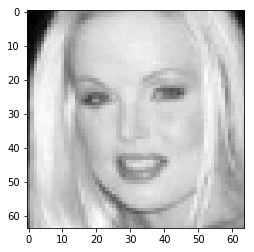

The 126th picture of valid negatives


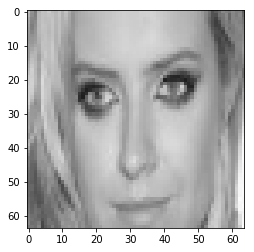

The 127th picture of valid negatives


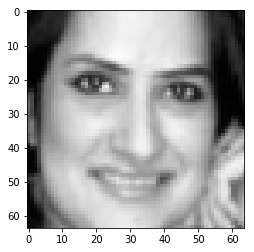

The 128th picture of valid negatives


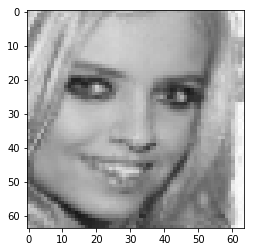

The 129th picture of valid negatives


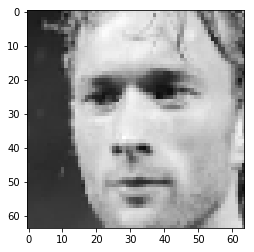

The 130th picture of valid negatives


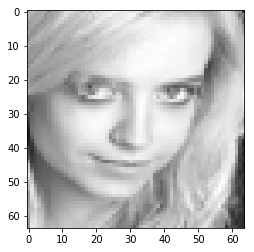

The 131th picture of valid negatives


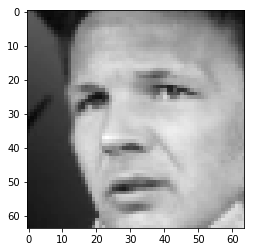

The 132th picture of valid negatives


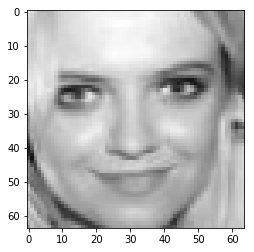

The 133th picture of valid negatives


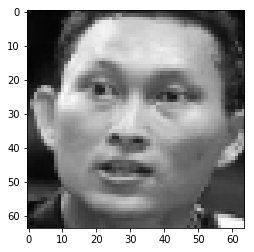

The 134th picture of valid negatives


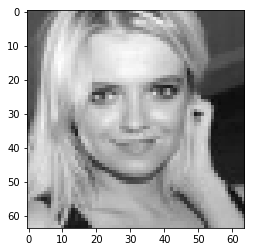

The 135th picture of valid negatives


KeyboardInterrupt: 

In [9]:
# Displaying valid negatives.
for i in range(len(X_valid_negatives)):
    print("The %ith picture of valid negatives" %(i+1))
    plt.imshow(array_to_img(X_valid_negatives[i].reshape(X_valid_negatives[i].shape + (1,))))
    plt.show()

## Preproccessing test data

In [10]:
# Creating lists for the test data.
# The positives will contain pairs from the same person.
# The negatives will contain pairs from two different persons.
X_test_positives = []
Y_test_positives = []
X_test_negatives = []
Y_test_negatives = []

# The test data is cut in half annd loaded into the lists defined above.
half_index_test = int((0.5*len(X_test)//picture_per_person)*picture_per_person)
X_test_positives = X_test[0:half_index_test]
Y_test_positives = Y_test[0:half_index_test]
print("Number of elements in X_test_positives: %i" %(len(X_test_positives)))
print("Number of elements in Y_test_positives: %i" %(len(Y_test_positives)))

# The negatives list is made with the following technique:
# In the first half of the list, to every second place we insert a random element from the second half.
# This way every two following pictures are from different persons.
half_index_test_negatives = half_index_test + int((0.5*len(Y_test[half_index_test:])//picture_per_person)*picture_per_person)
x_test_negatives = X_test[half_index_test:half_index_test_negatives]
y_test_negatives = Y_test[half_index_test:half_index_test_negatives]
randperm = np.random.permutation(len(Y_test[half_index_test_negatives:]))
for i in range(int(len(x_test_negatives)/picture_per_person)):
    for j in range(picture_per_person):
        X_test_negatives.append(x_test_negatives[i*picture_per_person+j])
        X_test_negatives.append(X_test[randperm[i*picture_per_person+j]+half_index_test_negatives])
        Y_test_negatives.append(y_test_negatives[i*picture_per_person+j])
        Y_test_negatives.append(Y_test[randperm[i*picture_per_person+j]+half_index_test_negatives])
print("Number of elements in X_test_negatives: %i" %(len(X_test_negatives)))
print("Number of elements in Y_test_negatives: %i" %(len(Y_test_negatives)))

=================== Test data ===================
Number of elements in X_test_positives: 4410
Number of elements in Y_test_positives: 4410
Number of elements in X_test_negatives: 4400
Number of elements in Y_test_negatives: 4400


The 1th picture of test positives


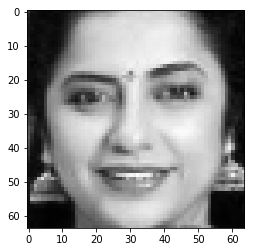

The 2th picture of test positives


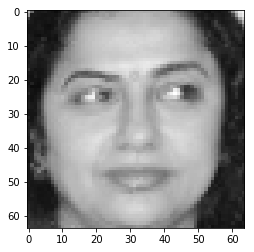

The 3th picture of test positives


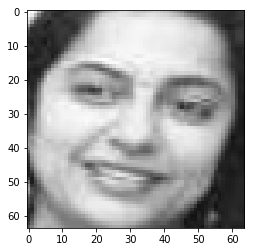

The 4th picture of test positives


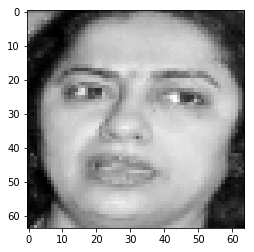

The 5th picture of test positives


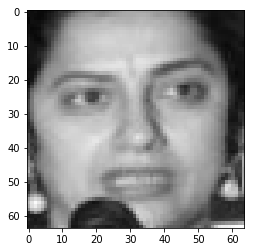

The 6th picture of test positives


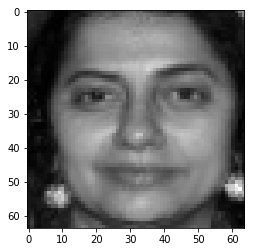

The 7th picture of test positives


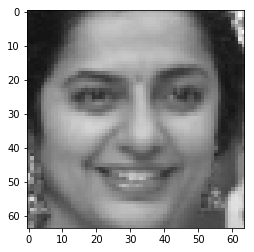

The 8th picture of test positives


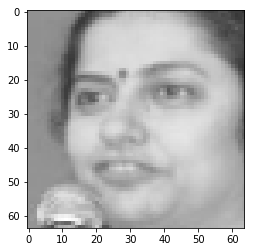

The 9th picture of test positives


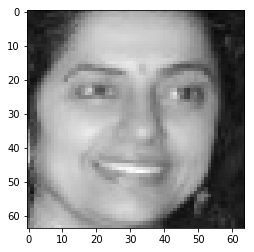

The 10th picture of test positives


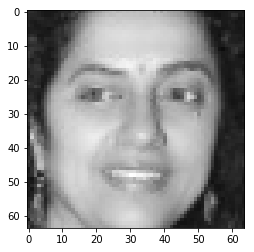

The 11th picture of test positives


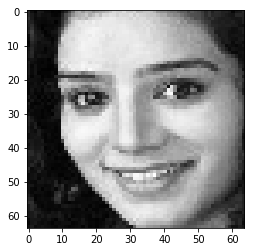

The 12th picture of test positives


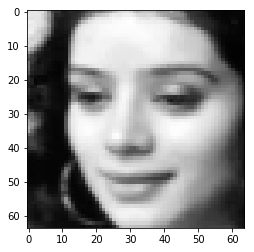

The 13th picture of test positives


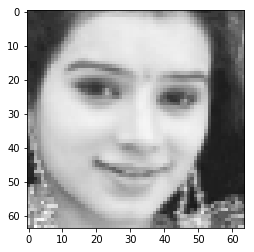

The 14th picture of test positives


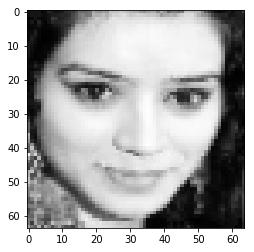

The 15th picture of test positives


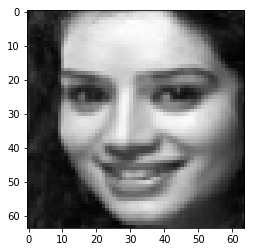

The 16th picture of test positives


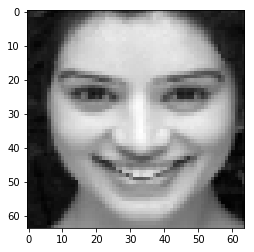

The 17th picture of test positives


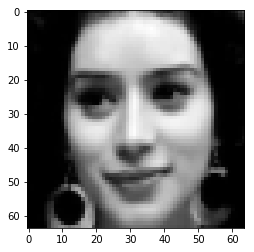

The 18th picture of test positives


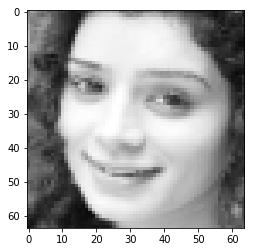

The 19th picture of test positives


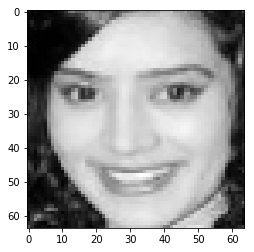

The 20th picture of test positives


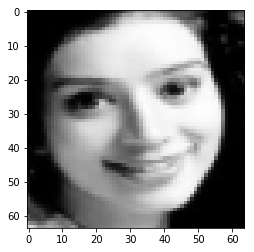

The 21th picture of test positives


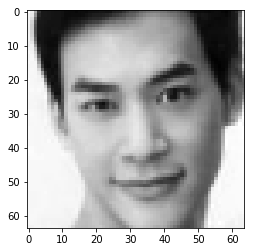

The 22th picture of test positives


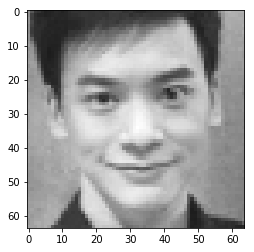

The 23th picture of test positives


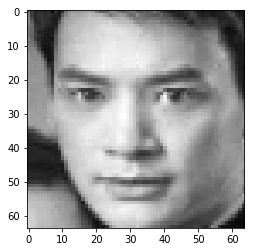

The 24th picture of test positives


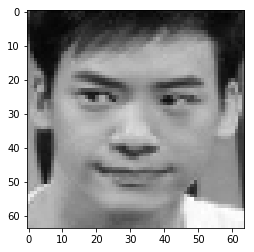

The 25th picture of test positives


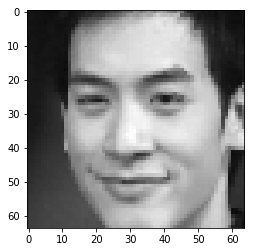

The 26th picture of test positives


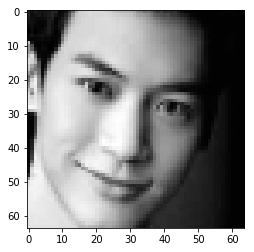

The 27th picture of test positives


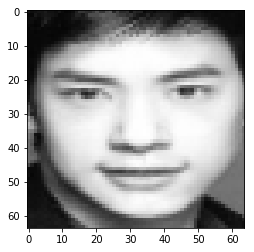

The 28th picture of test positives


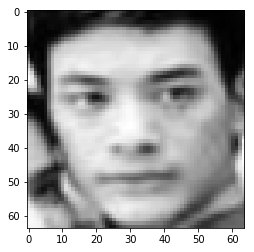

The 29th picture of test positives


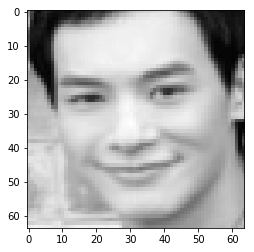

The 30th picture of test positives


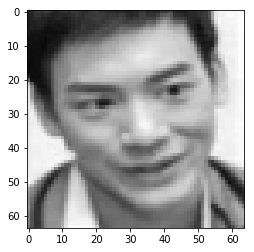

The 31th picture of test positives


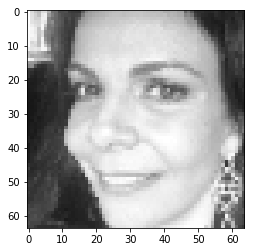

The 32th picture of test positives


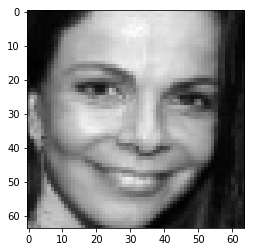

The 33th picture of test positives


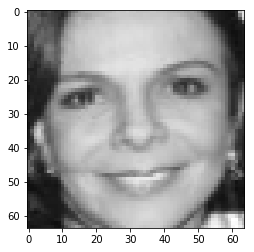

The 34th picture of test positives


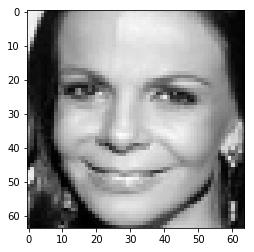

The 35th picture of test positives


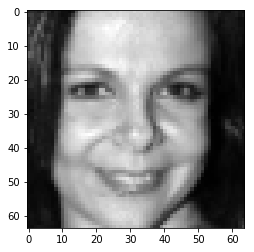

The 36th picture of test positives


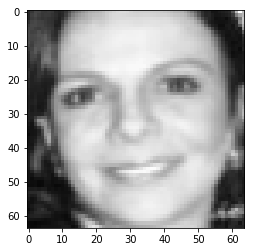

The 37th picture of test positives


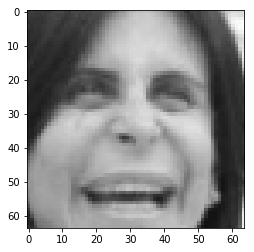

The 38th picture of test positives


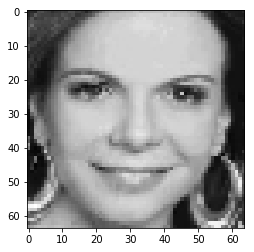

The 39th picture of test positives


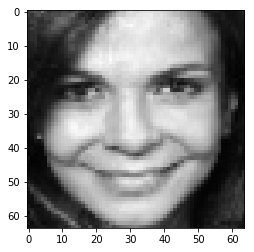

The 40th picture of test positives


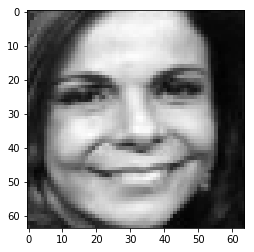

The 41th picture of test positives


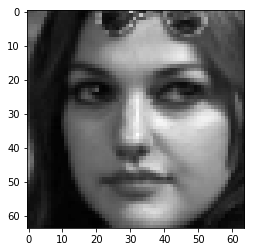

The 42th picture of test positives


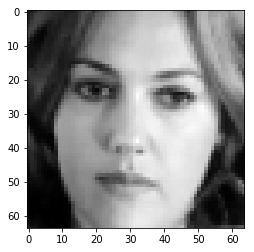

The 43th picture of test positives


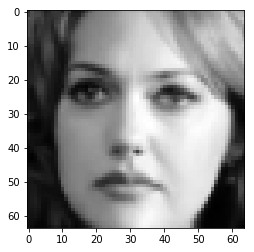

The 44th picture of test positives


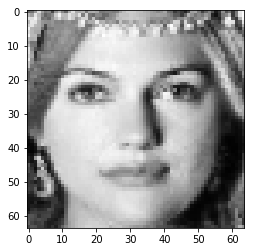

The 45th picture of test positives


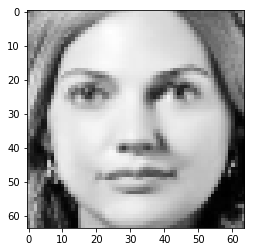

The 46th picture of test positives


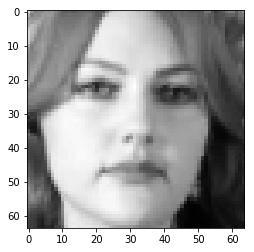

The 47th picture of test positives


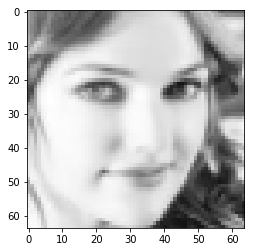

The 48th picture of test positives


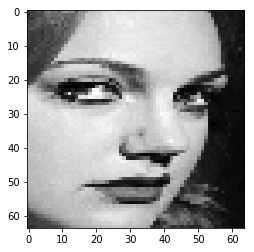

The 49th picture of test positives


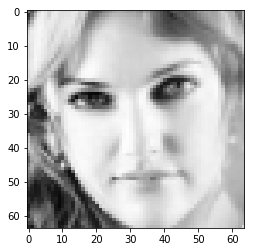

The 50th picture of test positives


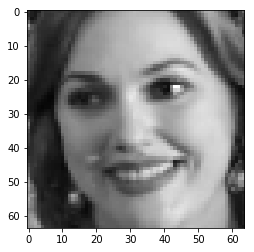

The 51th picture of test positives


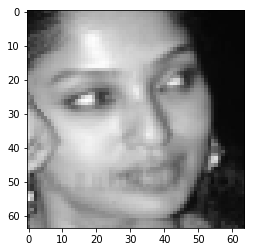

The 52th picture of test positives


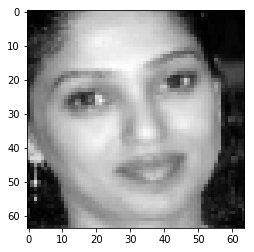

The 53th picture of test positives


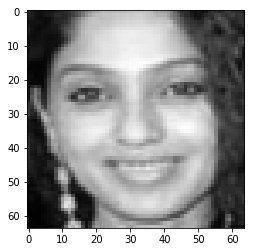

The 54th picture of test positives


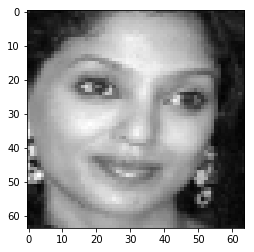

The 55th picture of test positives


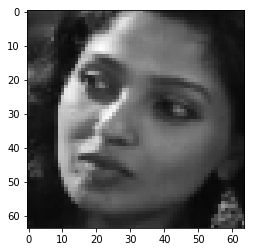

The 56th picture of test positives


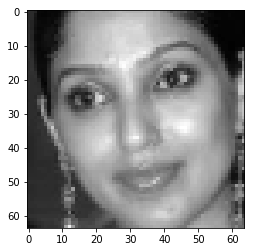

The 57th picture of test positives


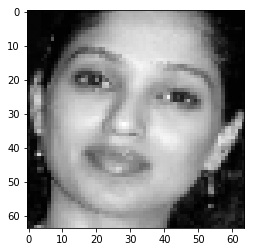

The 58th picture of test positives


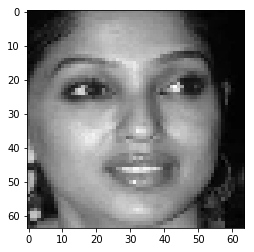

The 59th picture of test positives


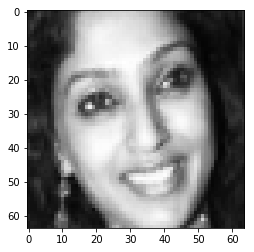

The 60th picture of test positives


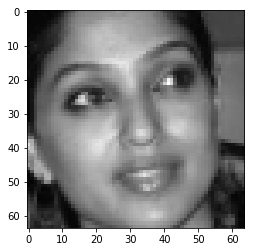

The 61th picture of test positives


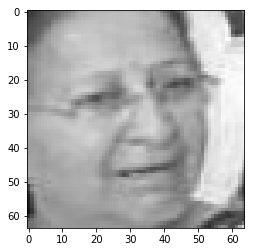

The 62th picture of test positives


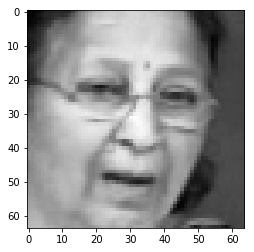

The 63th picture of test positives


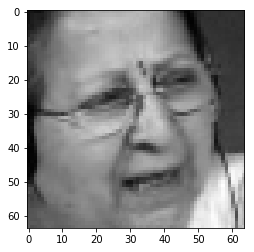

The 64th picture of test positives


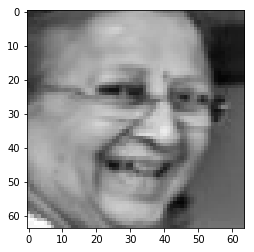

The 65th picture of test positives


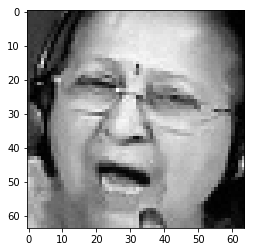

The 66th picture of test positives


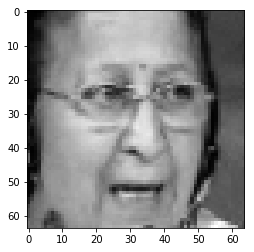

The 67th picture of test positives


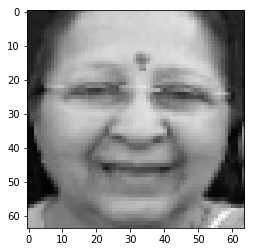

The 68th picture of test positives


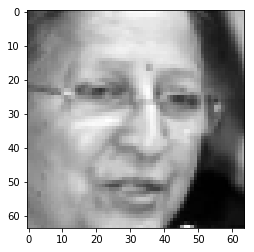

The 69th picture of test positives


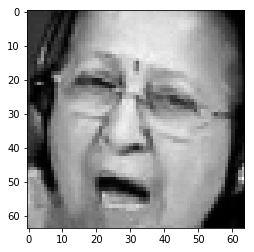

The 70th picture of test positives


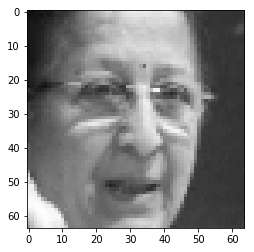

The 71th picture of test positives


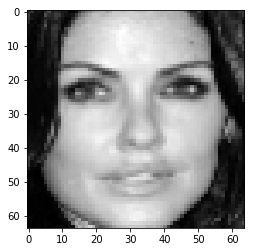

The 72th picture of test positives


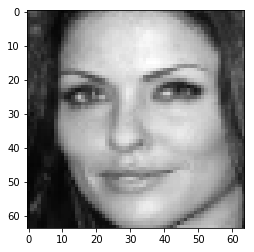

The 73th picture of test positives


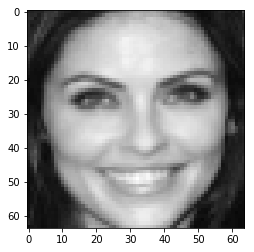

The 74th picture of test positives


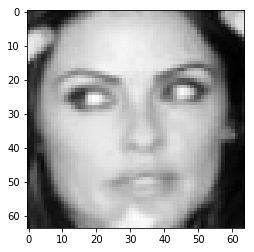

The 75th picture of test positives


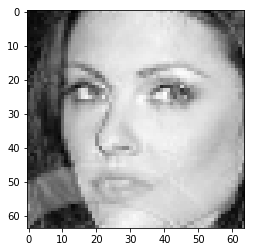

The 76th picture of test positives


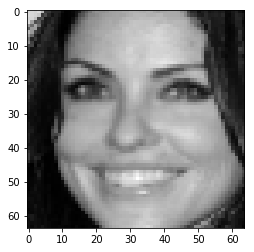

The 77th picture of test positives


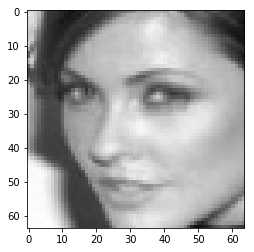

The 78th picture of test positives


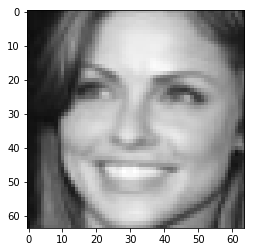

The 79th picture of test positives


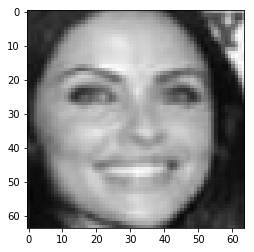

The 80th picture of test positives


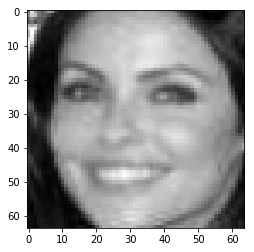

The 81th picture of test positives


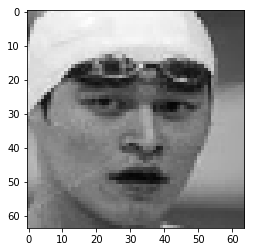

The 82th picture of test positives


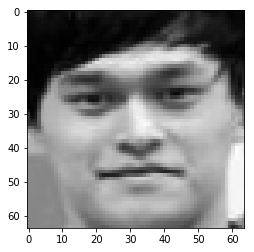

The 83th picture of test positives


KeyboardInterrupt: 

In [11]:
# Displaying test positives.
for i in range(len(X_test_positives)):
    print("The %ith picture of test positives" %(i+1))
    plt.imshow(array_to_img(X_test_positives[i].reshape(X_test_positives[i].shape + (1,))))
    plt.show()

The 1th picture of test negatives


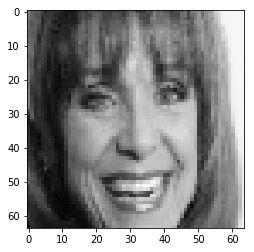

The 2th picture of test negatives


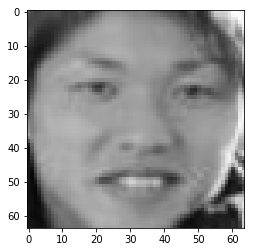

The 3th picture of test negatives


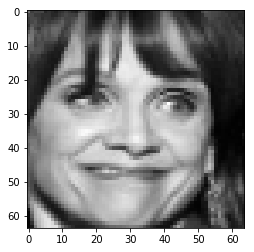

The 4th picture of test negatives


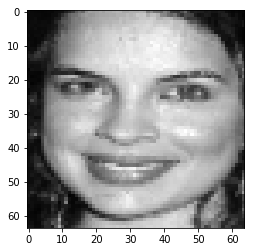

The 5th picture of test negatives


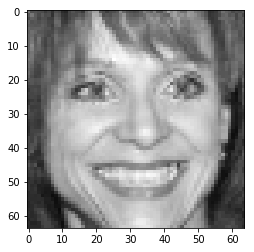

The 6th picture of test negatives


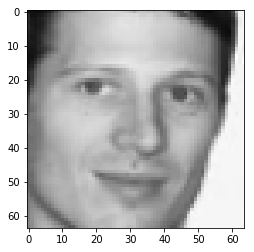

The 7th picture of test negatives


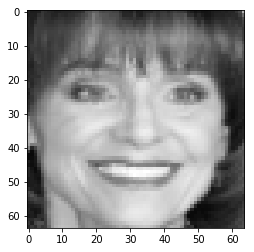

The 8th picture of test negatives


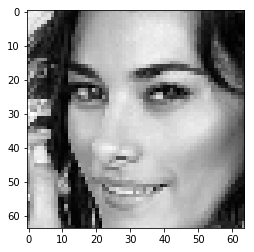

The 9th picture of test negatives


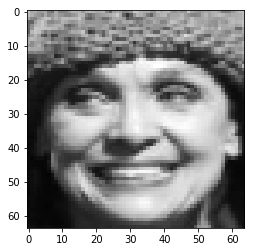

The 10th picture of test negatives


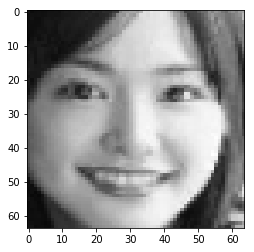

The 11th picture of test negatives


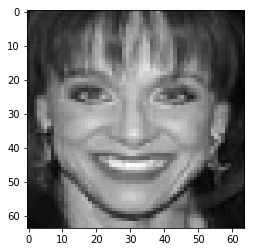

The 12th picture of test negatives


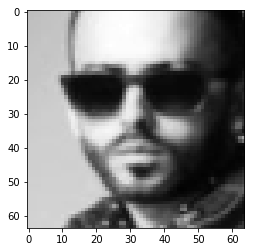

The 13th picture of test negatives


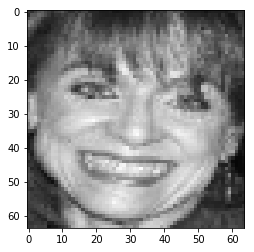

The 14th picture of test negatives


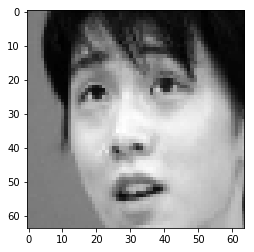

The 15th picture of test negatives


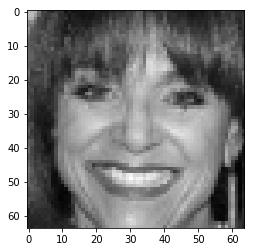

The 16th picture of test negatives


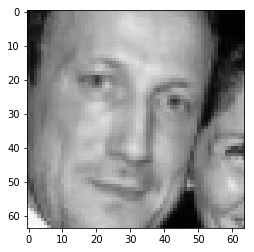

The 17th picture of test negatives


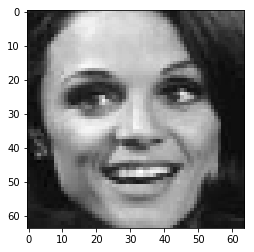

The 18th picture of test negatives


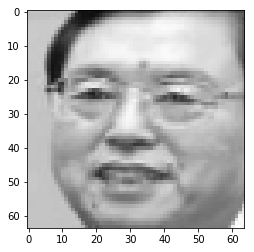

The 19th picture of test negatives


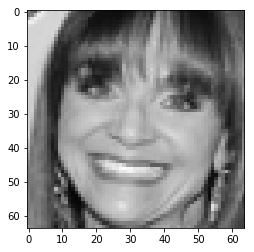

The 20th picture of test negatives


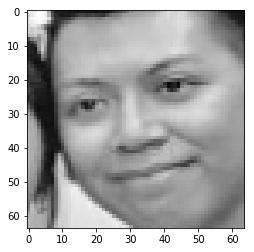

The 21th picture of test negatives


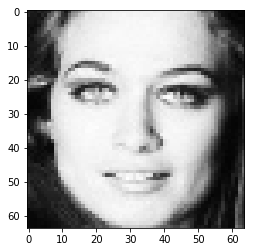

The 22th picture of test negatives


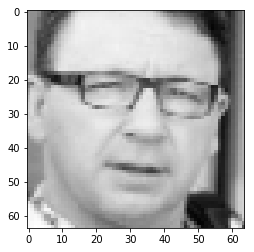

The 23th picture of test negatives


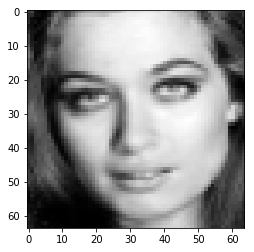

The 24th picture of test negatives


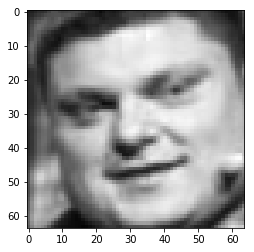

The 25th picture of test negatives


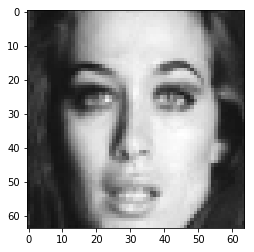

The 26th picture of test negatives


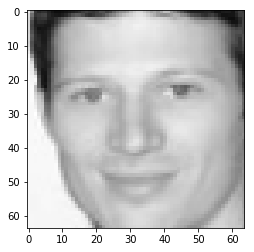

The 27th picture of test negatives


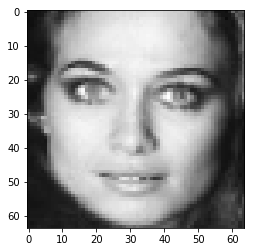

The 28th picture of test negatives


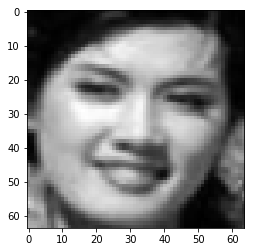

The 29th picture of test negatives


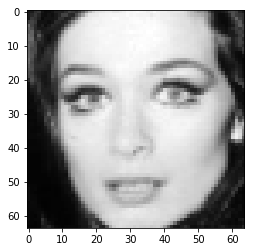

The 30th picture of test negatives


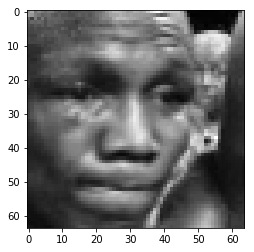

The 31th picture of test negatives


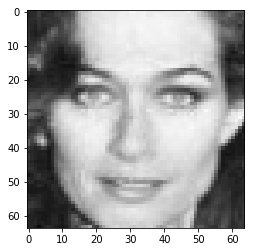

The 32th picture of test negatives


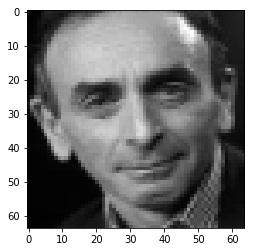

The 33th picture of test negatives


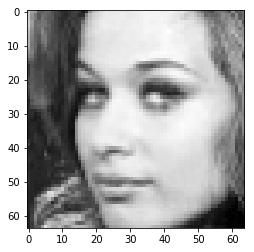

The 34th picture of test negatives


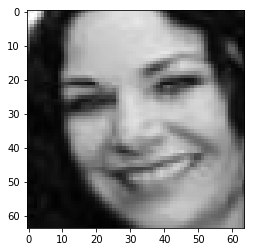

The 35th picture of test negatives


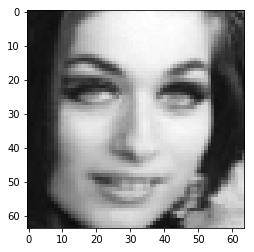

The 36th picture of test negatives


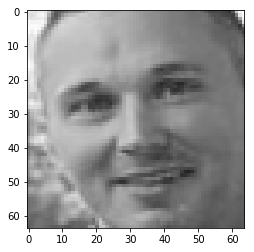

The 37th picture of test negatives


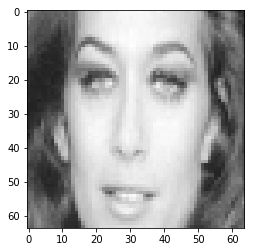

The 38th picture of test negatives


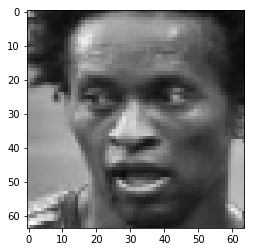

The 39th picture of test negatives


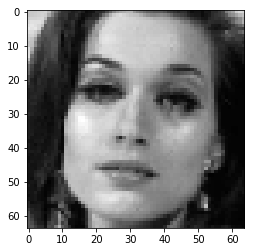

The 40th picture of test negatives


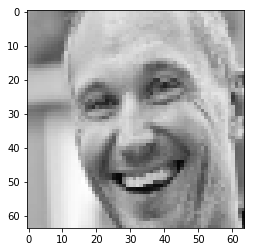

The 41th picture of test negatives


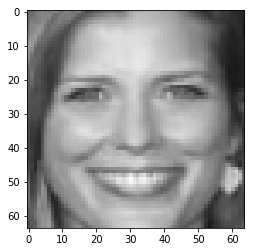

The 42th picture of test negatives


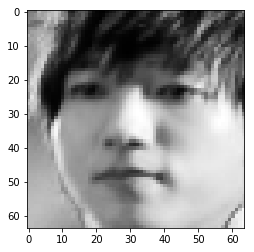

The 43th picture of test negatives


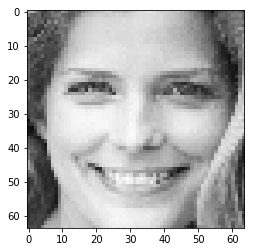

The 44th picture of test negatives


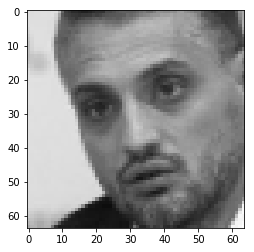

The 45th picture of test negatives


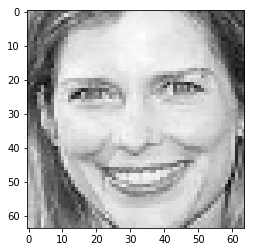

The 46th picture of test negatives


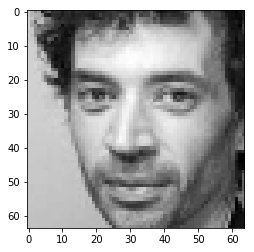

The 47th picture of test negatives


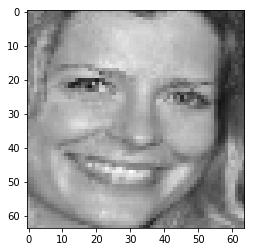

The 48th picture of test negatives


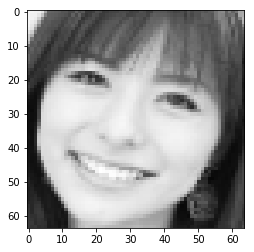

The 49th picture of test negatives


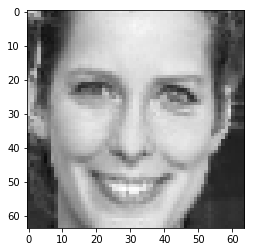

The 50th picture of test negatives


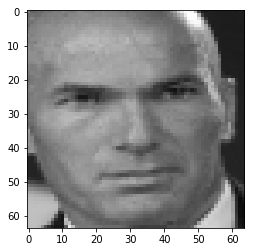

The 51th picture of test negatives


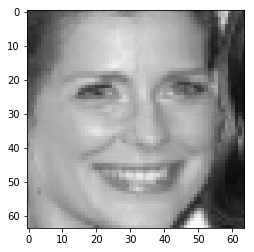

The 52th picture of test negatives


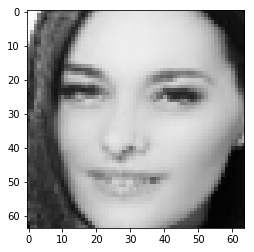

The 53th picture of test negatives


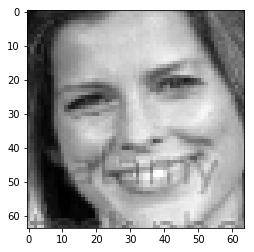

The 54th picture of test negatives


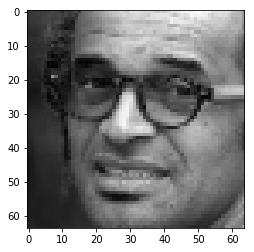

The 55th picture of test negatives


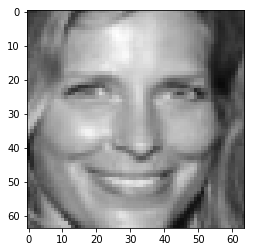

The 56th picture of test negatives


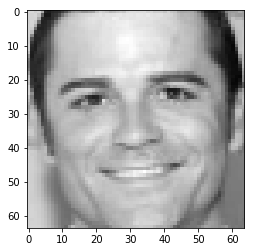

The 57th picture of test negatives


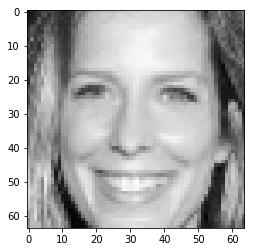

The 58th picture of test negatives


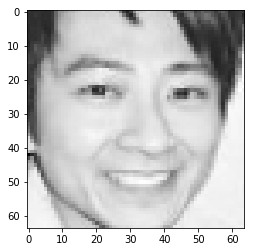

The 59th picture of test negatives


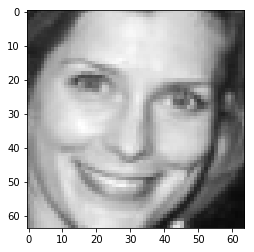

The 60th picture of test negatives


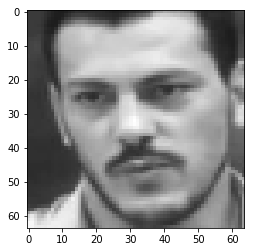

The 61th picture of test negatives


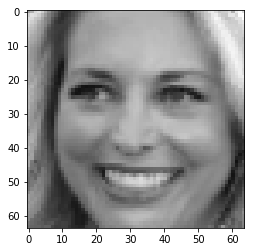

The 62th picture of test negatives


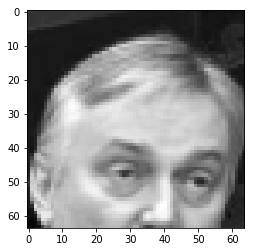

The 63th picture of test negatives


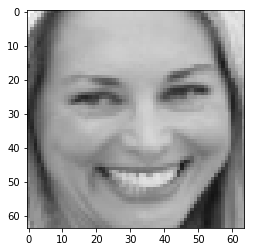

The 64th picture of test negatives


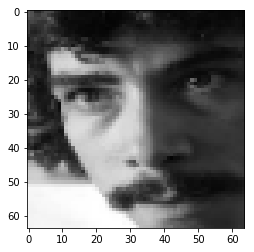

The 65th picture of test negatives


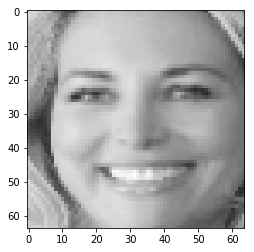

The 66th picture of test negatives


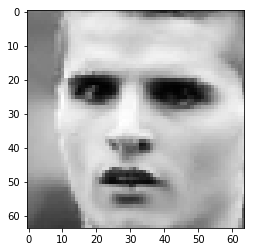

The 67th picture of test negatives


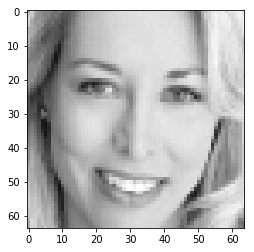

The 68th picture of test negatives


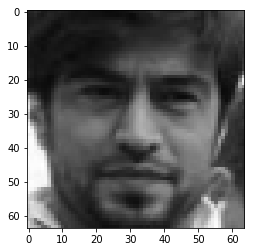

The 69th picture of test negatives


KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [12]:
# Displaying test negatives.
for i in range(len(X_test_negatives)):
    print("The %ith picture of test negatives" %(i+1))
    plt.imshow(array_to_img(X_test_negatives[i].reshape(X_test_negatives[i].shape + (1,))))
    plt.show()